In [59]:
%load_ext autoreload
%autoreload 2
#%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import numpy as np
import pylab as plt
import glob
import os

import scipy.signal as sig
from pprint import pprint

In [17]:
import icewave.display.graphes as graphes
import icewave.tools.maths as maths
import icewave.tools.rw_data as rw

import icewave.tools.datafolders as df

In [320]:
date = '2024_0211'
year,day = date.split('_')

base = df.find_path('Elements',year=year)
print(base)
folder = base+day+'/Drones/'

savefolder = folder+'/Results/'

if not os.path.exists(savefolder):
    os.makedirs(savefolder)
    
filelist = glob.glob(folder+'*.h5')

savefolder
print(filelist)
filename = filelist[1]
print(filename)

/media/turbots/Elements/Share_hublot/Data/
['/media/turbots/Elements/Share_hublot/Data/0211/Drones/interpolated_u_over_buoys_traj_0211_2024.h5', '/media/turbots/Elements/Share_hublot/Data/0211/Drones/real_field_stereo_0211_2024_rectangular_grid.h5']
/media/turbots/Elements/Share_hublot/Data/0211/Drones/real_field_stereo_0211_2024_rectangular_grid.h5


In [18]:
data = rw.read_h5(filename)

In [21]:
data.keys()

<KeysViewHDF5 ['SCALE', 'X', 'Y', 'extents', 'param', 'projected_drone', 'ref_drone', 'synchro', 't', 'u', 'u_shape', 'units']>

In [24]:
for key in ['X','Y','t','u']:
    print(key,data[key].shape)

X (93, 132)
Y (93, 132)
t (3475,)
u (3, 93, 132, 3475)


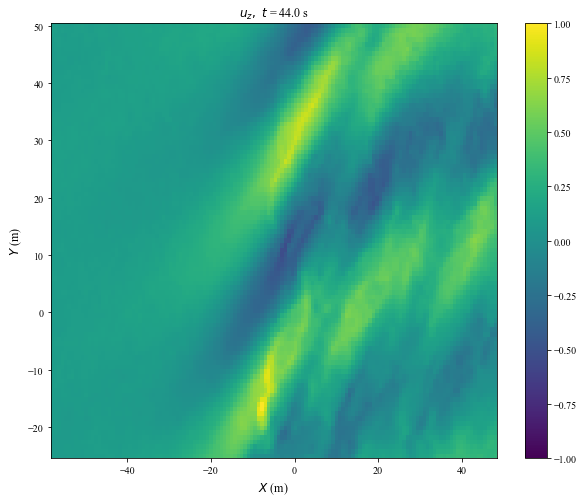

In [809]:
fig,ax = plt.subplots(figsize=(10,8))

X = data['X']
Y = data['Y']
t = data['t']
i=800
t0 = np.round(t[i],decimals=1)
sc = ax.pcolormesh(X,Y,data['u'][2,:,:,i],vmin=-1,vmax=1)
plt.colorbar(sc)

figs = graphes.legende('$X$ (m)','$Y$ (m)',f'$u_z,~t$ = {t0} s')
graphes.save_figs(figs,savedir=savefolder+'/images/',prefix=f'movie_{i}',frmt='png')

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990
1000
1010
1020
1030
1040
1050
1060
1070
1080
1090
1100
1110
1120
1130
1140
1150
1160
1170
1180
1190
1200
1210
1220
1230
1240
1250
1260
1270
1280
1290
1300
1310
1320
1330
1340
1350
1360
1370
1380
1390
1400
1410
1420
1430
1440
1450
1460
1470
1480
1490
0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920


KeyboardInterrupt: 

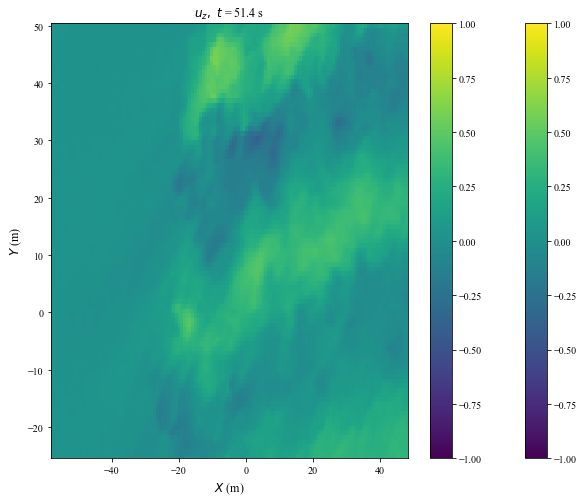

In [60]:
fig,ax = plt.subplots(figsize=(10,8))

X = data['X']
Y = data['Y']
t = data['t']

coords = ['x','y','z']
for j,c in enumerate(coords):
    for i in range(0,1500,10):
        print(i)
        t0 = np.round(t[i],decimals=1)
        sc = ax.pcolormesh(X,Y,data['u'][j,:,:,i],vmin=-1,vmax=1)
        if i==0:
            plt.colorbar(sc)
        
        figs = graphes.legende('$X$ (m)','$Y$ (m)',f'$u_z,~t$ = {t0} s')
        graphes.save_figs(figs,savedir=savefolder+f'/movie_u{c}/',prefix=f'movie_{i}',frmt='png')

In [810]:
[Udy,Udx,Acc] = np.gradient(data['u'],axis=(1,2,3))
#gradient along x,y and t for all components

In [811]:

[Xdy,Xdx] = np.gradient(X)
[Ydy,Ydx] = np.gradient(Y)
dx = Xdx[0,0]
dy = Ydy[0,0]
dt = np.diff(t)[0]

Udx = Udx/dx
Udy = Udy/dy
Acc = Acc/dt

In [813]:
print(Udx.shape)

(3, 93, 132, 3475)


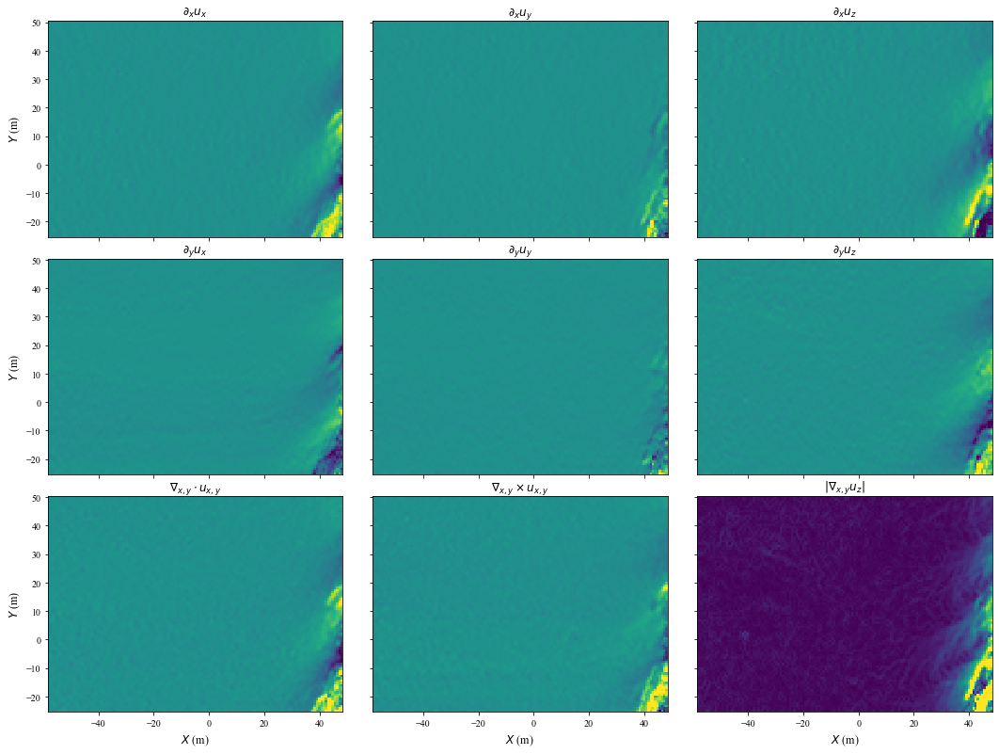

In [1195]:
m=3
n=2+1
fig,axs = plt.subplots(figsize=(6*m,4.5*n),ncols=m,nrows=n,sharex=True,sharey=True)

X = data['X']
Y = data['Y']
i=100

vmax = 0.2
b = 5
sc = axs[0,0].pcolormesh(X,Y,Udx[0,...,i],vmin=-vmax,vmax=vmax)
sc = axs[0,1].pcolormesh(X,Y,Udx[1,...,i],vmin=-vmax,vmax=vmax)
sc = axs[0,2].pcolormesh(X,Y,Udx[2,...,i],vmin=-vmax,vmax=vmax)

sc = axs[1,0].pcolormesh(X,Y,Udy[0,...,i],vmin=-vmax,vmax=vmax)
sc = axs[1,1].pcolormesh(X,Y,Udy[1,...,i],vmin=-vmax,vmax=vmax)
sc = axs[1,2].pcolormesh(X,Y,Udy[2,...,i],vmin=-vmax,vmax=vmax)


div = Udx[0,...]+Udy[1,...]
rot = Udx[1,...]-Udy[0,...]
graduz = np.sqrt(Udx[2,...]**2+Udy[2,...]**2)

sc = axs[2,0].pcolormesh(X,Y,div[...,i],vmin=-vmax,vmax=vmax)
sc = axs[2,1].pcolormesh(X,Y,rot[...,i],vmin=-vmax,vmax=vmax)
sc = axs[2,2].pcolormesh(X,Y,graduz[...,i],vmin=0,vmax=vmax)

#sc = axs[1,2].pcolormesh(X,Y,Udy[2,...,i],vmin=-vmax,vmax=vmax)
#plt.colorbar(sc)

coords = ['x','y','z']

for i,c2 in enumerate(coords[:-1]):
    for j,c1 in enumerate(coords):
        title = f'$\partial_{c2} u_{c1}$'
        if j==0:
            ylabel=r'$Y$ (m)'
        else:
            ylabel=''
        graphes.legende('',ylabel,title,ax=axs[i,j])

graphes.legende('$X$ (m)',r'$Y$ (m)',r'$\nabla_{x,y} \cdot u_{x,y}$',ax=axs[2,0])
graphes.legende('$X$ (m)','',r'$\nabla_{x,y} \times u_{x,y}$',ax=axs[2,1])
graphes.legende('$X$ (m)','',r'$|\nabla_{x,y} u_z|$',ax=axs[2,2])

#graphes.legende('$X$ (m)','$Y$ (m)','title',axs=axs[i,j])

plt.subplots_adjust(hspace=0.1,wspace=0.1)

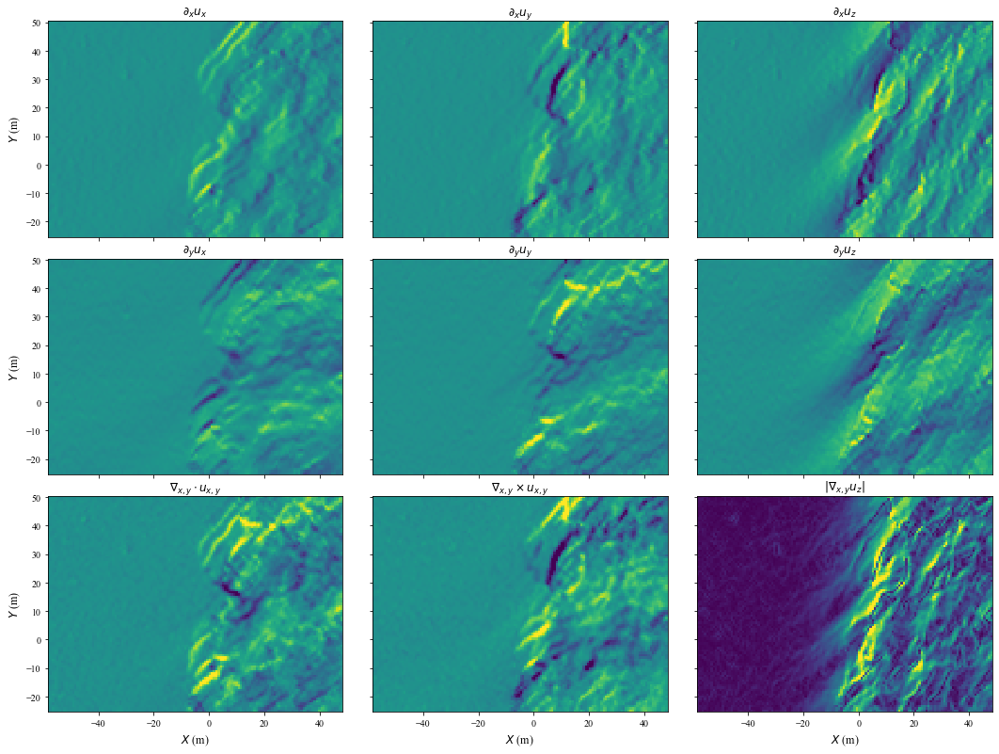

In [834]:
m=3
n=2+1
fig,axs = plt.subplots(figsize=(6*m,4.5*n),ncols=m,nrows=n,sharex=True,sharey=True)

X = data['X']
Y = data['Y']

i=700

vmax = 0.2
b = 5
sc = axs[0,0].pcolormesh(X,Y,Udx[0,...,i],vmin=-vmax,vmax=vmax)
sc = axs[0,1].pcolormesh(X,Y,Udx[1,...,i],vmin=-vmax,vmax=vmax)
sc = axs[0,2].pcolormesh(X,Y,Udx[2,...,i],vmin=-vmax,vmax=vmax)

sc = axs[1,0].pcolormesh(X,Y,Udy[0,...,i],vmin=-vmax,vmax=vmax)
sc = axs[1,1].pcolormesh(X,Y,Udy[1,...,i],vmin=-vmax,vmax=vmax)
sc = axs[1,2].pcolormesh(X,Y,Udy[2,...,i],vmin=-vmax,vmax=vmax)


div = Udx[0,...]+Udy[1,...]
rot = Udx[1,...]-Udy[0,...]
graduz = np.sqrt(Udx[2,...]**2+Udy[2,...]**2)

sc = axs[2,0].pcolormesh(X,Y,div[...,i],vmin=-vmax,vmax=vmax)
sc = axs[2,1].pcolormesh(X,Y,rot[...,i],vmin=-vmax,vmax=vmax)
sc = axs[2,2].pcolormesh(X,Y,graduz[...,i],vmin=0,vmax=vmax)

#sc = axs[1,2].pcolormesh(X,Y,Udy[2,...,i],vmin=-vmax,vmax=vmax)
#plt.colorbar(sc)

coords = ['x','y','z']

for i,c2 in enumerate(coords[:-1]):
    for j,c1 in enumerate(coords):
        title = f'$\partial_{c2} u_{c1}$'
        if j==0:
            ylabel=r'$Y$ (m)'
        else:
            ylabel=''
        graphes.legende('',ylabel,title,ax=axs[i,j])

graphes.legende('$X$ (m)',r'$Y$ (m)',r'$\nabla_{x,y} \cdot u_{x,y}$',ax=axs[2,0])
graphes.legende('$X$ (m)','',r'$\nabla_{x,y} \times u_{x,y}$',ax=axs[2,1])
graphes.legende('$X$ (m)','',r'$|\nabla_{x,y} u_z|$',ax=axs[2,2])

#graphes.legende('$X$ (m)','$Y$ (m)','title',axs=axs[i,j])

plt.subplots_adjust(hspace=0.1,wspace=0.1)

(18.0, 70.0)

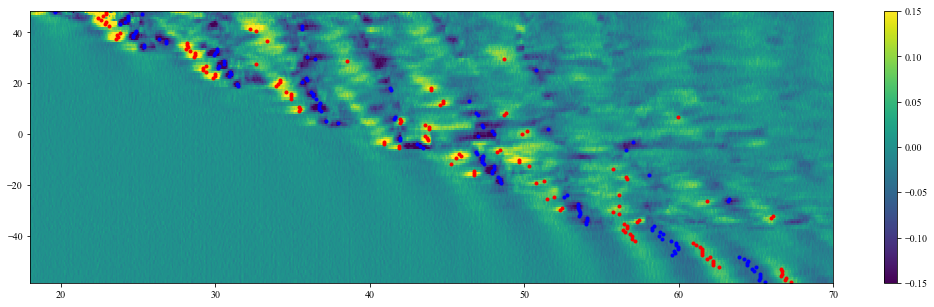

In [846]:
x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape


i0 = 30

fig,ax = plt.subplots(figsize=(18,5))
sc = ax.pcolormesh(Xt,Tx,rot[i0,...],vmin=-0.15,vmax=0.15)

indmax = np.argmax(rot[i0,...],axis=1)
indmin = np.argmin(rot[i0,...],axis=1)

ax.plot(t[indmax],x,'r.')
ax.plot(t[indmin],x,'b.')

plt.colorbar(sc)
ax.set_xlim([18,70])

(18.0, 70.0)

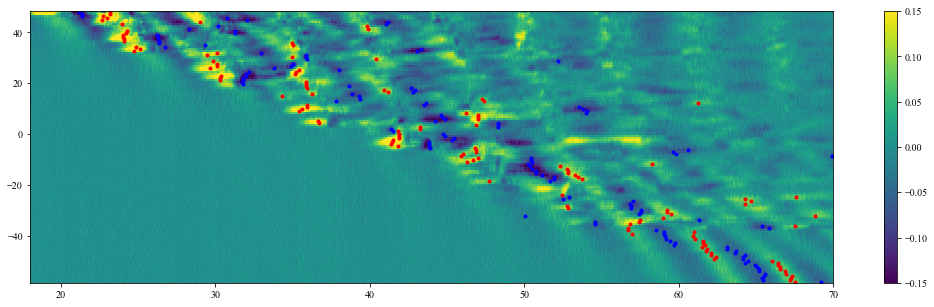

In [847]:
x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape


i0 = 30

fig,ax = plt.subplots(figsize=(18,5))
sc = ax.pcolormesh(Xt,Tx,div[i0,...],vmin=-0.15,vmax=0.15)

indmax = np.argmax(div[i0,...],axis=1)
indmin = np.argmin(div[i0,...],axis=1)

ax.plot(t[indmax],x,'r.')
ax.plot(t[indmin],x,'b.')

plt.colorbar(sc)
ax.set_xlim([18,70])

(18.0, 70.0)

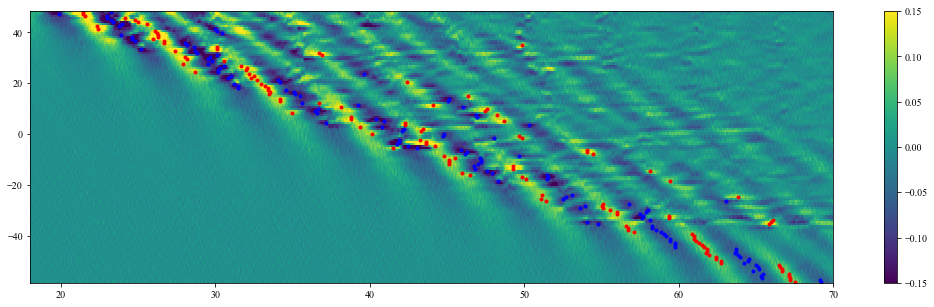

In [848]:
x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape


i0 = 30

fig,ax = plt.subplots(figsize=(18,5))
sc = ax.pcolormesh(Xt,Tx,Udx[2,i0,...],vmin=-0.15,vmax=0.15)

indmax = np.argmax(Udx[2,i0,...],axis=1)
indmin = np.argmin(Udx[2,i0,...],axis=1)

ax.plot(t[indmax],x,'r.')
ax.plot(t[indmin],x,'b.')

plt.colorbar(sc)
ax.set_xlim([18,70])

(18.0, 70.0)

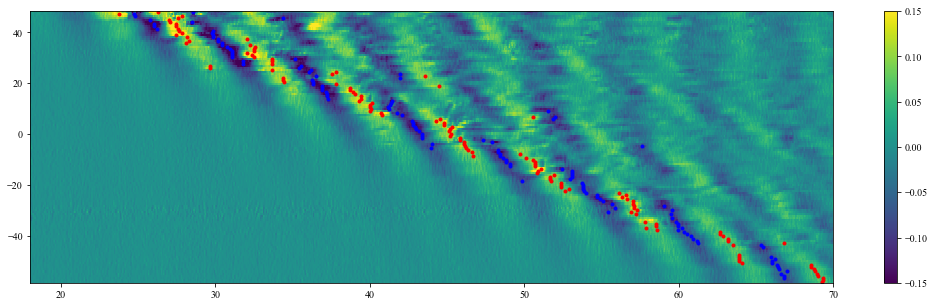

In [851]:
x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape


i0 = 70

fig,ax = plt.subplots(figsize=(18,5))
sc = ax.pcolormesh(Xt,Tx,Udy[2,i0,...],vmin=-0.15,vmax=0.15)

indmax = np.argmax(Udy[2,i0,...],axis=1)
indmin = np.argmin(Udy[2,i0,...],axis=1)

ax.plot(t[indmax],x,'r.')
ax.plot(t[indmin],x,'b.')

plt.colorbar(sc)
ax.set_xlim([18,70])

In [861]:
#criterion on duz/dy

x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape

m={}
m['imaxs']=np.zeros((ny,nx))
m['imins']=np.zeros((ny,nx))
m['tmaxs']=np.zeros((ny,nx))
m['tmins']=np.zeros((ny,nx))

for i0 in range(ny):
    indmax = np.argmax(Udy[2,i0,...],axis=1)
    indmin = np.argmin(Udy[2,i0,...],axis=1)
    
    m['imaxs'][i0,:]=indmax
    m['imins'][i0,:]=indmin
    m['tmaxs'][i0,:]=t[indmax]
    m['tmins'][i0,:]=t[indmin]
 

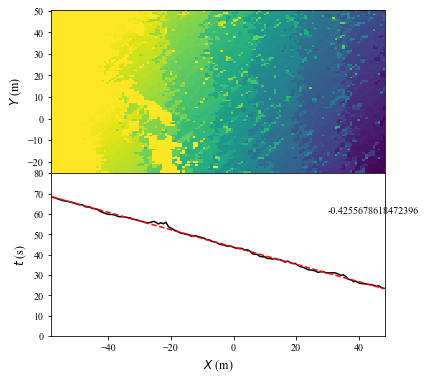

In [873]:
fig,axs = plt.subplots(figsize=(6,6),nrows=2,sharex=True)

X = data['X']
Y = data['Y']

ax = axs[0]
sc = ax.pcolormesh(X,Y,m['tmaxs'],vmin=20,vmax=60)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)

ax = axs[1]
x = X[0,:]
tmed = np.median(m['tmaxs'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende(r'$X$ (m)','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

plt.subplots_adjust(hspace=0)

In [1212]:
#criterion on div

x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape

m={}
var = 'rot'
m[f'imaxs_{var}']=np.zeros((ny,nx))
m[f'imins_{var}']=np.zeros((ny,nx))
m[f'tmaxs_{var}']=np.zeros((ny,nx))
m[f'tmins_{var}']=np.zeros((ny,nx))
m[f'vmaxs_{var}']=np.zeros((ny,nx))
m[f'vmins_{var}']=np.zeros((ny,nx))

tmax = 1600
for i0 in range(ny):
    indmax = np.argmax(rot[i0,:,:tmax],axis=1)
    indmin = np.argmin(rot[i0,:,:tmax],axis=1)
    
    m[f'imaxs_{var}'][i0,:]=indmax
    m[f'imins_{var}'][i0,:]=indmin
    m[f'tmaxs_{var}'][i0,:]=t[indmax]
    m[f'tmins_{var}'][i0,:]=t[indmin]

    m[f'vmaxs_{var}'][i0,:]=np.asarray([rot[i0,j,ind] for j,ind in enumerate(indmax)])
    m[f'vmins_{var}'][i0,:]=np.asarray([rot[i0,j,ind] for j,ind in enumerate(indmin)])
 

In [879]:
t[1500]

67.40073406740073

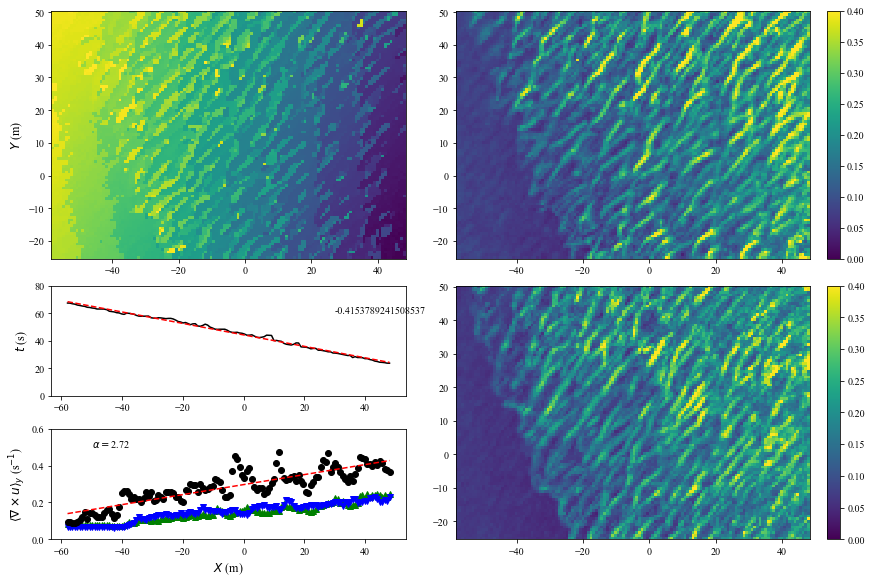

In [954]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

var = 'rot'

X = data['X']
Y = data['Y']

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)

plt.colorbar(sc)

ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)

ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]#compute the value of the largest 5% of the max for each x

ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')

p1 = np.polyfit(x,v90,1)
ax.plot(x,np.polyval(p1,x),'r--')
ax.text(-50,0.5,r'$\alpha = $'+f'{np.round(p1[0]*1000,decimals=2)}')


ax.set_ylim([0,0.6])
figs = graphes.legende(r'$X$ (m)',r'$\langle \nabla \times u \rangle_y$ (s$^{-1}$)','',ax=ax)


graphes.save_figs(figs,savedir=savefolder,prefix=f'Criterion_{var}_',overwrite=True)

(0.0, 9.0)

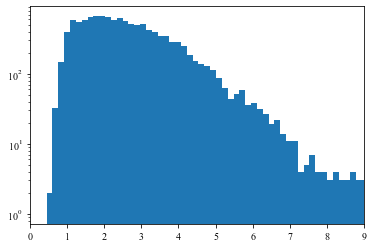

In [955]:

norm_max = np.reshape(m[f'vmaxs_{var}']/np.std(m[f'vmaxs_{var}'],axis=0)[None,:],(nx*ny,))

plt.hist(norm_max,100)
plt.yscale('log')
plt.xlim([0,9])

In [1213]:
#criterion on div

x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape

var = 'div'
m[f'imaxs_{var}']=np.zeros((ny,nx))
m[f'imins_{var}']=np.zeros((ny,nx))
m[f'tmaxs_{var}']=np.zeros((ny,nx))
m[f'tmins_{var}']=np.zeros((ny,nx))
m[f'vmaxs_{var}']=np.zeros((ny,nx))
m[f'vmins_{var}']=np.zeros((ny,nx))

tmax = 1600
for i0 in range(ny):
    indmax = np.argmax(div[i0,:,:tmax],axis=1)
    indmin = np.argmin(div[i0,:,:tmax],axis=1)
    
    m[f'imaxs_{var}'][i0,:]=indmax
    m[f'imins_{var}'][i0,:]=indmin
    m[f'tmaxs_{var}'][i0,:]=t[indmax]
    m[f'tmins_{var}'][i0,:]=t[indmin]

    m[f'vmaxs_{var}'][i0,:]=np.asarray([div[i0,j,ind] for j,ind in enumerate(indmax)])
    m[f'vmins_{var}'][i0,:]=np.asarray([div[i0,j,ind] for j,ind in enumerate(indmin)])
 

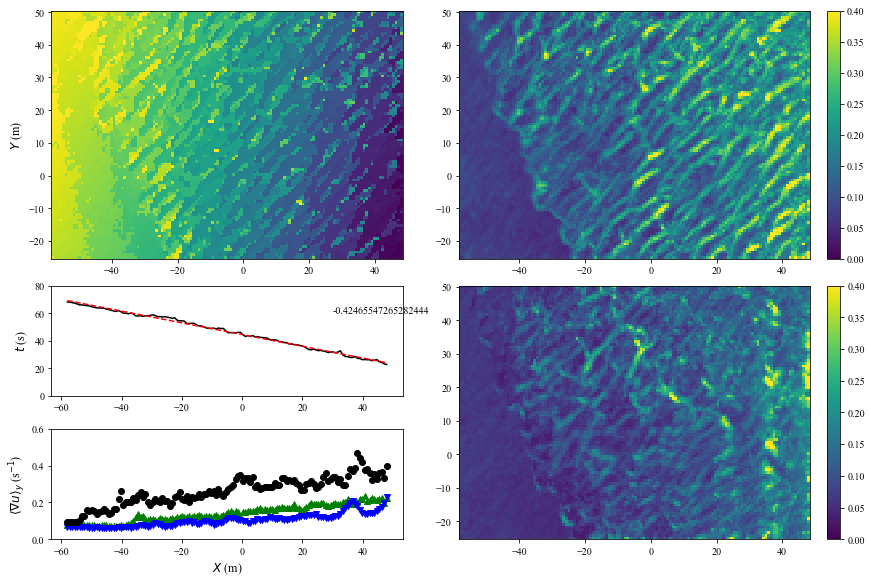

In [958]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']
var = 'div'

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)

plt.colorbar(sc)

ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)

ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]


ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')

ax.set_ylim([0,0.6])
figs = graphes.legende(r'$X$ (m)',r'$\langle \nabla u \rangle_y$ (s$^{-1}$)','',ax=ax)


#graphes.save_figs(figs,savedir=savefolder,prefix='Criterion_div_',overwrite=True)

In [1202]:
m[f'imaxs_{var}']

array([[1412., 1412., 1412., ...,  136.,   48.,   44.],
       [1541., 1412., 1419., ...,  146.,  147.,   39.],
       [1435., 1425., 1423., ...,   61.,  145.,  110.],
       ...,
       [1556., 1554., 1549., ...,  298.,  290.,  290.],
       [1551., 1556., 1547., ...,  306.,  422.,  422.],
       [1554., 1548., 1555., ...,  308.,  568.,  414.]])

In [1606]:
#criterion on div

#criterion on div

x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape

var = 'Udx'

m[f'imaxs_{var}']=np.zeros((ny,nx))
m[f'imins_{var}']=np.zeros((ny,nx))
m[f'tmaxs_{var}']=np.zeros((ny,nx))
m[f'tmins_{var}']=np.zeros((ny,nx))
m[f'vmaxs_{var}']=np.zeros((ny,nx))
m[f'vmins_{var}']=np.zeros((ny,nx))

tmax = 1600
fc = 0.05
[b,a] = sig.butter(4,fc,'high')

y_high = np.zeros((nx,tmax))
for i0 in range(ny):
    y_high = Udx[2,i0,:,:tmax]
    #for j in range(nx):
    #    y_high[j,:] =  yvar[j,:]#sig.filtfilt(b,a,yvar[j,:])
    
    indmax = np.argmax(y_high,axis=1)
    indmin = np.argmin(y_high,axis=1)
    
    m[f'imaxs_{var}'][i0,:]=indmax
    m[f'imins_{var}'][i0,:]=indmin
    m[f'tmaxs_{var}'][i0,:]=t[indmax]
    m[f'tmins_{var}'][i0,:]=t[indmin]

    m[f'vmaxs_{var}'][i0,:]=np.asarray([y_high[j,ind] for j,ind in enumerate(indmax)])
    m[f'vmins_{var}'][i0,:]=np.asarray([y_high[j,ind] for j,ind in enumerate(indmin)])

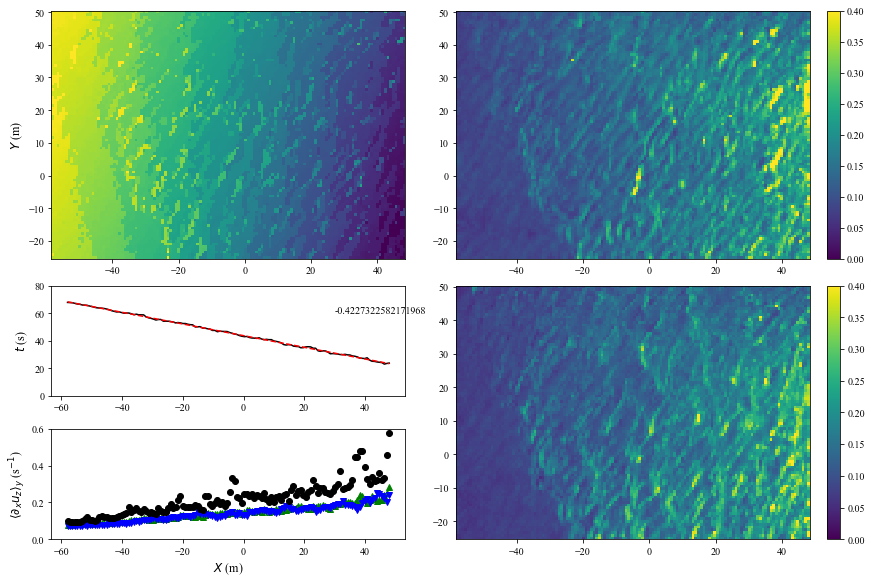

In [1607]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

var = 'Udx'

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)

plt.colorbar(sc)

ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)


ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]

ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')
ax.set_ylim([0,0.6])
figs = graphes.legende(r'$X$ (m)',r'$\langle \partial_x u_z \rangle_y$ (s$^{-1}$)','',ax=ax)

graphes.save_figs(figs,savedir=savefolder,prefix=f'Criterion_{var}_',overwrite=True)

In [1260]:
uz =  data['u'][2,...]
fc = 0.1/33
print(fc)
nt = len(data['t'])
u_high = np.zeros((ny,nx,nt))
for i in range(ny):
    for j in range(nx):
        y = uz[i,j,:]
        [b,a] = sig.butter(4,fc,'high')
        u_high[i,j,:] =  sig.filtfilt(b,a,y)

h = np.cumsum(u_high,axis=2)*dt

dyu,dxu = np.gradient(uz,axis=(0,1))
dxyu,dxxu = np.gradient(dxu,axis=(0,1))
dyyu,dyxu = np.gradient(dyu,axis=(0,1))

kappa_t = dxxu+dyyu#+dxyh+dyxh
kappa_abs_t = np.abs(dxxu)+np.abs(dyyu)
gauss_t = dxxu*dyyu-dxyu*dyxu

0.0030303030303030303


In [1375]:
uz =  data['u'][2,...]
fc = 0.1/33
print(fc)
nt = len(data['t'])
u_high = np.zeros((ny,nx,nt))
for i in range(ny):
    for j in range(nx):
        y = uz[i,j,:]
        [b,a] = sig.butter(4,fc,'high')
        u_high[i,j,:] =  sig.filtfilt(b,a,y)

h = np.cumsum(u_high,axis=2)*dt

dyh,dxh = np.gradient(h,axis=(0,1))
dxyh,dxxh = np.gradient(dxh,axis=(0,1))
dyyh,dyxh = np.gradient(dyh,axis=(0,1))

kappa = dxxh+dyyh#+dxyh+dyxh
kappa_abs = np.abs(dxxh)+np.abs(dyyh)
gauss = dxxh*dyyh-dxyh*dyxh
kappa2 = np.sqrt(dxxh**2+dyyh**2)

0.0030303030303030303


In [1297]:
kappa_t.shape

(93, 132, 3475)

In [1305]:
x[0]

-58.0

In [1312]:
xconv = np.linspace(-(nx-2)/2,(nx-2)/2,nx-1)
yconv = np.linspace(-(ny-1)/2,(ny-1)/2,ny)

print(xconv.shape)
print(xconv)

Xconv,Yconv = np.meshgrid(xconv,yconv)

print(Xconv.shape)

(131,)
[-65. -64. -63. -62. -61. -60. -59. -58. -57. -56. -55. -54. -53. -52.
 -51. -50. -49. -48. -47. -46. -45. -44. -43. -42. -41. -40. -39. -38.
 -37. -36. -35. -34. -33. -32. -31. -30. -29. -28. -27. -26. -25. -24.
 -23. -22. -21. -20. -19. -18. -17. -16. -15. -14. -13. -12. -11. -10.
  -9.  -8.  -7.  -6.  -5.  -4.  -3.  -2.  -1.   0.   1.   2.   3.   4.
   5.   6.   7.   8.   9.  10.  11.  12.  13.  14.  15.  16.  17.  18.
  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.  29.  30.  31.  32.
  33.  34.  35.  36.  37.  38.  39.  40.  41.  42.  43.  44.  45.  46.
  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.  57.  58.  59.  60.
  61.  62.  63.  64.  65.]
(93, 131)


In [1381]:
kappa2_t = np.sqrt(dxxu**2+dyyu**2)

sigma=2
kernel = np.exp(-(Xconv**2+Yconv**2)/2/sigma**2)
kernel = kernel/np.sum(kernel)

print(kernel.shape)
kappa_t_s = np.zeros((ny,nx,nt))
kappa_t_s[:,1:,:] = sig.fftconvolve(kappa2_t[:,1:,:],kernel[:,:,None],mode='same',axes=(0,1))#compute the convolution everywhere
kappa_t_s[:,0,:] = kappa2_t[:,0,:]#for the first column, just copy the unsmooth data

print(kappa_s.shape)

(93, 131)
(93, 132, 3475)


In [1382]:

sigma=2
kernel = np.exp(-(Xconv**2+Yconv**2)/2/sigma**2)
kernel = kernel/np.sum(kernel)

print(kernel.shape)
kappa_s = np.zeros((ny,nx,nt))
kappa_s[:,1:,:] = sig.fftconvolve(kappa2[:,1:,:],kernel[:,:,None],mode='same',axes=(0,1))#compute the convolution everywhere
kappa_s[:,0,:] = kappa2_t[:,0,:]#for the first column, just copy the unsmooth data

print(kappa_s.shape)

(93, 131)
(93, 132, 3475)


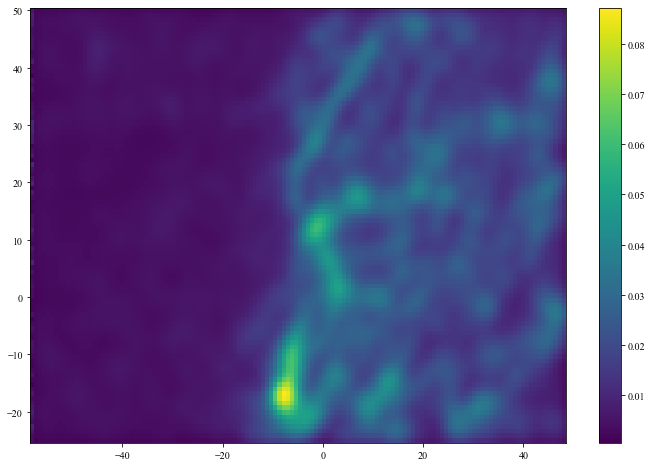

In [1340]:
fig,ax = plt.subplots(figsize=(12,8))#,nrows=2,sharex=True)

k0 = 800
sc = ax.pcolormesh(X,Y,kappa_s[:,:,k0])
plt.colorbar(sc)

In [1341]:
#criterion on div

#criterion on div

x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape

var = 'kappa_s'

m[f'imaxs_{var}']=np.zeros((ny,nx))
m[f'imins_{var}']=np.zeros((ny,nx))
m[f'tmaxs_{var}']=np.zeros((ny,nx))
m[f'tmins_{var}']=np.zeros((ny,nx))
m[f'vmaxs_{var}']=np.zeros((ny,nx))
m[f'vmins_{var}']=np.zeros((ny,nx))

tmax = 1600
for i0 in range(ny):
    indmax = np.argmax(kappa_s[i0,:,:tmax],axis=1)
    indmin = np.argmin(kappa_s[i0,:,:tmax],axis=1)
    
    m[f'imaxs_{var}'][i0,:]=indmax
    m[f'imins_{var}'][i0,:]=indmin
    m[f'tmaxs_{var}'][i0,:]=t[indmax]
    m[f'tmins_{var}'][i0,:]=t[indmin]

    m[f'vmaxs_{var}'][i0,:]=np.asarray([kappa_s[i0,j,ind] for j,ind in enumerate(indmax)])
    m[f'vmins_{var}'][i0,:]=np.asarray([kappa_s[i0,j,ind] for j,ind in enumerate(indmin)])

In [ ]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

x = X[0,:]
y = Y[:,0]

var = 'kappa2_t'

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.2)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

for i in range(ny):
    for j in range(nx):
        if m['binary'][i,j]==1.:
            ax.plot(x[j],y[i],'r.',alpha=0.3)
ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=0,vmax=0.3)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)




ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)


ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]

ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')
ax.set_ylim([0,0.6])
figs = graphes.legende(r'$X$ (m)',r'$\langle \partial_x u_z \rangle_y$ (s$^{-1}$)','',ax=ax)

#graphes.save_figs(figs,savedir=savefolder,prefix='Criterion_kappa_',overwrite=True)

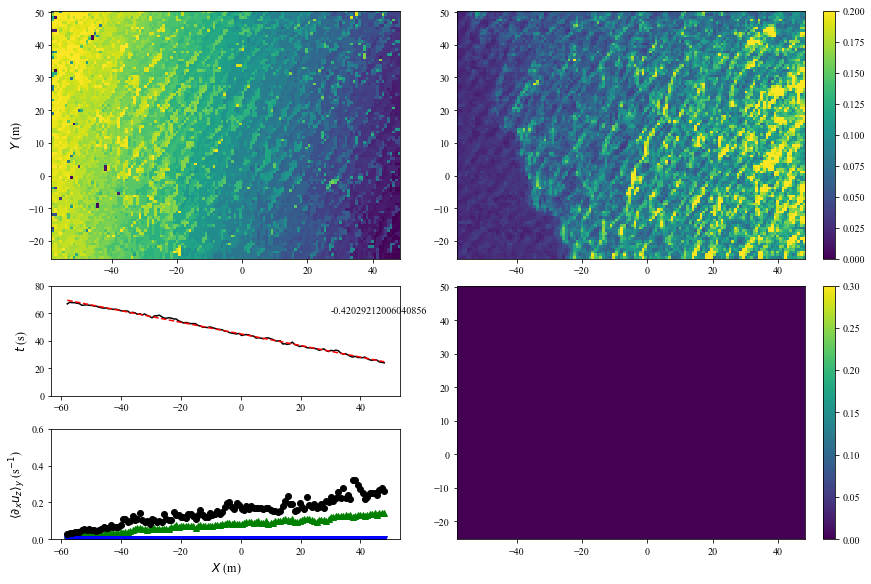

In [1599]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

x = X[0,:]
y = Y[:,0]

var = 'kappa2_t'

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.2)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

for i in range(ny):
    for j in range(nx):
        pass
        #if m['binary'][i,j]==1.:
        #    ax.plot(x[j],y[i],'r.',alpha=0.3)
ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=0,vmax=0.3)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)




ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)


ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]

ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')
ax.set_ylim([0,0.6])
figs = graphes.legende(r'$X$ (m)',r'$\langle \partial_x u_z \rangle_y$ (s$^{-1}$)','',ax=ax)

graphes.save_figs(figs,savedir=savefolder,prefix='Criterion_kappa2_',overwrite=True)

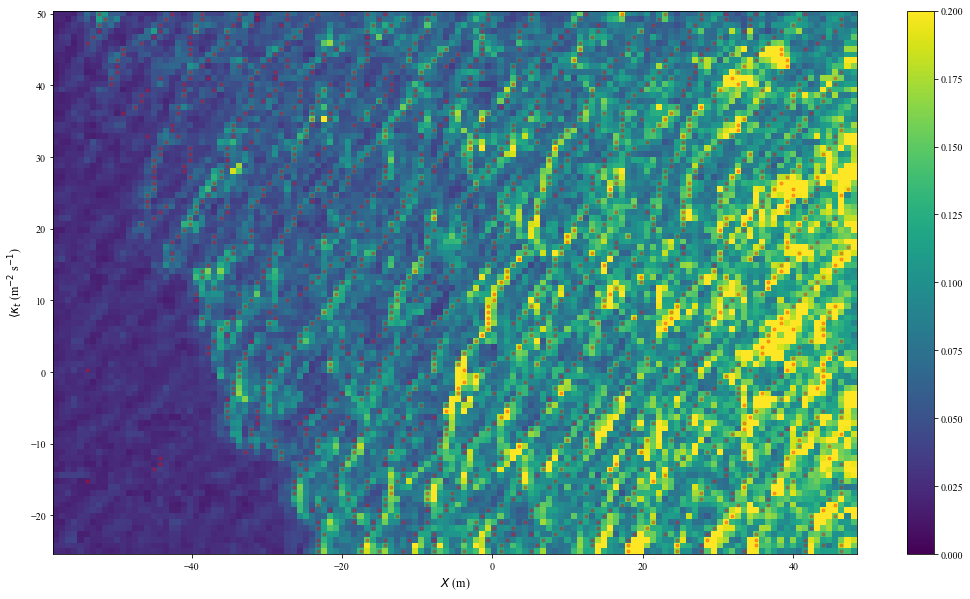

In [1344]:
fig,ax = plt.subplots(figsize=(18,10))#,nrows=2,sharex=True)


X = data['X']
Y = data['Y']

x = X[0,:]
y = Y[:,0]

var = 'kappa2_t'

#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.2)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

for i in range(ny):
    for j in range(nx):
        if m['binary'][i,j]==1.:
            ax.plot(x[j],y[i],'r.',alpha=0.3)

figs = graphes.legende(r'$X$ (m)',r'$\langle \kappa_t$ (m$^{-2}$ s$^{-1}$)','',ax=ax)
#graphes.save_figs(figs,savedir=savefolder,prefix='Criterion_kappa_',overwrite=True)


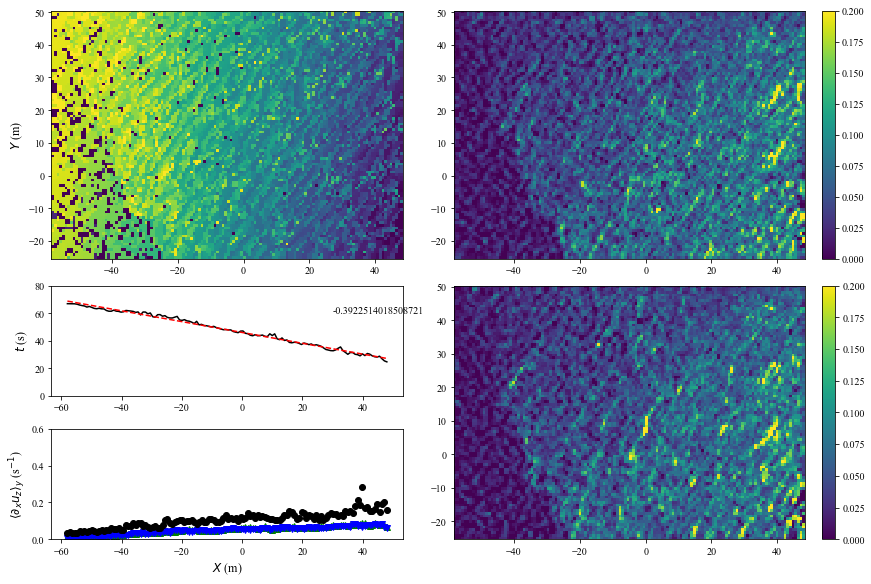

In [1292]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

var = 'kappa'

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.2)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)

plt.colorbar(sc)

ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=0,vmax=0.2)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)


ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]

ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')
ax.set_ylim([0,0.6])
figs = graphes.legende(r'$X$ (m)',r'$\langle \partial_x u_z \rangle_y$ (s$^{-1}$)','',ax=ax)

#graphes.save_figs(figs,savedir=savefolder,prefix='Criterion_kappa_',overwrite=True)

In [1254]:
m.keys()

dict_keys(['imaxs_rot', 'imins_rot', 'tmaxs_rot', 'tmins_rot', 'vmaxs_rot', 'vmins_rot', 'imaxs_div', 'imins_div', 'tmaxs_div', 'tmins_div', 'vmaxs_div', 'vmins_div', 'imaxs_Udx', 'imins_Udx', 'tmaxs_Udx', 'tmins_Udx', 'vmaxs_Udx', 'vmins_Udx', 'imaxs_shock', 'imins_shock', 'tmaxs_shock', 'tmins_shock', 'vmaxs_shock', 'vmins_shock', 'binary', 'vmaxs_rot_comp', 'vmaxs_rot_comp_comp', 'imaxs_kappa', 'imins_kappa', 'tmaxs_kappa', 'tmins_kappa', 'vmaxs_kappa', 'vmins_kappa'])

rot
div
Udx


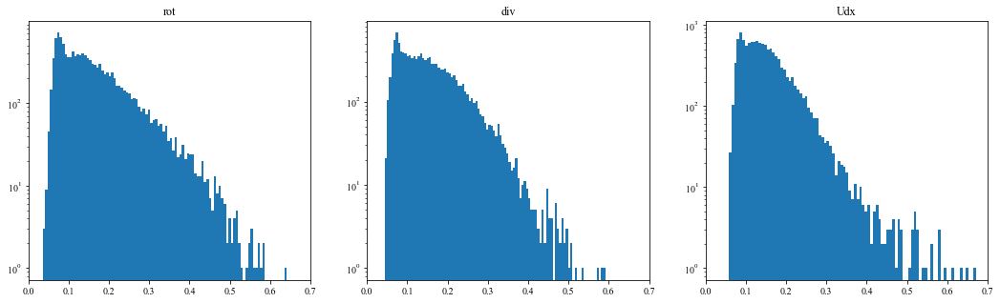

In [973]:
fig,axs = plt.subplots(figsize=(18,5),ncols=3)

Vars = ['rot','div','Udx']
for var,ax in zip(Vars,axs):
    print(var)
    norm_max = np.reshape(m[f'vmaxs_{var}'],(nx*ny,))

    ax.hist(norm_max,100)
    ax.set_yscale('log')
    ax.set_xlim([0,0.7])

    figs = graphes.legende('','',var,ax=ax)

rot
div
Udx


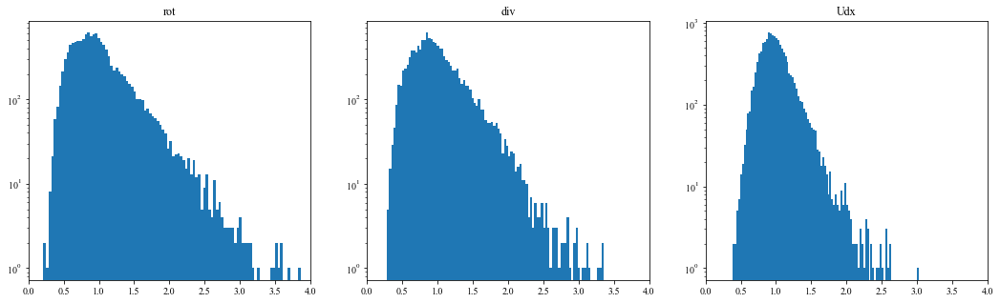

In [971]:
fig,axs = plt.subplots(figsize=(18,5),ncols=3)

Vars = ['rot','div','Udx']
for var,ax in zip(Vars,axs):
    print(var)
    norm_max = np.reshape(m[f'vmaxs_{var}']/np.mean(m[f'vmaxs_{var}'],axis=0)[None,:],(nx*ny,))

    ax.hist(norm_max,100)
    ax.set_yscale('log')
    ax.set_xlim([0,4])

    figs = graphes.legende('','',var,ax=ax)

(19, 132)


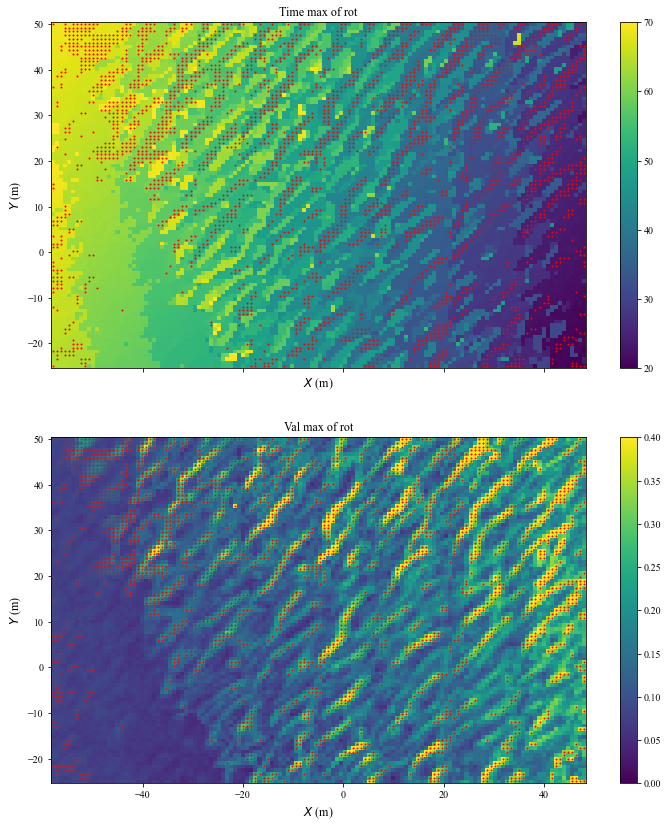

In [999]:
var = 'rot'
fig,axs = plt.subplots(figsize=(12,7*2),nrows=2,sharex=True)
#fig = plt.figure(figsize=(12,8))#,constrained_layout=True)
#gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

t = np.asarray(data['t'])
y = np.asarray(data['Y'][:,0])

#ax = fig.add_subplot(gs[:2,0])
ax = axs[0]

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



indmaxmax = np.argsort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.8):,:]#compute the value of the largest 5% of the max for each x

print(indmaxmax.shape)

for i in range(nx):
    inds = indmaxmax[:,i]
    ax.plot(x[i]*np.ones(len(inds)),y[inds],'r.',markersize=2)

figs = graphes.legende('$X$ (m)','$Y$ (m)','Time max of '+f'{var}',ax=ax)

ax = axs[1]

sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

for i in range(nx):
    inds = indmaxmax[:,i]
    ax.plot(x[i]*np.ones(len(inds)),y[inds],'r.',markersize=2)

figs = graphes.legende('$X$ (m)','$Y$ (m)','Val max of '+f'{var}',ax=ax)


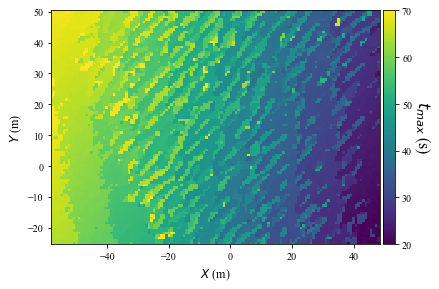

In [1659]:
var = 'rot'
fig,ax = plt.subplots(figsize=(4.68*1.5,4.3),nrows=1)#,sharex=True)
#fig = plt.figure(figsize=(12,8))#,constrained_layout=True)
#gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

t = np.asarray(data['t'])
y = np.asarray(data['Y'][:,0])

#ax = fig.add_subplot(gs[:2,0])
sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
cbar = plt.colorbar(sc,pad=0.01)

plt.axis('equal')
cbar.ax.set_ylabel(r'$t_{max}$ (s)', rotation=270,labelpad=20,fontsize=16)

figs = graphes.legende('$X$ (m)','$Y$ (m)','',ax=ax)
graphes.save_figs(figs,savedir=savefolder,prefix='Timemap_max_rot')

In [1001]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

var = 'kappa_t'

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.2)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)

plt.colorbar(sc)

ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=0,vmax=0.2)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)


ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]

ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')
ax.set_ylim([0,0.6])
figs = graphes.legende(r'$X$ (m)',r'$\langle \partial_x u_z \rangle_y$ (s$^{-1}$)','',ax=ax)

#graphes.save_figs(figs,savedir=savefolder,prefix='Criterion_kappa_',overwrite=True)

48.0

In [1012]:
m[f'vmaxs_{var}'].shape

(93, 132)

In [1021]:
np.asarray().shape

(93, 132)

In [ ]:
m[f'vetrems_{var}']=np.max(bp

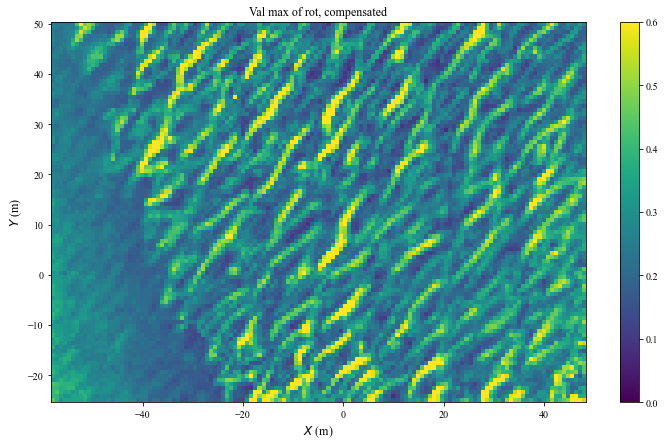

In [1221]:
var = 'rot'

x = np.asarray(data['X'][0,:])
y = np.asarray(data['Y'][:,0])


extrema = m[f'vmaxs_{var}']#np.max([m[f'vmaxs_{var}'],-m[f'vmins_{var}']],axis=0)#
v90 = np.sort(extrema,axis=0)[int(ny*0.97),:]#compute the value of the largest 5% of the max for each x
p = np.polyfit(x,v90,1)
vth = np.polyval(p,x)

m[f'vmaxs_{var}_comp']=extrema*vth[-1]/vth

v90_vert = np.sort(m[f'vmaxs_{var}_comp'],axis=1)[:,int(nx*0.9)]#compute the value of the largest 5% of the max for each x
p = np.polyfit(y,v90_vert,1)
vth = np.polyval(p,y)

m[f'vmaxs_{var}_comp_comp']=m[f'vmaxs_{var}_comp']*vth[-1]/vth[:,None]

fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}_comp_comp'],vmin=0,vmax=0.6)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

figs = graphes.legende('$X$ (m)','$Y$ (m)','Val max of '+f'{var}, compensated',ax=ax)


(28, 132)


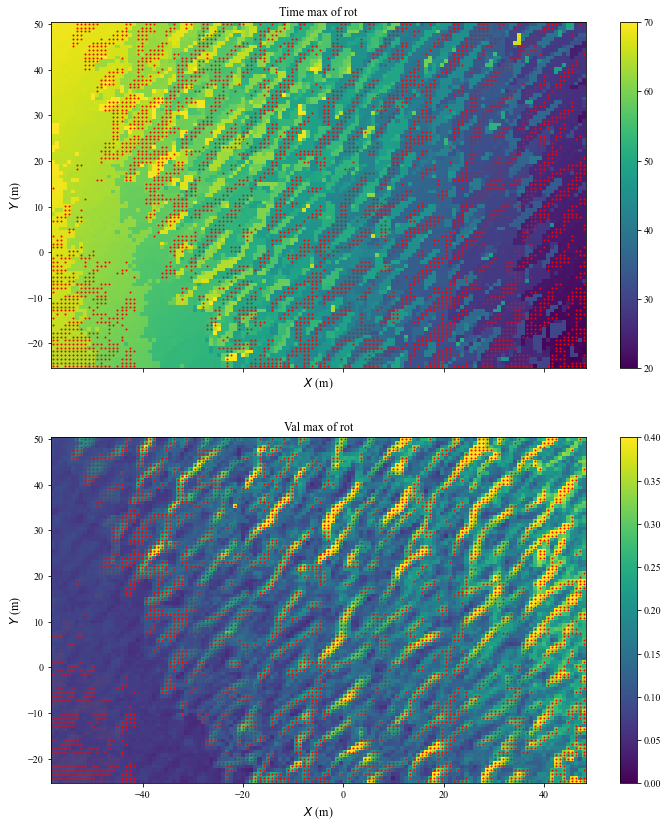

In [1039]:
var = 'rot'
fig,axs = plt.subplots(figsize=(12,7*2),nrows=2,sharex=True)
#fig = plt.figure(figsize=(12,8))#,constrained_layout=True)
#gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

t = np.asarray(data['t'])
y = np.asarray(data['Y'][:,0])

#ax = fig.add_subplot(gs[:2,0])
ax = axs[0]

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



indmaxmax = np.argsort(m[f'vmaxs_{var}_comp_comp'],axis=0)[int(ny*0.7):,:]#compute the value of the largest 5% of the max for each x

print(indmaxmax.shape)

for i in range(nx):
    inds = indmaxmax[:,i]
    ax.plot(x[i]*np.ones(len(inds)),y[inds],'r.',markersize=2)

figs = graphes.legende('$X$ (m)','$Y$ (m)','Time max of '+f'{var}',ax=ax)

ax = axs[1]

sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

binary = np.zeros((ny,nx))
for i in range(nx):
    inds = indmaxmax[:,i]
    ax.plot(x[i]*np.ones(len(inds)),y[inds],'r.',markersize=2)
    for ind in inds:
        binary[ind,i]=1
figs = graphes.legende('$X$ (m)','$Y$ (m)','Val max of '+f'{var}',ax=ax)


93
(28, 132)


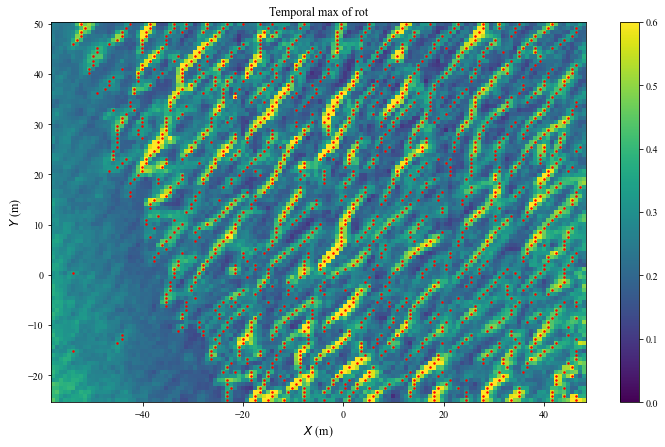

In [1222]:
var = 'rot'
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)
#fig = plt.figure(figsize=(12,8))#,constrained_layout=True)
#gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

t = np.asarray(data['t'])
y = np.asarray(data['Y'][:,0])

#ax = fig.add_subplot(gs[:2,0])
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}_comp_comp'],vmin=0,vmax=0.6)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

#do a find peaks per line

peaks=[]
for i in range(ny):
    peak = sig.find_peaks(m[f'vmaxs_{var}_comp_comp'][i,:],prominence=0.08,distance=3)[0]
    peaks.append(peak)
#    if i==30:
print(len(peaks))
#        axs[1].plot(x,m[f'vmaxs_{var}_comp_comp'][i,:],'o-')
#indmaxmax = np.argsort(m[f'vmaxs_{var}_comp_comp'],axis=0)[int(ny*0.7):,:]#compute the value of the largest 5% of the max for each x
print(indmaxmax.shape)

binary = np.zeros((ny,nx))
for i,inds in enumerate(peaks):
    ax.plot(x[inds],y[i]*np.ones(len(inds)),'r.',markersize=3)
    for ind in inds:
        binary[i,ind]=1
figs = graphes.legende('$X$ (m)','$Y$ (m)','Temporal max of '+f'{var}',ax=ax)
graphes.save_figs(figs,savedir=savefolder)

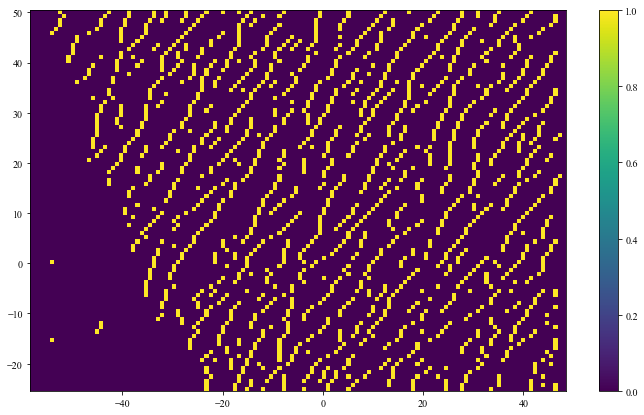

In [1223]:
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

sc = ax.pcolormesh(X,Y,binary)
plt.colorbar(sc)

In [1224]:
m['binary'] = binary

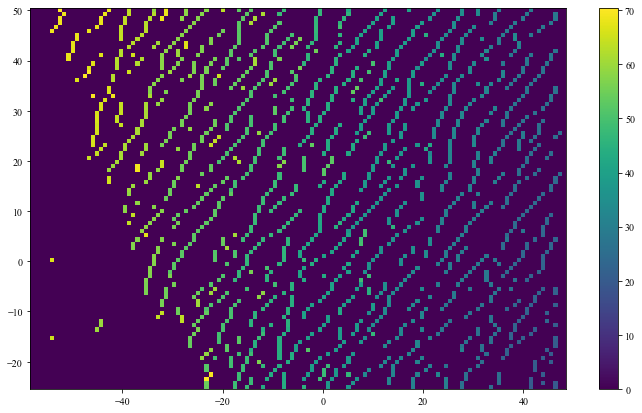

In [1481]:
#colormap of the fracture, color codes the time of opening (in rot max ?)
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

Z = m['binary']*m['tmaxs_rot']
sc = ax.pcolormesh(X,Y,Z)
plt.colorbar(sc)


[[  0   0   0 ...  14   0   0]
 [  0   0   0 ...  14   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0   0   0 ... 336   0   0]
 [  0   0   0 ... 336   0   0]
 [  0   0   0 ...   0   0   0]]
[  1   2   7  11  15  19  33  38  48  50  53  56  62  64  81  86  89  90
  94  99 113 116 121 123 124 128 130 133 137 143 147 153 155 158 159 161
 164 174 176 178 184 185 186 187 197 201 202 204 207 210 213 214 216 217
 223 226 227 228 230 233 234 236 239 242 243 245 246 247 248 250 252 257
 264 268 270 271 273 276 287 289 292 293 294 296 300 302 309 311 312 315
 317 319 321 322 328 331 332]
97
(93, 132)


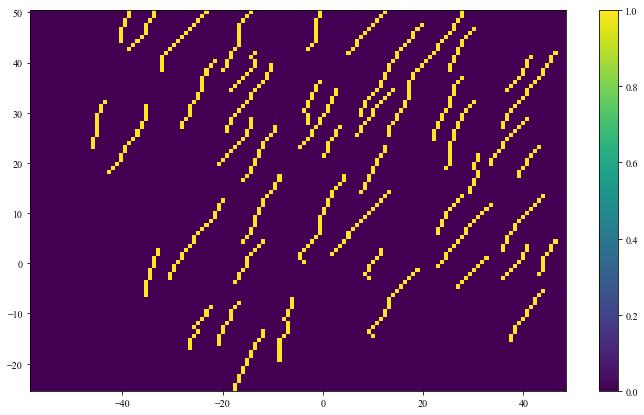

In [1548]:
from skimage import measure
import scipy.ndimage as nd
struct = [[1,1,1],[1,1,1],[1,1,1]]

labels = nd.label(np.asarray(m['binary']), structure=struct)[0]

print(labels)
#colormap of the fracture, color codes the time of opening (in rot max ?)
props = measure.regionprops_table(labels, properties=['area'])

Thres = 5
labnums = np.where(props['area']>=Thres)[0]+1
print(labnums)

print(len(labnums))
bigs_mask = np.asarray([[(labels[i,j] in labnums) for j in range(nx)] for i in range(ny)])

print(bigs.shape)
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)
#Z = m['binary']*m['tmaxs_rot']
sc = ax.pcolormesh(X,Y,bigs)
plt.colorbar(sc)

m['bigs'] = bigs
m['labels'] = labels
m['labnums'] = labnums

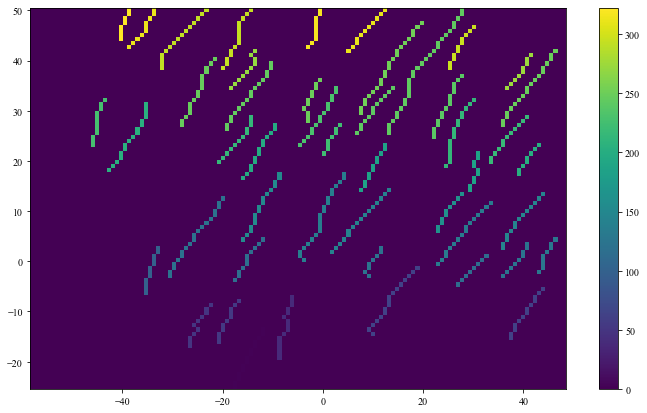

In [1549]:
#colormap of the fracture, color codes the time of opening (in rot max ?)
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

Z = m['bigs']*m['tmaxs_rot']
Z = m['bigs']*m['labels']

sc = ax.pcolormesh(X,Y,Z)
plt.colorbar(sc)



In [1550]:
#normalize time
T = -10*np.ones((ny,nx))

var = 'rot'
for lab in labnums:
    ilist,jlist = np.where(lab==m['labels'])
    tlist = []
    for (i,j) in zip(ilist,jlist):
        tlist.append(m[f'tmaxs_{var}'][i,j])
    t0 = np.median(tlist)
    for (i,j) in zip(ilist,jlist):
        T[i,j] = m[f'tmaxs_{var}'][i,j]-t0
        

In [1542]:
print(m.keys())

dict_keys(['imaxs_rot', 'imins_rot', 'tmaxs_rot', 'tmins_rot', 'vmaxs_rot', 'vmins_rot', 'imaxs_div', 'imins_div', 'tmaxs_div', 'tmins_div', 'vmaxs_div', 'vmins_div', 'imaxs_Udx', 'imins_Udx', 'tmaxs_Udx', 'tmins_Udx', 'vmaxs_Udx', 'vmins_Udx', 'imaxs_shock', 'imins_shock', 'tmaxs_shock', 'tmins_shock', 'vmaxs_shock', 'vmins_shock', 'binary', 'vmaxs_rot_comp', 'vmaxs_rot_comp_comp', 'imaxs_kappa', 'imins_kappa', 'tmaxs_kappa', 'tmins_kappa', 'vmaxs_kappa', 'vmins_kappa', 'imaxs_kappa_t', 'imins_kappa_t', 'tmaxs_kappa_t', 'tmins_kappa_t', 'vmaxs_kappa_t', 'vmins_kappa_t', 'imaxs_kappa2_t', 'imins_kappa2_t', 'tmaxs_kappa2_t', 'tmins_kappa2_t', 'vmaxs_kappa2_t', 'vmins_kappa2_t', 'imaxs_kappa_s', 'imins_kappa_s', 'tmaxs_kappa_s', 'tmins_kappa_s', 'vmaxs_kappa_s', 'vmins_kappa_s', 'bigs', 'labels', 'labnums'])


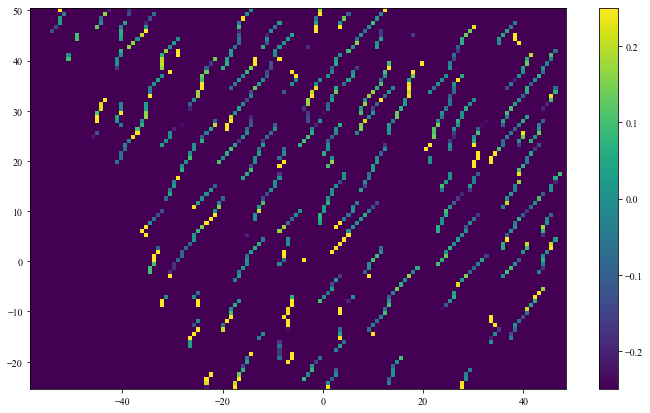

In [1551]:
#normalize time
T = -10*np.ones((ny,nx))

var = 'rot'
for lab in labnums:
    ilist,jlist = np.where(lab==m['labels'])
    tlist = []
    for (i,j) in zip(ilist,jlist):
        tlist.append(m[f'tmaxs_{var}'][i,j])
    t0 = np.median(tlist)
    for (i,j) in zip(ilist,jlist):
        T[i,j] = m[f'tmaxs_{var}'][i,j]-t0
        

#colormap of the fracture, color codes the time of opening (in rot max ?)
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

sc = ax.pcolormesh(X,Y,T,vmin=-0.25,vmax=0.25)
plt.colorbar(sc)



In [ ]:
#colormap of the fracture, color codes the time of opening (in rot max ?)
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

Z = m['bigs']*m['tmaxs_rot']
sc = ax.pcolormesh(X,Y,Z)
plt.colorbar(sc)


In [1497]:
len(labels)

93

In [1496]:
len(props['area'])

346

In [1225]:
m.keys()

dict_keys(['imaxs_rot', 'imins_rot', 'tmaxs_rot', 'tmins_rot', 'vmaxs_rot', 'vmins_rot', 'imaxs_div', 'imins_div', 'tmaxs_div', 'tmins_div', 'vmaxs_div', 'vmins_div', 'imaxs_Udx', 'imins_Udx', 'tmaxs_Udx', 'tmins_Udx', 'vmaxs_Udx', 'vmins_Udx', 'imaxs_shock', 'imins_shock', 'tmaxs_shock', 'tmins_shock', 'vmaxs_shock', 'vmins_shock', 'binary', 'vmaxs_rot_comp', 'vmaxs_rot_comp_comp'])

In [1085]:
savefolder

'/media/turbots/Elements/Share_hublot/Data/0211/Drones//Results/'

In [1090]:
binary

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [1087]:
m[f'tmaxs_{var}'].shape

(93, 132)

(35.0, 55.0)

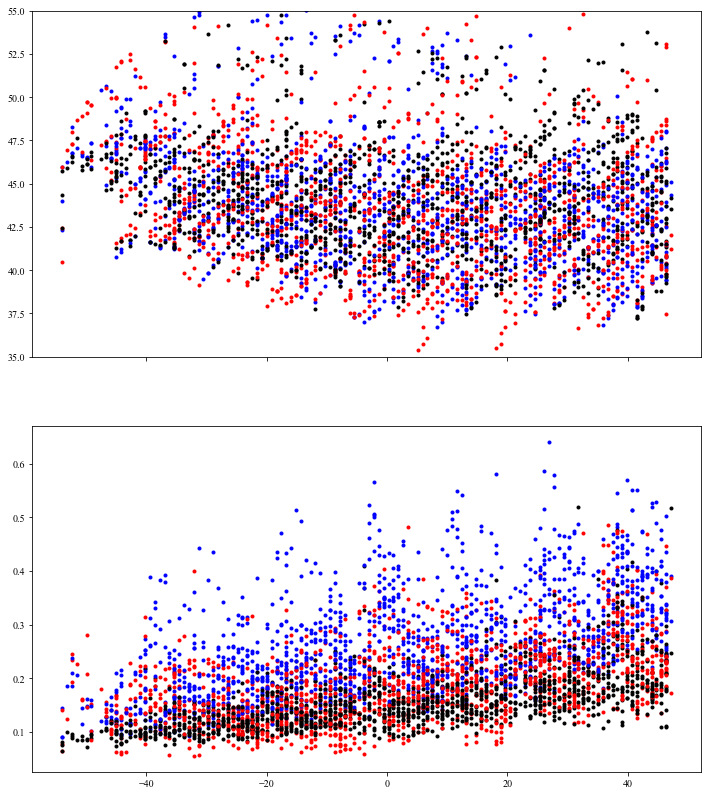

In [1111]:
Vars = ['rot','div','Udx']
colors = ['b','r','k']

fig,axs = plt.subplots(figsize=(12,7*2),nrows=2,sharex=True)
Dt1 = []
Dt2 = []
Dt3 = []
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            for var,color in zip(Vars,colors):
                axs[0].plot(X[i,j],m[f'tmaxs_{var}'][i,j]+0.42*X[i,j],color=color,marker='.')
                axs[1].plot(X[i,j],m[f'vmaxs_{var}'][i,j],color=color,marker='.')
            Dt1.append(m[f'tmaxs_Udx'][i,j]-m[f'tmaxs_rot'][i,j])
            Dt2.append(m[f'tmaxs_div'][i,j]-m[f'tmaxs_rot'][i,j])
            Dt3.append(m[f'tmaxs_Udx'][i,j]-m[f'tmaxs_div'][i,j])

axs[0].set_ylim([35,55])

In [1345]:
m.keys()

dict_keys(['imaxs_rot', 'imins_rot', 'tmaxs_rot', 'tmins_rot', 'vmaxs_rot', 'vmins_rot', 'imaxs_div', 'imins_div', 'tmaxs_div', 'tmins_div', 'vmaxs_div', 'vmins_div', 'imaxs_Udx', 'imins_Udx', 'tmaxs_Udx', 'tmins_Udx', 'vmaxs_Udx', 'vmins_Udx', 'imaxs_shock', 'imins_shock', 'tmaxs_shock', 'tmins_shock', 'vmaxs_shock', 'vmins_shock', 'binary', 'vmaxs_rot_comp', 'vmaxs_rot_comp_comp', 'imaxs_kappa', 'imins_kappa', 'tmaxs_kappa', 'tmins_kappa', 'vmaxs_kappa', 'vmins_kappa', 'imaxs_kappa_t', 'imins_kappa_t', 'tmaxs_kappa_t', 'tmins_kappa_t', 'vmaxs_kappa_t', 'vmins_kappa_t', 'imaxs_kappa2_t', 'imins_kappa2_t', 'tmaxs_kappa2_t', 'tmins_kappa2_t', 'vmaxs_kappa2_t', 'vmins_kappa2_t', 'imaxs_kappa_s', 'imins_kappa_s', 'tmaxs_kappa_s', 'tmins_kappa_s', 'vmaxs_kappa_s', 'vmins_kappa_s'])

(35.0, 55.0)

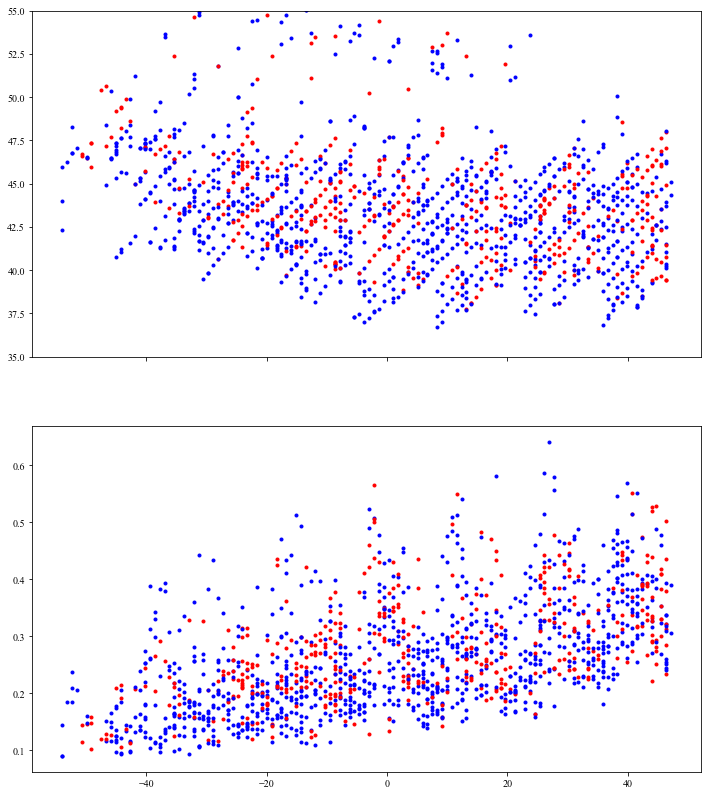

In [1365]:
Vars = ['rot','div','Udx']
colors = ['b','r','k']

fig,axs = plt.subplots(figsize=(12,7*2),nrows=2,sharex=True)
Dt1 = []
Dt2 = []
Dt3 = []
Dt4 = []
Dt5 = []
Dt6 = []

varref = 'rot'
curvature = np.zeros((ny,nx))
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            Dt1.append(m[f'tmaxs_Udx'][i,j]-m[f'tmaxs_rot'][i,j])
            Dt2.append(m[f'tmaxs_div'][i,j]-m[f'tmaxs_rot'][i,j])
            Dt3.append(m[f'tmaxs_Udx'][i,j]-m[f'tmaxs_div'][i,j])
            
            Dt4.append(m[f'tmins_{varref}'][i,j]-m[f'tmaxs_kappa2_t'][i,j])
            Dt5.append(m[f'tmaxs_{varref}'][i,j]-m[f'tmaxs_kappa2_t'][i,j])

            t1 = m[f'tmaxs_kappa2_t'][i,j]
            t2 = np.min([m[f'tmins_{varref}'][i,j],m[f'tmaxs_{varref}'][i,j]])
            Dt6.append(t2-t1)

            if (t2-t1)>-0:
                curvature[i,j]=1
                color='r'
            else:
                color='b'

            axs[0].plot(X[i,j],m[f'tmaxs_{varref}'][i,j]+0.42*X[i,j],color=color,marker='.')
            axs[1].plot(X[i,j],m[f'vmaxs_{varref}'][i,j],color=color,marker='.')

axs[0].set_ylim([35,55])

In [1104]:
np.sum(binary,axis=(0,1))

1458.0

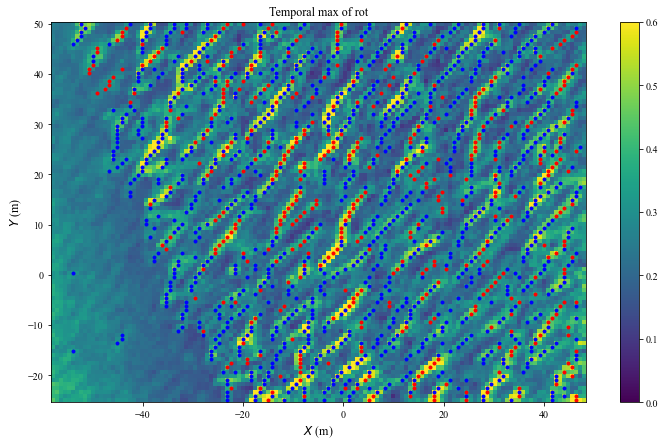

In [1363]:
var = 'rot'
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)
#fig = plt.figure(figsize=(12,8))#,constrained_layout=True)
#gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

t = np.asarray(data['t'])
y = np.asarray(data['Y'][:,0])

#ax = fig.add_subplot(gs[:2,0])
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}_comp_comp'],vmin=0,vmax=0.6)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

#do a find peaks per line

peaks=[]
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            if curvature[i,j]==1.:
                ax.plot(x[j],y[i],'r.')
            else:
                ax.plot(x[j],y[i],'b.')

figs = graphes.legende('$X$ (m)','$Y$ (m)','Temporal max of '+f'{var}',ax=ax)
#graphes.save_figs(figs,savedir=savefolder)

0.4425092673835245 3.600861618460327
0.6992360444578095
0.4072888617927486


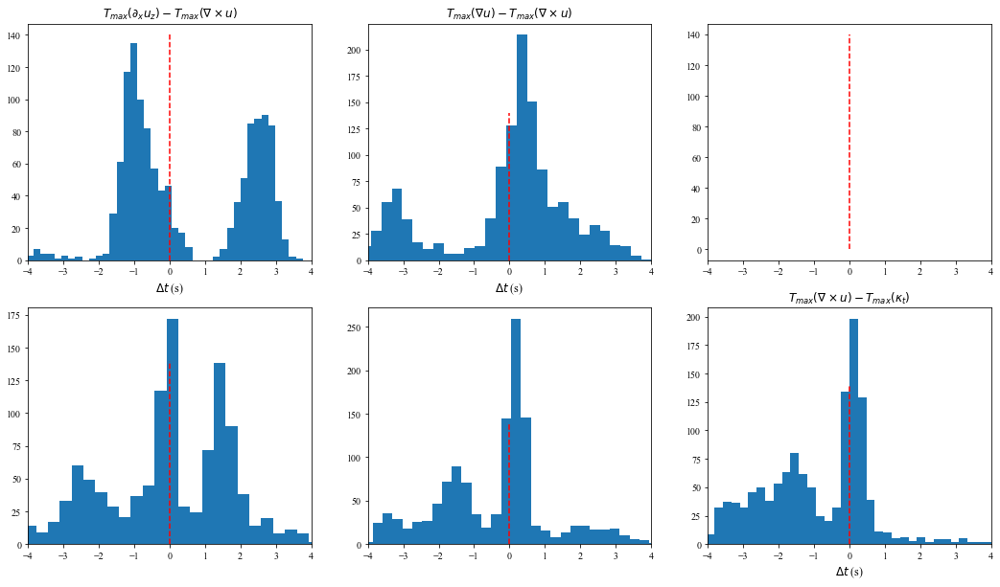

In [1354]:
fig,axs = plt.subplots(figsize=(18,10),ncols=3,nrows=2)#,sharey=True)

axs[0,0].hist(Dt1,200)
axs[0,1].hist(Dt2,200)
axs[1,1].hist(Dt5,200)
axs[1,0].hist(Dt4,200)
axs[1,2].hist(Dt6,200)


graphes.legende(r'$\Delta t$ (s)','',r'$T_{max}(\partial_x u_z)-T_{max}(\nabla \times u) $',ax=axs[0,0])
graphes.legende(r'$\Delta t$ (s)','',r'$T_{max}(\nabla u)-T_{max}(\nabla \times u) $',ax=axs[0,1])
figs = graphes.legende(r'$\Delta t$ (s)','',r'$T_{max}(\nabla \times u) -T_{max}(\kappa_t)$',ax=axs[1,2])

for i in range(2):
    for j in range(3):
        axs[i,j].plot([0,0],[0,140],'r--')
        axs[i,j].set_xlim([-4,4])

print(np.mean(Dt1),np.std(Dt1))
print(np.mean(Dt2))
print(np.mean(Dt4))

#graphes.save_figs(figs,savedir=savefolder,prefix='Causality_')

(35.0, 55.0)

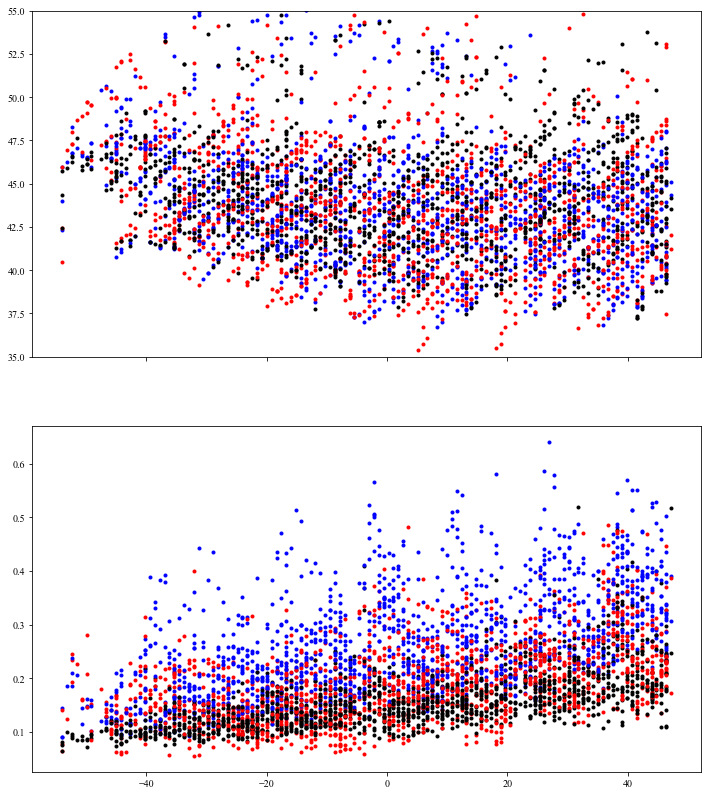

In [1355]:
Vars = ['rot','div','Udx']
colors = ['b','r','k']

fig,axs = plt.subplots(figsize=(12,7*2),nrows=2,sharex=True)
Dt1 = []
Dt2 = []
Dt3 = []
Dt4 = []
Dt5 = []
Dt6 = []

varref = 'Udx'
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            for var,color in zip(Vars,colors):
                axs[0].plot(X[i,j],m[f'tmaxs_{var}'][i,j]+0.42*X[i,j],color=color,marker='.')
                axs[1].plot(X[i,j],m[f'vmaxs_{var}'][i,j],color=color,marker='.')
            Dt1.append(m[f'tmaxs_Udx'][i,j]-m[f'tmaxs_rot'][i,j])
            Dt2.append(m[f'tmaxs_div'][i,j]-m[f'tmaxs_rot'][i,j])
            Dt3.append(m[f'tmaxs_Udx'][i,j]-m[f'tmaxs_div'][i,j])
            
            Dt4.append(m[f'tmins_{varref}'][i,j]-m[f'tmaxs_kappa2_t'][i,j])
            Dt5.append(m[f'tmaxs_{varref}'][i,j]-m[f'tmaxs_kappa2_t'][i,j])

            t1 = m[f'tmaxs_kappa2_t'][i,j]
            t2 = np.min([m[f'tmins_{varref}'][i,j],m[f'tmaxs_{varref}'][i,j]])
            Dt6.append(t2-t1)
            
axs[0].set_ylim([35,55])

0.4425092673835245 3.600861618460327
0.6992360444578095
-0.7844149590834547


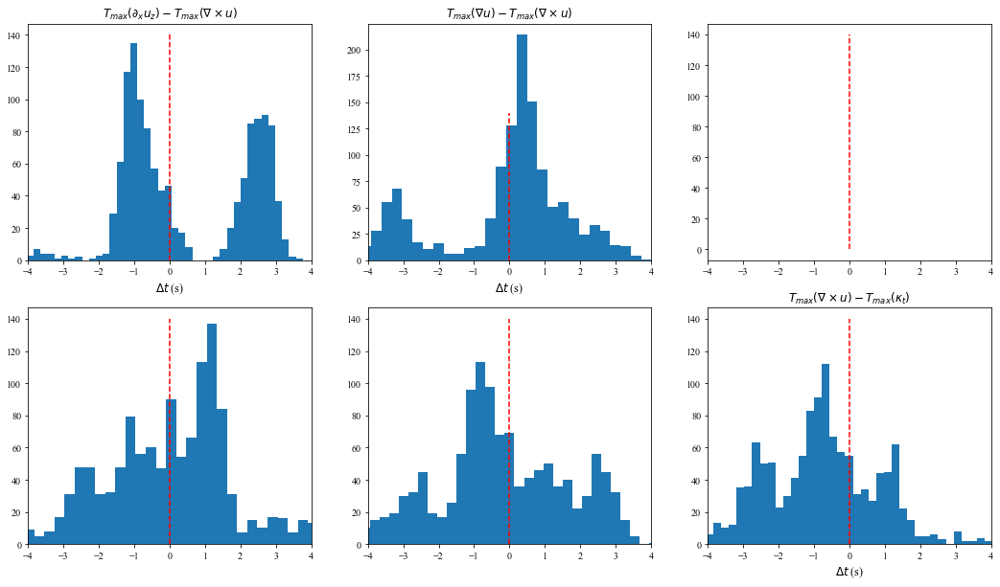

In [1356]:
fig,axs = plt.subplots(figsize=(18,10),ncols=3,nrows=2)#,sharey=True)

axs[0,0].hist(Dt1,200)
axs[0,1].hist(Dt2,200)
axs[1,1].hist(Dt5,200)
axs[1,0].hist(Dt4,200)
axs[1,2].hist(Dt6,200)


graphes.legende(r'$\Delta t$ (s)','',r'$T_{max}(\partial_x u_z)-T_{max}(\nabla \times u) $',ax=axs[0,0])
graphes.legende(r'$\Delta t$ (s)','',r'$T_{max}(\nabla u)-T_{max}(\nabla \times u) $',ax=axs[0,1])
figs = graphes.legende(r'$\Delta t$ (s)','',r'$T_{max}(\nabla \times u) -T_{max}(\kappa_t)$',ax=axs[1,2])

for i in range(2):
    for j in range(3):
        axs[i,j].plot([0,0],[0,140],'r--')
        axs[i,j].set_xlim([-4,4])

print(np.mean(Dt1),np.std(Dt1))
print(np.mean(Dt2))
print(np.mean(Dt4))

#graphes.save_figs(figs,savedir=savefolder,prefix='Causality_')

In [1132]:
dt = np.diff(t)[0]

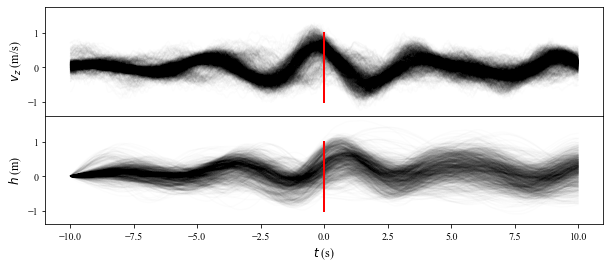

In [1366]:
fig,axs = plt.subplots(figsize=(10,4),nrows=2,sharey=True)
var = 'rot'

Dt = 10
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt,t<t0+Dt)

            uz = data['u'][2,i,j,indices]
            tp = t[indices]

            
            axs[0].plot(tp-t0,uz,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            h = np.cumsum(uz)*dt
            axs[1].plot(tp-t0,h,'k',alpha=0.01)
            axs[1].plot([0,0],[-1,1],'r')

            
figs = graphes.legende(r'$t$ (s)',r'$v_z$ (m/s)','',ax=axs[0])
figs = graphes.legende(r'$t$ (s)',r'$h$ (m)','',ax=axs[1])
plt.subplots_adjust(hspace=0)

graphes.save_figs(figs,savedir=savefolder,prefix='typical_')

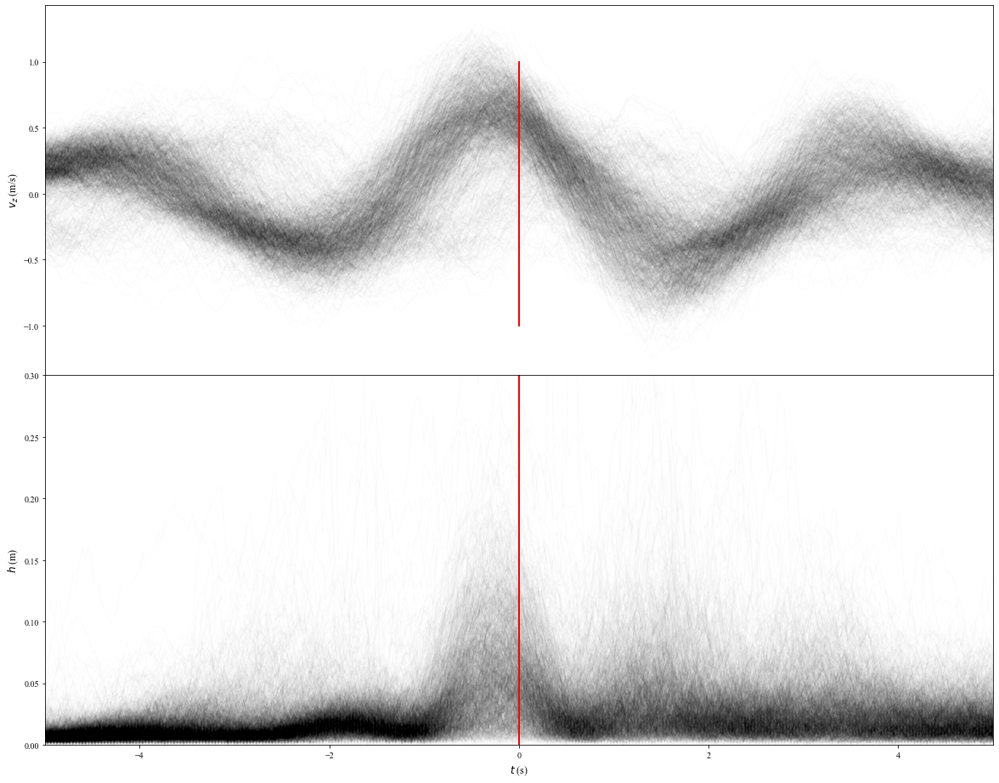

In [1392]:
n=2
fig,axs = plt.subplots(figsize=(20,8*n),nrows=n,sharex=True)
var = 'rot'

Dt = 10
fc = 0.05
[b,a] = sig.butter(4,fc,'high')

for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt,t<t0+Dt)

            uz = data['u'][2,i,j,indices]
            tp = t[indices]

            [b,a] = sig.butter(4,fc,'high')
            u_high[i,j,:] =  sig.filtfilt(b,a,y)

            axs[0].plot(tp-t0,uz,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            kapt = kappa2_t[i,j,indices]#kappa2_t
            axs[1].plot(tp-t0,kapt,'k',alpha=0.01)
            axs[1].plot([0,0],[-1,1],'r')

#            y_high =  sig.filtfilt(b,a,kapt)
#            axs[1].plot(tp-t0,y_high*10,'b',alpha=0.01)

axs[1].set_ylim([0,0.3])
axs[1].set_xlim([-5,5])

figs = graphes.legende(r'$t$ (s)',r'$v_z$ (m/s)','',ax=axs[0])
figs = graphes.legende(r'$t$ (s)',r'$h$ (m)','',ax=axs[1])
plt.subplots_adjust(hspace=0)

#graphes.save_figs(figs,savedir=savefolder,prefix='typical_')

In [1395]:
f0 = 0.23
w0 = f0*2*np.pi
g = 9.81
k0 = w0**2/g
A0 = 1
kappa0 = A0*k0**2
kappa_t0 = A0*k0**2*w0

print(kappa0,kappa_t0)

0.045320302787076834 0.06549384793539899


In [1397]:
rot.shape

(93, 132, 3475)

In [1405]:
w0

1.4451326206513049

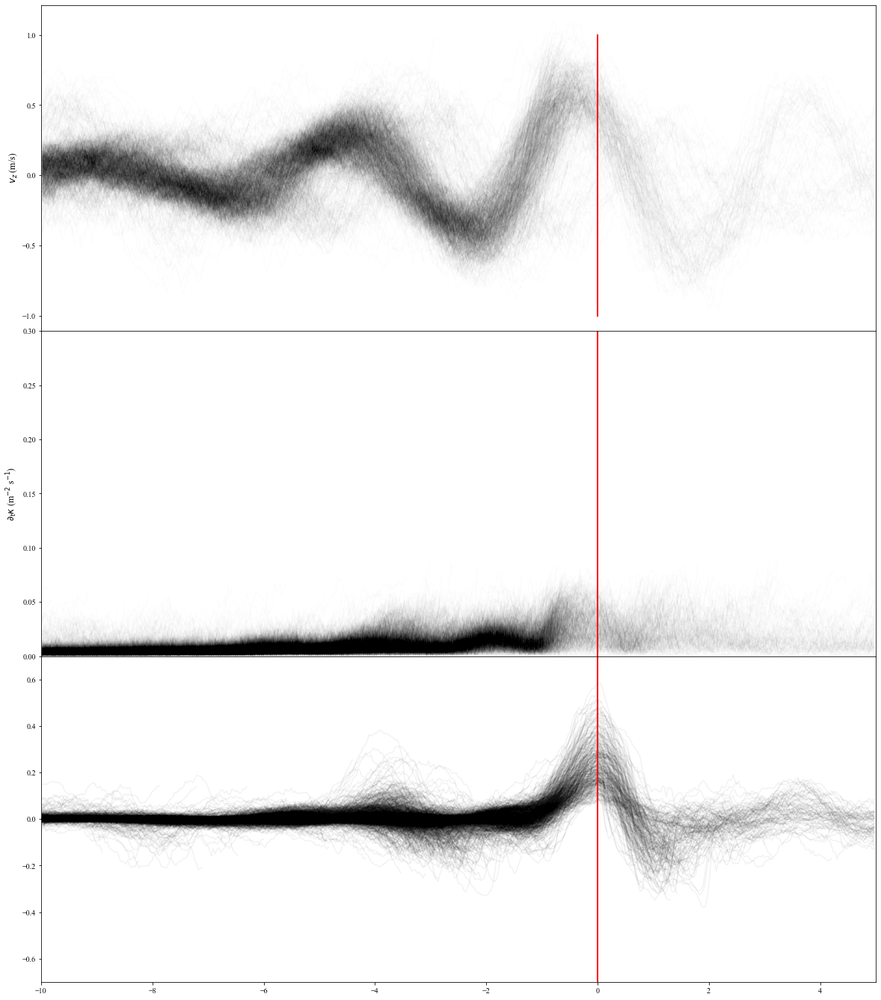

In [1553]:
n=3
fig,axs = plt.subplots(figsize=(20,8*n),nrows=n,sharex=True)
var = 'rot'

Dt1 = 10
Dt2 = 5

fc = 0.05
lag=0
coeff = 1.5
[b,a] = sig.butter(4,fc,'high')

frac_times = []

m['tmaxs_frac_kapt']=np.zeros((ny,nx))

for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt1,t<t0+Dt2)

            uz = data['u'][2,i,j,indices]
            rotc = rot[i,j,indices]

            tp = t[indices]
            tc = tp-t0

            #compute max amplitude
            fs = 0.1/33
            [b,a] = sig.butter(4,fs,'high')
            uz_filt =  sig.filtfilt(b,a,uz)
            h = np.cumsum(uz_filt)*dt

            A0 = (np.max(h)-np.min(h))/2

            k0 = w0**2/g

            kappa_t0 = A0*k0**2*w0*coeff
#            print(A0,kappa_t0,A0*k0)
            kapt = kappa2_t[i,j,indices]#kappa2_t
            inds_k = np.where(kapt>kappa_t0)[0]
            if len(inds_k)>0:
                frac = inds_k[0]
                kapt = kapt[:frac+lag]     
                tcp = tc[:frac+lag]
                frac_times.append(frac)
                uzp = uz[:frac+lag]
                rotcp = rotc[:frac+lag]
                
                m['tmaxs_frac_kapt'][i,j] = tp[frac]
            else:
                frac = len(tc)
                tcp = tc
                uzp = uz
                rotcp = rotc

            
            axs[1].plot(tcp,kapt,'k',alpha=0.01)
            axs[1].plot([0,0],[-1,1],'r')           
#            axs[1].plot(tc,np.ones(len(tc))*kappa_t0*2,'r--',alpha=0.01)
#            y_high =  sig.filtfilt(b,a,kapt)
#            axs[1].plot(tp-t0,y_high*10,'b',alpha=0.01)
            # plot uz
#            [b,a] = sig.butter(4,fc,'high')
#            u_high[i,j,:] =  sig.filtfilt(b,a,y)

            axs[0].plot(tcp,uzp,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            axs[2].plot(tcp,rotcp,'k',alpha=0.05)
            axs[2].plot([0,0],[-1,1],'r')
#            y_high =  sig.filtfilt(b,a,rotc)
#            axs[2].plot(tp-t0,y_high*5,'b',alpha=0.01)

            

axs[2].set_ylim([-0.7,0.7])
axs[1].set_ylim([0,0.3])
axs[1].set_xlim([-Dt1,Dt2])

figs = graphes.legende(r'$t$ (s)',r'$v_z$ (m/s)','',ax=axs[0])
figs = graphes.legende(r'$t$ (s)',r'$\partial_t \kappa$ (m$^{-2}$ s$^{-1}$)','',ax=axs[1])
plt.subplots_adjust(hspace=0)

#graphes.save_figs(figs,savedir=savefolder,prefix='typical_')

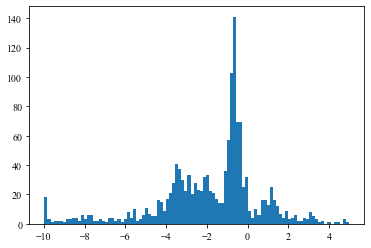

In [1441]:
a = plt.hist(tc[frac_times],100)

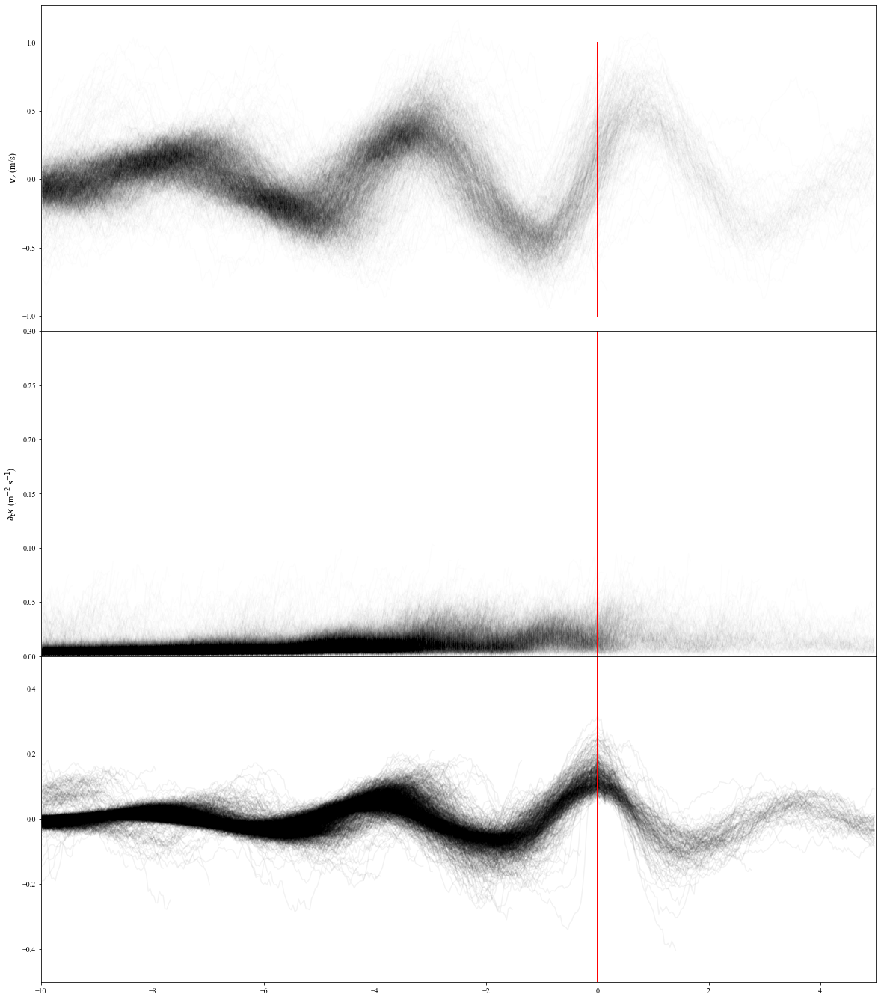

In [1442]:
n=3
fig,axs = plt.subplots(figsize=(20,8*n),nrows=n,sharex=True)
var = 'Udx'

Dt1 = 10
Dt2 = 5

fc = 0.05
lag=0
coeff = 1.5
[b,a] = sig.butter(4,fc,'high')

frac_times = []
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt1,t<t0+Dt2)

            uz = data['u'][2,i,j,indices]
            rotc = Udx[2,i,j,indices]

            tp = t[indices]
            tc = tp-t0

            #compute max amplitude
            fs = 0.1/33
            [b,a] = sig.butter(4,fs,'high')
            uz_filt =  sig.filtfilt(b,a,uz)
            h = np.cumsum(uz_filt)*dt

            
            A0 = (np.max(h)-np.min(h))/2

            k0 = w0**2/g

            kappa_t0 = A0*k0**2*w0*coeff
#            print(A0,kappa_t0,A0*k0)
            kapt = kappa2_t[i,j,indices]#kappa2_t
            inds_k = np.where(kapt>kappa_t0)[0]
            if len(inds_k)>0:
                frac = inds_k[0]
                kapt = kapt[:frac+lag]     
                tcp = tc[:frac+lag]
                frac_times.append(frac)
                uzp = uz[:frac+lag]
                rotcp = rotc[:frac+lag]
            else:
                frac = len(tc)
                tcp = tc
                uzp = uz
                rotcp = rotc
            axs[1].plot(tcp,kapt,'k',alpha=0.01)
            axs[1].plot([0,0],[-1,1],'r')           
#            axs[1].plot(tc,np.ones(len(tc))*kappa_t0*2,'r--',alpha=0.01)
#            y_high =  sig.filtfilt(b,a,kapt)
#            axs[1].plot(tp-t0,y_high*10,'b',alpha=0.01)
            # plot uz
#            [b,a] = sig.butter(4,fc,'high')
#            u_high[i,j,:] =  sig.filtfilt(b,a,y)

            axs[0].plot(tcp,uzp,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            axs[2].plot(tcp,rotcp,'k',alpha=0.05)
            axs[2].plot([0,0],[-1,1],'r')
#            y_high =  sig.filtfilt(b,a,rotc)
#            axs[2].plot(tp-t0,y_high*5,'b',alpha=0.01)

            

axs[2].set_ylim([-0.5,0.5])
axs[1].set_ylim([0,0.3])
axs[1].set_xlim([-Dt1,Dt2])

figs = graphes.legende(r'$t$ (s)',r'$v_z$ (m/s)','',ax=axs[0])
figs = graphes.legende(r'$t$ (s)',r'$\partial_t \kappa$ (m$^{-2}$ s$^{-1}$)','',ax=axs[1])
plt.subplots_adjust(hspace=0)

#graphes.save_figs(figs,savedir=savefolder,prefix='typical_')

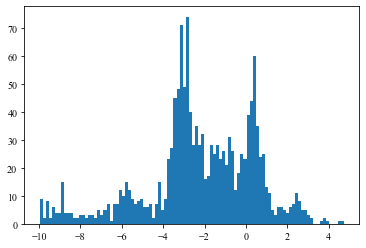

In [1443]:
a = plt.hist(tc[frac_times],100)

In [1451]:
m.keys()

dict_keys(['imaxs_rot', 'imins_rot', 'tmaxs_rot', 'tmins_rot', 'vmaxs_rot', 'vmins_rot', 'imaxs_div', 'imins_div', 'tmaxs_div', 'tmins_div', 'vmaxs_div', 'vmins_div', 'imaxs_Udx', 'imins_Udx', 'tmaxs_Udx', 'tmins_Udx', 'vmaxs_Udx', 'vmins_Udx', 'imaxs_shock', 'imins_shock', 'tmaxs_shock', 'tmins_shock', 'vmaxs_shock', 'vmins_shock', 'binary', 'vmaxs_rot_comp', 'vmaxs_rot_comp_comp', 'imaxs_kappa', 'imins_kappa', 'tmaxs_kappa', 'tmins_kappa', 'vmaxs_kappa', 'vmins_kappa', 'imaxs_kappa_t', 'imins_kappa_t', 'tmaxs_kappa_t', 'tmins_kappa_t', 'vmaxs_kappa_t', 'vmins_kappa_t', 'imaxs_kappa2_t', 'imins_kappa2_t', 'tmaxs_kappa2_t', 'tmins_kappa2_t', 'vmaxs_kappa2_t', 'vmins_kappa2_t', 'imaxs_kappa_s', 'imins_kappa_s', 'tmaxs_kappa_s', 'tmins_kappa_s', 'vmaxs_kappa_s', 'vmins_kappa_s'])

In [1454]:
colors = pl.cm.viridis(range(nx))
def colorrr(n)
    colors = pl.cm.viridis(np.linspace(0,1,100)
    return colors[n]

[[0.267004 0.004874 0.329415 1.      ]
 [0.26851  0.009605 0.335427 1.      ]
 [0.269944 0.014625 0.341379 1.      ]
 [0.271305 0.019942 0.347269 1.      ]
 [0.272594 0.025563 0.353093 1.      ]
 [0.273809 0.031497 0.358853 1.      ]
 [0.274952 0.037752 0.364543 1.      ]
 [0.276022 0.044167 0.370164 1.      ]
 [0.277018 0.050344 0.375715 1.      ]
 [0.277941 0.056324 0.381191 1.      ]
 [0.278791 0.062145 0.386592 1.      ]
 [0.279566 0.067836 0.391917 1.      ]
 [0.280267 0.073417 0.397163 1.      ]
 [0.280894 0.078907 0.402329 1.      ]
 [0.281446 0.08432  0.407414 1.      ]
 [0.281924 0.089666 0.412415 1.      ]
 [0.282327 0.094955 0.417331 1.      ]
 [0.282656 0.100196 0.42216  1.      ]
 [0.28291  0.105393 0.426902 1.      ]
 [0.283091 0.110553 0.431554 1.      ]
 [0.283197 0.11568  0.436115 1.      ]
 [0.283229 0.120777 0.440584 1.      ]
 [0.283187 0.125848 0.44496  1.      ]
 [0.283072 0.130895 0.449241 1.      ]
 [0.282884 0.13592  0.453427 1.      ]
 [0.282623 0.140926 0.457

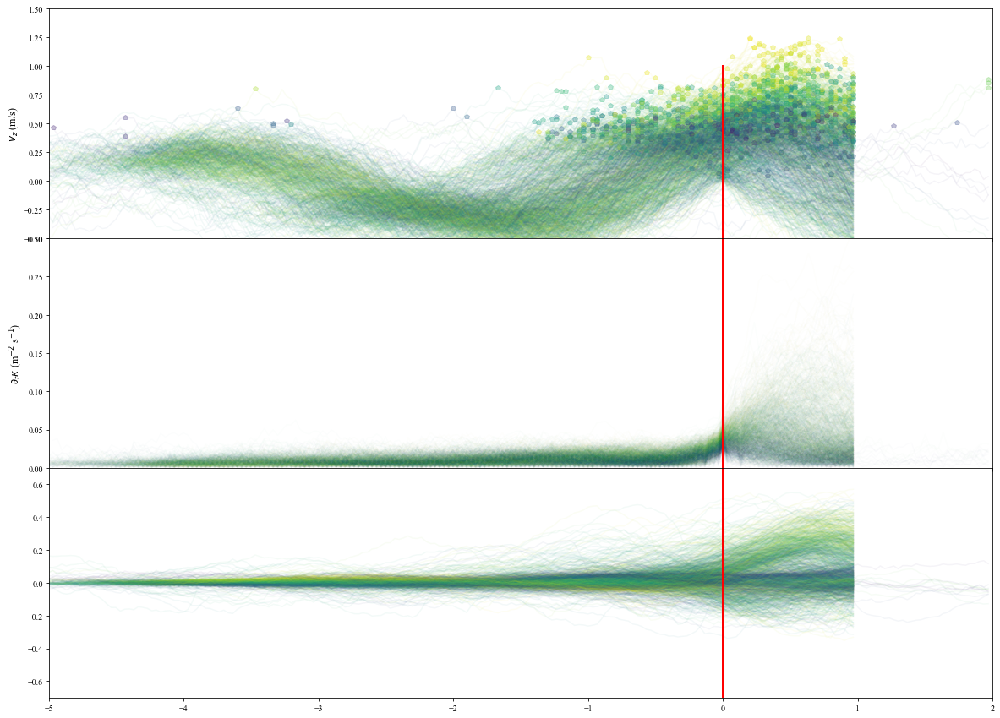

In [1473]:
import matplotlib as mpl
n=3
fig,axs = plt.subplots(figsize=(20,5*n),nrows=n,sharex=True)
var = 'rot'

Dt1 = 5
Dt2 = 2

fc = 0.05
lag=30
coeff = 1
[b,a] = sig.butter(4,fc,'high')

frac_times = []
x = data['X'][0,:]

cmap = mpl.colors.Colormap('viridis')

def colorrr(n):
    colors = plt.cm.viridis(np.linspace(0,1,256))
    return colors[n]

for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            color = colorrr(int(j/nx*256))
            
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt1,t<t0+Dt2)

            uz = data['u'][2,i,j,indices]
            rotc = rot[i,j,indices]

            tp = t[indices]
            tc = tp-t0

            #compute max amplitude
            fs = 0.1/33
            [b,a] = sig.butter(4,fs,'high')
            uz_filt =  sig.filtfilt(b,a,uz)
            h = np.cumsum(uz_filt)*dt

            
            A0 = (np.max(h)-np.min(h))/2

            k0 = w0**2/g

            kappa_t0 = A0*k0**2*w0*coeff
#            print(A0,kappa_t0,A0*k0)
            kapt = kappa2_t[i,j,indices]#kappa2_t
            inds_k = np.where(kapt>kappa_t0)[0]
            if len(inds_k)>0:
                frac = inds_k[0]
                tfrac = tc[frac]
                kapt = kapt[:frac+lag]     
                tcp = tc[:frac+lag]
                frac_times.append(frac)
                uzp = uz[:frac+lag]
                rotcp = rotc[:frac+lag]
            else:
                tfrac=0
                frac = len(tc)
                tcp = tc
                uzp = uz
                rotcp = rotc
            axs[1].plot(tcp-tfrac,kapt,color=color,alpha=0.01)
            axs[1].plot([0,0],[-1,1],'r')           

#            axs[1].plot(tc,np.ones(len(tc))*kappa_t0*2,'r--',alpha=0.01)
#            y_high =  sig.filtfilt(b,a,kapt)
#            axs[1].plot(tp-t0,y_high*10,'b',alpha=0.01)
            # plot uz
#            [b,a] = sig.butter(4,fc,'high')
#            u_high[i,j,:] =  sig.filtfilt(b,a,y)

            if uzp[-lag]<0:
                sign=-1
            else:
                sign=1
            tcc = tcp-tfrac
            axs[0].plot(tcc,uzp*sign,color=color,alpha=0.05)
            axs[0].plot([0,0],[-1,1],'r')

            imax = np.argmax(uzp*sign)
            axs[0].plot(tcc[imax],uzp[imax]*sign,'p',color=color,alpha=0.1)

            axs[2].plot(tcp-tfrac,rotcp,color=color,alpha=0.05)
            axs[2].plot([0,0],[-1,1],'r')
#            y_high =  sig.filtfilt(b,a,rotc)
#            axs[2].plot(tp-t0,y_high*5,'b',alpha=0.01)
axs[2].set_ylim([-0.7,0.7])
axs[1].set_ylim([0,0.3])
axs[1].set_xlim([-Dt1,Dt2])

axs[0].set_ylim([-0.5,1.5])


figs = graphes.legende(r'$t$ (s)',r'$v_z$ (m/s)','',ax=axs[0])
figs = graphes.legende(r'$t$ (s)',r'$\partial_t \kappa$ (m$^{-2}$ s$^{-1}$)','',ax=axs[1])
plt.subplots_adjust(hspace=0)

#graphes.save_figs(figs,savedir=savefolder,prefix='typical_')

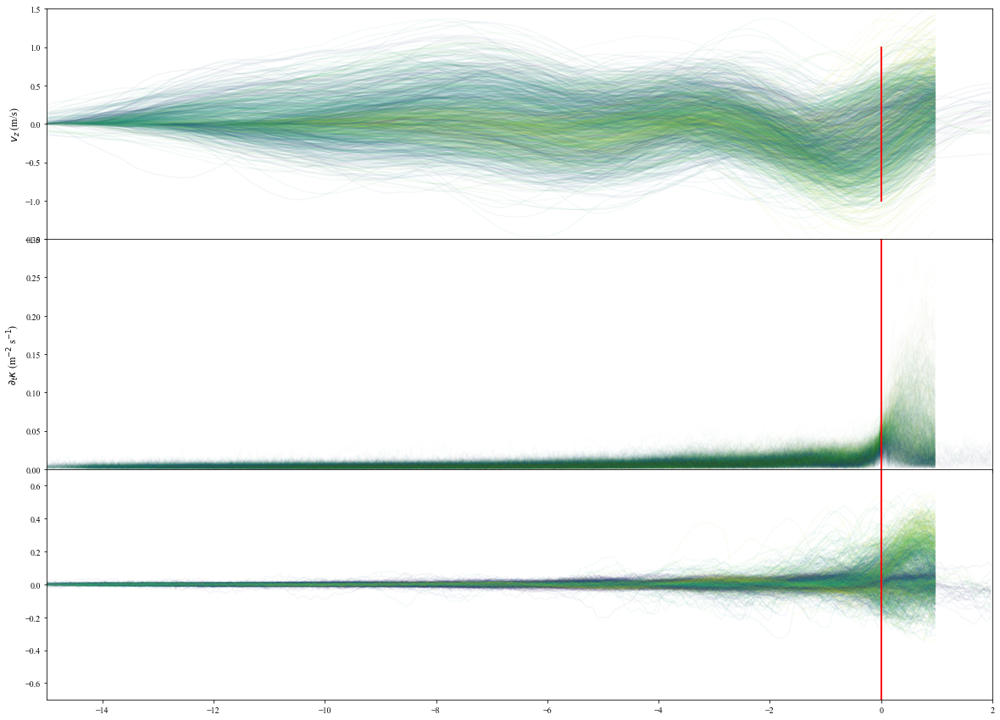

In [1477]:
import matplotlib as mpl
n=3
fig,axs = plt.subplots(figsize=(20,5*n),nrows=n,sharex=True)
var = 'rot'

Dt1 = 15
Dt2 = 2

fc = 0.05
lag=30
coeff = 1
[b,a] = sig.butter(4,fc,'high')

frac_times = []
x = data['X'][0,:]

cmap = mpl.colors.Colormap('viridis')

def colorrr(n):
    colors = plt.cm.viridis(np.linspace(0,1,256))
    return colors[n]

for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            color = colorrr(int(j/nx*256))
            
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt1,t<t0+Dt2)

            uz = data['u'][2,i,j,indices]
            rotc = rot[i,j,indices]

            tp = t[indices]
            tc = tp-t0

            #compute max amplitude
            fs = 0.1/33
            [b,a] = sig.butter(4,fs,'high')
            uz_filt =  sig.filtfilt(b,a,uz)
            h = np.cumsum(uz_filt)*dt

            
            A0 = (np.max(h)-np.min(h))/2

            k0 = w0**2/g

            kappa_t0 = A0*k0**2*w0*coeff
#            print(A0,kappa_t0,A0*k0)
            kapt = kappa2_t[i,j,indices]#kappa2_t
            inds_k = np.where(kapt>kappa_t0)[0]
            if len(inds_k)>0:
                frac = inds_k[0]
                tfrac = tc[frac]
                kapt = kapt[:frac+lag]     
                tcp = tc[:frac+lag]
                frac_times.append(frac)
                uzp = uz[:frac+lag]
                rotcp = rotc[:frac+lag]
                hp = h[:frac+lag]
            else:
                tfrac=0
                frac = len(tc)
                tcp = tc
                uzp = uz
                rotcp = rotc
                hp = h

            axs[1].plot(tcp-tfrac,kapt,color=color,alpha=0.01)
            axs[1].plot([0,0],[-1,1],'r')           

#            axs[1].plot(tc,np.ones(len(tc))*kappa_t0*2,'r--',alpha=0.01)
#            y_high =  sig.filtfilt(b,a,kapt)
#            axs[1].plot(tp-t0,y_high*10,'b',alpha=0.01)
            # plot uz
#            [b,a] = sig.butter(4,fc,'high')
#            u_high[i,j,:] =  sig.filtfilt(b,a,y)

            if uzp[-lag]<0:
                sign=-1
            else:
                sign=1
            tcc = tcp-tfrac
            axs[0].plot(tcc,hp*sign,color=color,alpha=0.05)
            axs[0].plot([0,0],[-1,1],'r')

            #imax = np.argmax(uzp*sign)
            #axs[0].plot(tcc[imax],uzp[imax]*sign,'p',color=color,alpha=0.1)

            axs[2].plot(tcp-tfrac,rotcp,color=color,alpha=0.05)
            axs[2].plot([0,0],[-1,1],'r')
#            y_high =  sig.filtfilt(b,a,rotc)
#            axs[2].plot(tp-t0,y_high*5,'b',alpha=0.01)
axs[2].set_ylim([-0.7,0.7])
axs[1].set_ylim([0,0.3])
axs[1].set_xlim([-Dt1,Dt2])

axs[0].set_ylim([-1.5,1.5])


figs = graphes.legende(r'$t$ (s)',r'$v_z$ (m/s)','',ax=axs[0])
figs = graphes.legende(r'$t$ (s)',r'$\partial_t \kappa$ (m$^{-2}$ s$^{-1}$)','',ax=axs[1])
plt.subplots_adjust(hspace=0)

#graphes.save_figs(figs,savedir=savefolder,prefix='typical_')

(-10.0, 10.0)

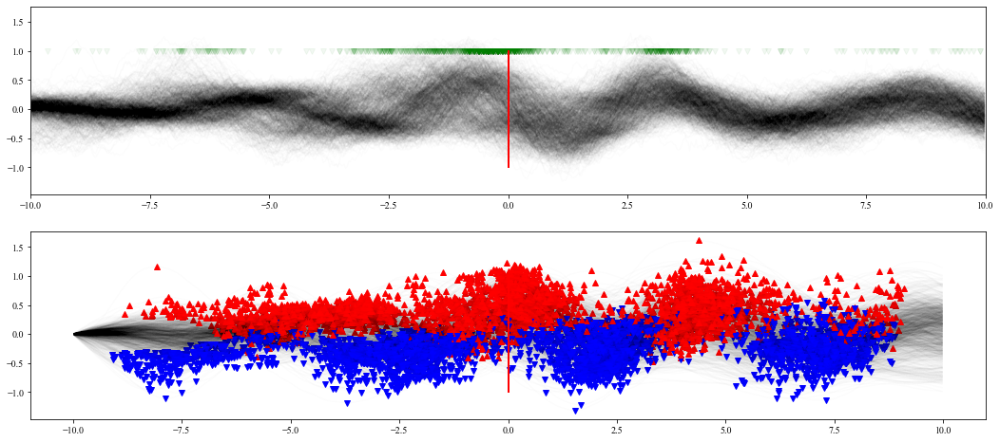

In [1208]:
n=3
fig,axs = plt.subplots(figsize=(18,4*n),nrows=2,sharey=True)
var = 'div'

Dt = 10
A=[]
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt,t<t0+Dt)

            uz = data['u'][2,i,j,indices]
            tp = t[indices]
            tc = tp-t0
            
            axs[0].plot(tc,uz,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            trot = m[f'tmaxs_rot'][i,j]-t0
            axs[0].plot(trot,1,'gv',alpha=0.05)

            h = np.cumsum(uz)*dt
            
            peaks = sig.find_peaks(h,distance=100,prominence=0.3)[0]            
            axs[1].plot(tc[peaks],h[peaks],'r^')
            #imax1 = np.argmax(peaks[tc[peaks]<0])
            
            peaks = sig.find_peaks(-h,distance=100,prominence=0.3)[0]            
            axs[1].plot(tc[peaks],h[peaks],'bv')
            axs[1].plot(tp-t0,h,'k',alpha=0.01)

            axs[1].plot([0,0],[-1,1],'r')

            dh = np.max(h)-np.min(h)
#            imin = np.argmax(peaks[tc[peaks]<0])
            A.append(dh)

axs[0].set_xlim([-10,10])



In [1554]:
m.keys()

dict_keys(['imaxs_rot', 'imins_rot', 'tmaxs_rot', 'tmins_rot', 'vmaxs_rot', 'vmins_rot', 'imaxs_div', 'imins_div', 'tmaxs_div', 'tmins_div', 'vmaxs_div', 'vmins_div', 'imaxs_Udx', 'imins_Udx', 'tmaxs_Udx', 'tmins_Udx', 'vmaxs_Udx', 'vmins_Udx', 'imaxs_shock', 'imins_shock', 'tmaxs_shock', 'tmins_shock', 'vmaxs_shock', 'vmins_shock', 'binary', 'vmaxs_rot_comp', 'vmaxs_rot_comp_comp', 'imaxs_kappa', 'imins_kappa', 'tmaxs_kappa', 'tmins_kappa', 'vmaxs_kappa', 'vmins_kappa', 'imaxs_kappa_t', 'imins_kappa_t', 'tmaxs_kappa_t', 'tmins_kappa_t', 'vmaxs_kappa_t', 'vmins_kappa_t', 'imaxs_kappa2_t', 'imins_kappa2_t', 'tmaxs_kappa2_t', 'tmins_kappa2_t', 'vmaxs_kappa2_t', 'vmins_kappa2_t', 'imaxs_kappa_s', 'imins_kappa_s', 'tmaxs_kappa_s', 'tmins_kappa_s', 'vmaxs_kappa_s', 'vmins_kappa_s', 'bigs', 'labels', 'labnums', 'tmaxs_frac_kapt'])

In [1555]:
#normalize time
T = -10*np.ones((ny,nx))

for lab in labnums:
    ilist,jlist = np.where(lab==m['labels'])
    tlist = []
    for (i,j) in zip(ilist,jlist):
        tlist.append(m['tmaxs_frac_kapt'][i,j])
    t0 = np.median(tlist)
    print(tlist)
    for (i,j) in zip(ilist,jlist):
        T[i,j] = m['tmaxs_frac_kapt'][i,j]-t0

[50.650650650650654, 50.617283950617285, 60.06006006006006, 59.39272605939273, 49.44944944944945, 49.315982649315984]
[44.94494494494494, 45.04504504504504, 44.87821154487821, 45.04504504504504, 45.21187854521188, 49.315982649315984, 47.180513847180514, 45.71237904571238, 45.41207874541208, 45.17851184517851, 46.04604604604605, 45.24524524524525, 45.27861194527861, 45.41207874541208, 45.14514514514514]
[39.73973973973974, 39.77310643977311, 0.0, 0.0, 39.50617283950618]
[26.292959626292962, 25.825825825825827, 25.458792125458793, 25.759092425759093, 25.425425425425427]
[31.664998331665, 31.998665331998666, 31.598264931598266, 31.631631631631635, 32.098765432098766, 31.5648982315649, 31.5648982315649]
[39.17250583917251, 39.17250583917251, 43.34334334334334, 39.23923923923924, 43.04304304304304, 39.23923923923924]
[43.41007674341008, 40.47380714047381, 40.80747414080748, 44.07741074407741, 43.61027694361028, 40.14014014014014]
[43.34334334334334, 43.20987654320988, 43.07640974307641, 42.

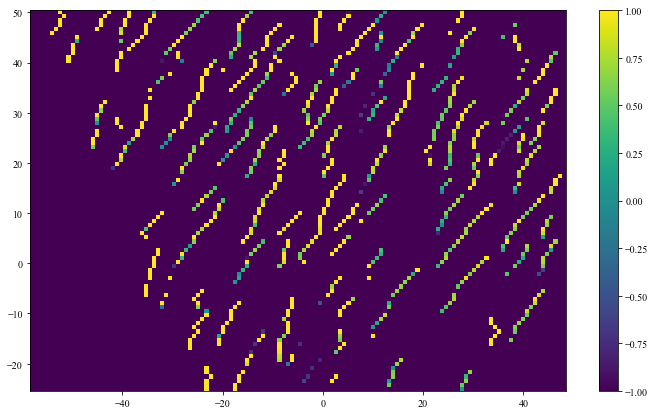

In [1565]:
#colormap of the fracture, color codes the time of opening (in rot max ?)
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

sc = ax.pcolormesh(X,Y,T,vmin=-1,vmax=1)
plt.colorbar(sc)



In [1618]:
#normalize time
T = np.zeros((ny,nx))
T[:] = np.nan
var = 'rot'
for lab in labnums:
    ilist,jlist = np.where(lab==m['labels'])
    tlist = []
    for (i,j) in zip(ilist,jlist):
        Dt = m[f'tmaxs_{var}'][i,j]-m['tmaxs_frac_kapt'][i,j]
        T[i,j] = Dt

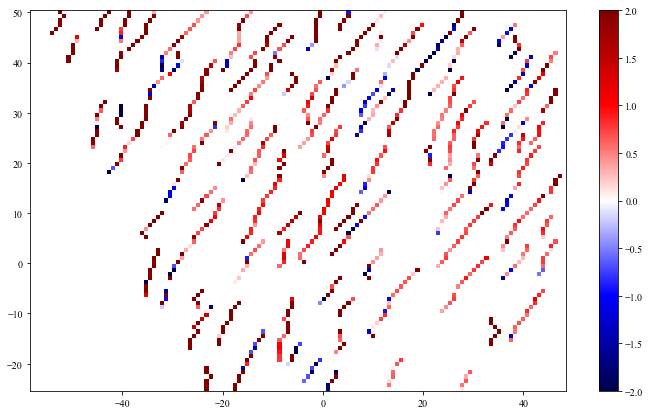

In [1616]:
#colormap of the fracture, color codes the time of opening (in rot max ?)
fig,ax = plt.subplots(figsize=(12,7))#,nrows=2,sharex=True)

sc = ax.pcolormesh(X,Y,T,vmin=-2,vmax=2,cmap='seismic')
plt.colorbar(sc)

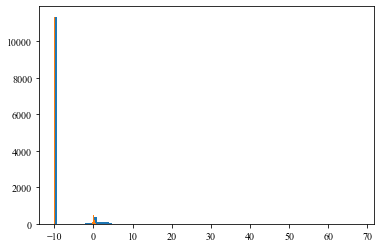

In [1611]:
a = plt.hist(np.reshape(T,(nx*ny,)),100)
a = plt.hist(np.reshape(Trot,(nx*ny,)),100)

In [1612]:
for i T==-10]

11346

In [1613]:
np.sum(Trot==-10)

11346

In [ ]:
plt.hist(

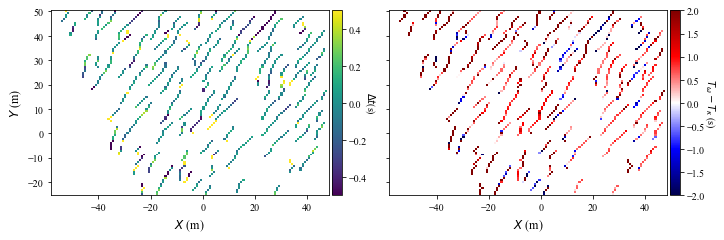

In [1619]:
#normalize time

fig,axs = plt.subplots(figsize=(12,3.4),ncols=2,sharey=True)

Trot = -10*np.ones((ny,nx))
Trot[:] = np.nan

var = 'rot'
for lab in labnums:
    ilist,jlist = np.where(lab==m['labels'])
    tlist = []
    for (i,j) in zip(ilist,jlist):
        tlist.append(m[f'tmaxs_{var}'][i,j])
    t0 = np.median(tlist)
    for (i,j) in zip(ilist,jlist):
        Trot[i,j] = m[f'tmaxs_{var}'][i,j]-t0
        

#colormap of the fracture, color codes the time of opening (in rot max ?)

sc = axs[0].pcolormesh(X,Y,Trot,vmin=-0.5,vmax=0.5)
cbar1 = plt.colorbar(sc,pad = 0.01)

sc = axs[1].pcolormesh(X,Y,T,vmin=-2,vmax=2,cmap='seismic')
cbar2 = plt.colorbar(sc,pad = 0.01)


plt.subplots_adjust(wspace=0.02)

graphes.legende('$X$ (m)','$Y$ (m)','',ax=axs[0])
figs = graphes.legende('$X$ (m)','','',ax=axs[1])

cbar1.ax.set_ylabel(r'$\Delta t$(s)', rotation=270,labelpad=10)
cbar2.ax.set_ylabel(r'$T_\omega - T_\kappa$ (s)', rotation=270,labelpad=12)

graphes.save_figs(figs,savedir=savefolder,overwrite=True,prefix='Time_maps_bg_')

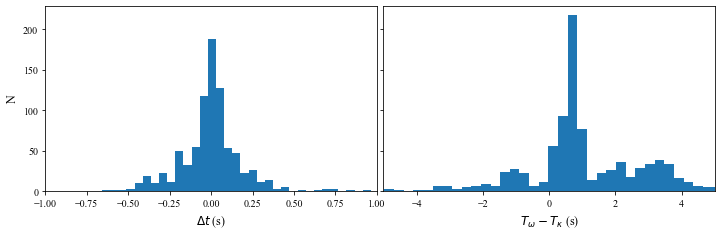

In [1639]:
#normalize time
fig,axs = plt.subplots(figsize=(12,3.4),ncols=2,nrows=1,sharey=True)
#fig = plt.figure(figsize=(12,8),constrained_layout=True)
#gs = fig.add_gridspec(3, 2)
#ax = fig.add_subplot(gs[2,0])
ax = axs[0]

ax.hist(np.reshape(Trot,(nx*ny,)),400)
ax.set_xlim([-1,1])
figs = graphes.legende(r'$\Delta t$ (s)','N','',ax=ax)


ax = axs[1]
ax.hist(np.reshape(T,(nx*ny,)),250)
ax.set_xlim([-5,5])
figs = graphes.legende(r'$T_\omega - T_\kappa$ (s)','','',ax=ax)

plt.subplots_adjust(wspace=0.02)


graphes.save_figs(figs,savedir=savefolder,overwrite=True,prefix='Time_histogram')

(-10.0, 10.0)

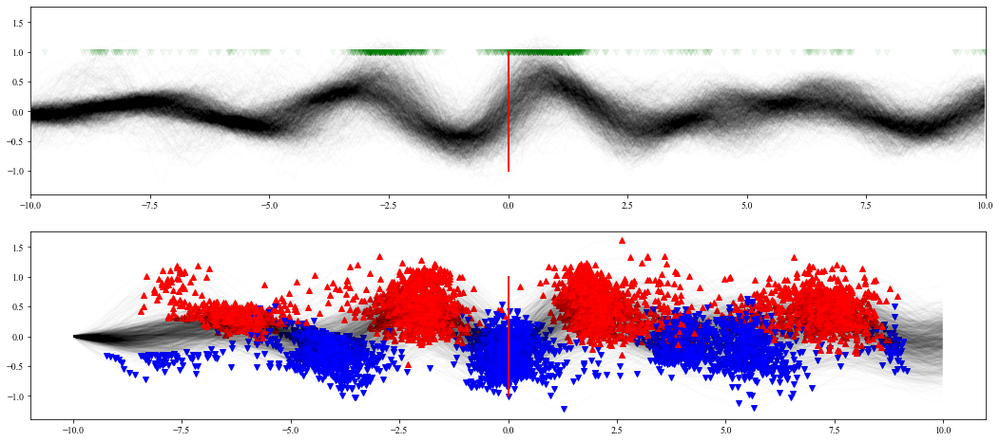

In [1228]:
fig,axs = plt.subplots(figsize=(18,8),nrows=2,sharey=True)
var = 'Udx'

Dt = 10
A=[]
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt,t<t0+Dt)

            uz = data['u'][2,i,j,indices]
            tp = t[indices]
            tc = tp-t0
            
            axs[0].plot(tc,uz,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            trot = m[f'tmaxs_rot'][i,j]-t0
            axs[0].plot(trot,1,'gv',alpha=0.05)

            h = np.cumsum(uz)*dt
            
            peaks = sig.find_peaks(h,distance=100,prominence=0.3)[0]            
            axs[1].plot(tc[peaks],h[peaks],'r^')
            #imax1 = np.argmax(peaks[tc[peaks]<0])
            
            peaks = sig.find_peaks(-h,distance=100,prominence=0.3)[0]            
            axs[1].plot(tc[peaks],h[peaks],'bv')
            axs[1].plot(tp-t0,h,'k',alpha=0.01)

            axs[1].plot([0,0],[-1,1],'r')

            dh = np.max(h)-np.min(h)
#            imin = np.argmax(peaks[tc[peaks]<0])
            A.append(dh)
axs[0].set_xlim([-10,10])


In [1215]:
#criterion on duz/dx

x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape

var = 'shock'
m[f'imaxs_{var}']=np.zeros((ny,nx))
m[f'imins_{var}']=np.zeros((ny,nx))
m[f'tmaxs_{var}']=np.zeros((ny,nx))
m[f'tmins_{var}']=np.zeros((ny,nx))
m[f'vmaxs_{var}']=np.zeros((ny,nx))
m[f'vmins_{var}']=np.zeros((ny,nx))

tmax = 1600
fc = 0.1
for i0 in range(ny):
    y = Udx[2,i0,:,:tmax]
    u_high = np.zeros((nx,tmax))
    [b,a] = sig.butter(4,fc,'high')
    for j in range(nx):
        u_high[j,:] =  sig.filtfilt(b,a,y[j,:])
    
    indmax = np.argmax(u_high,axis=1)
    indmin = np.argmin(u_high,axis=1)
    
    m[f'imaxs_{var}'][i0,:]=indmax
    m[f'imins_{var}'][i0,:]=indmin
    m[f'tmaxs_{var}'][i0,:]=t[indmax]
    m[f'tmins_{var}'][i0,:]=t[indmin]

    m[f'vmaxs_{var}'][i0,:]=np.asarray([rot[i0,j,ind] for j,ind in enumerate(indmax)])
    m[f'vmins_{var}'][i0,:]=np.asarray([rot[i0,j,ind] for j,ind in enumerate(indmin)])
 

(-10.0, 10.0)

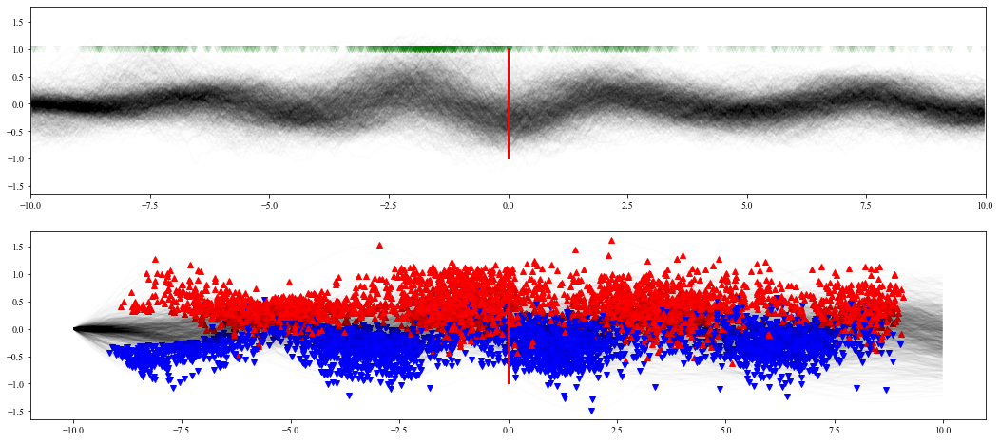

In [1216]:
fig,axs = plt.subplots(figsize=(18,8),nrows=2,sharey=True)
var = 'shock'

Dt = 10
A=[]
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt,t<t0+Dt)

            uz = data['u'][2,i,j,indices]
            tp = t[indices]
            tc = tp-t0
            
            axs[0].plot(tc,uz,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            trot = m[f'tmaxs_rot'][i,j]-t0
            axs[0].plot(trot,1,'gv',alpha=0.05)

            h = np.cumsum(uz)*dt
            
            peaks = sig.find_peaks(h,distance=100,prominence=0.3)[0]            
            axs[1].plot(tc[peaks],h[peaks],'r^')
            #imax1 = np.argmax(peaks[tc[peaks]<0])
            
            peaks = sig.find_peaks(-h,distance=100,prominence=0.3)[0]            
            axs[1].plot(tc[peaks],h[peaks],'bv')
            axs[1].plot(tp-t0,h,'k',alpha=0.01)m[f'imaxs_{var}']

            axs[1].plot([0,0],[-1,1],'r')

            dh = np.max(h)-np.min(h)
#            imin = np.argmax(peaks[tc[peaks]<0])
            A.append(dh)
axs[0].set_xlim([-10,10])


(0.0, 2.0)

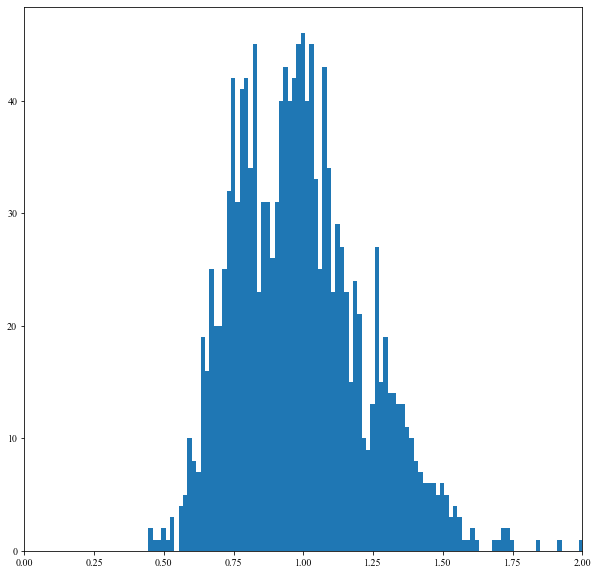

In [1154]:
fig,axs = plt.subplots(figsize=(10,10))#,nrows=2,sharey=True)
fig = plt.hist(A,100)

plt.xlim([0,2])

0.0030303030303030303


In [1156]:
kappa.shape

(93, 132, 3475)

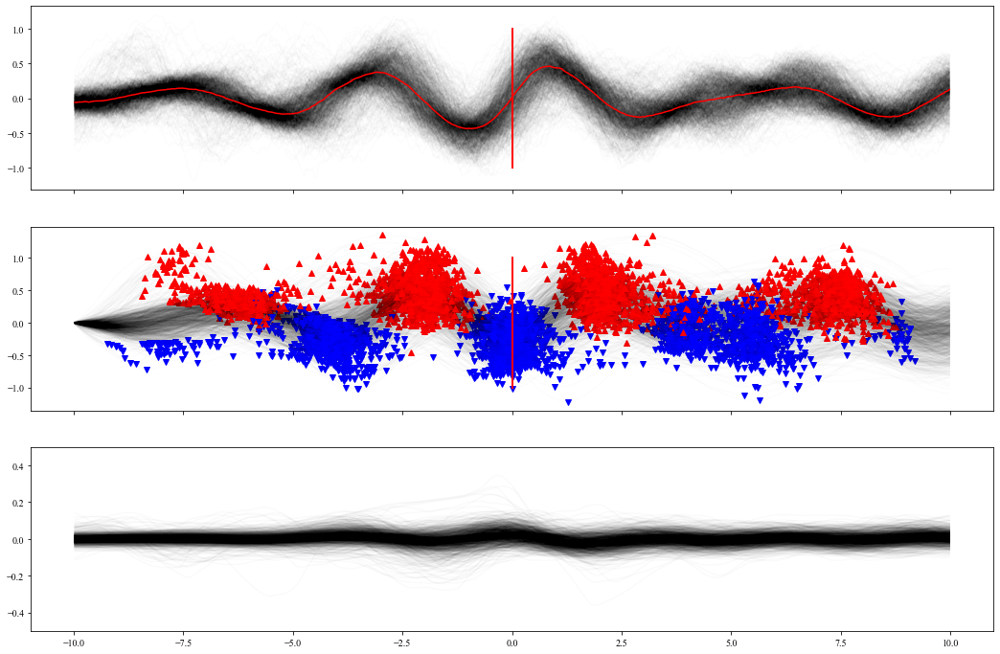

In [1259]:
n=3
fig,axs = plt.subplots(figsize=(18,n*4),nrows=n,sharex=True)
var = 'Udx'

Dt = 10
A=[]
kc = []
tkap=[]
x0 = []

Uzs = []
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt,t<t0+Dt)
            x = data['X'][0,:]
            uz = data['u'][2,i,j,indices]
            tp = t[indices]
            tc = tp-t0

            if len(uz)==599:
                Uzs.append(uz)
                
                axs[0].plot(tc,uz,'k',alpha=0.01)
                axs[0].plot([0,0],[-1,1],'r')
    
                h = np.cumsum(uz)*dt
                
                peaks = sig.find_peaks(h,distance=100,prominence=0.3)[0]            
                axs[1].plot(tc[peaks],h[peaks],'r^')
                #imax1 = np.argmax(peaks[tc[peaks]<0])
                
                peaks = sig.find_peaks(-h,distance=100,prominence=0.3)[0]            
                axs[1].plot(tc[peaks],h[peaks],'bv')
                axs[1].plot(tp-t0,h,'k',alpha=0.01)
    
                axs[1].plot([0,0],[-1,1],'r')
    
                kap = kappa[i,j,indices]
                dh = np.max(h)-np.min(h)
                kc1 = np.max(np.abs(kap))
                i0 = np.argmax(np.abs(kap))
                
                axs[2].plot(tc,kap,'k',alpha=0.02)
                
    #            imin = np.argmax(peaks[tc[peaks]<0])
                A.append(dh)
                kc.append(kc1)
                tkap.append(tc[i0])
    
                x0.append(x[j])
                axs[2].set_ylim([-0.5,0.5])

#Uzs = np.asarray(Uzs)
#print(Uzs.shape)
Uz_med = np.median(Uzs,axis=0)
axs[0].plot(tc,Uz_med,'r-')

In [1184]:
np.asarray(Uzs).shape

(1291, 599)

In [1236]:
print(np.min(x),np.max(x))

-58.0 48.0


43

[1.08086001 0.59161038 0.81150702 ... 1.06140504 0.94199215 0.91523725]


RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

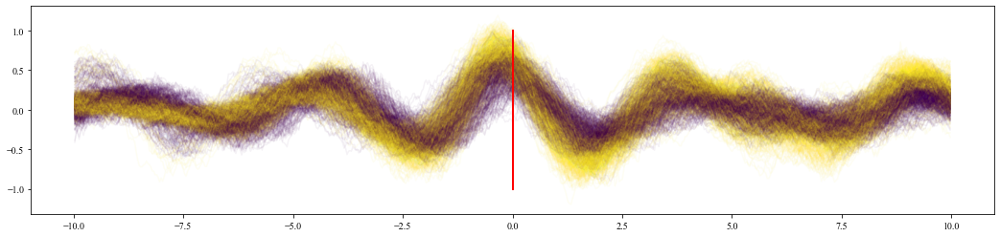

In [1249]:
import matplotlib.pyplot as pl


n=1
fig,ax = plt.subplots(figsize=(18,n*4),nrows=n,sharex=True)
Uz_moy = np.median(Uzs,axis=0)

err = np.sqrt(np.mean((np.asarray(Uzs)-Uz_moy[None,:])**2,axis=1)/np.mean(Uz_moy**2))
print(err)
c=0


colors = pl.cm.viridis(x)

for i,uz in enumerate(list(Uzs)):
    if err[i]<1.3:
        ind = np.where(x==x0[i])[0][0]
        ax.plot(tc,uz,alpha=0.05,color=colors[ind])
        ax.plot([0,0],[-1,1],'r')
        c=c+1

cbar = plt.colorbar()

ax.plot(tc,Uz_moy,'r-')
print(c)

(array([ 7.,  3.,  6.,  5., 22.,  9., 22., 14., 21., 26., 32., 17., 34.,
        21., 40., 30., 37., 26., 44., 35., 39., 24., 54., 27., 32., 26.,
        28., 42., 30., 40., 27., 44., 26., 47., 26., 39., 25., 26., 24.,
        49., 23., 31., 19., 28., 13., 15., 14., 10.,  5.,  7.]),
 array([-53.95419847, -51.94748092, -49.94076336, -47.9340458 ,
        -45.92732824, -43.92061069, -41.91389313, -39.90717557,
        -37.90045802, -35.89374046, -33.8870229 , -31.88030534,
        -29.87358779, -27.86687023, -25.86015267, -23.85343511,
        -21.84671756, -19.84      , -17.83328244, -15.82656489,
        -13.81984733, -11.81312977,  -9.80641221,  -7.79969466,
         -5.7929771 ,  -3.78625954,  -1.77954198,   0.22717557,
          2.23389313,   4.24061069,   6.24732824,   8.2540458 ,
         10.26076336,  12.26748092,  14.27419847,  16.28091603,
         18.28763359,  20.29435115,  22.3010687 ,  24.30778626,
         26.31450382,  28.32122137,  30.32793893,  32.33465649,
         34.

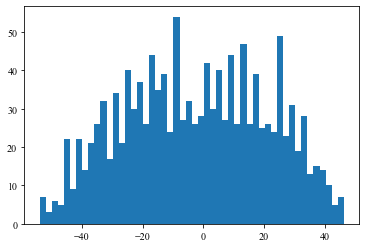

In [1247]:
plt.hist(x0,50)

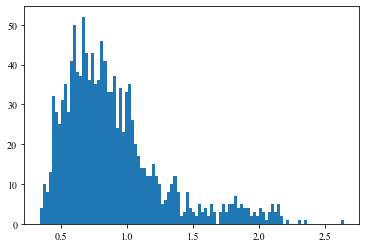

In [1233]:
a= plt.hist(err,100)

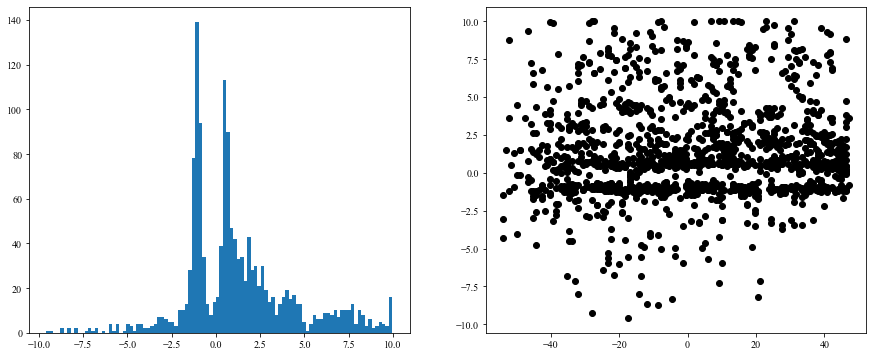

In [1169]:
fig,axs = plt.subplots(figsize=(15,6),ncols=2)#,sharey=True)
axs[0].hist(tkap,100)
axs[1].plot(x0,tkap,'ko')


#plt.xlim([0,2])

In [1166]:
np.mean(tkap)

1.2355061966401704

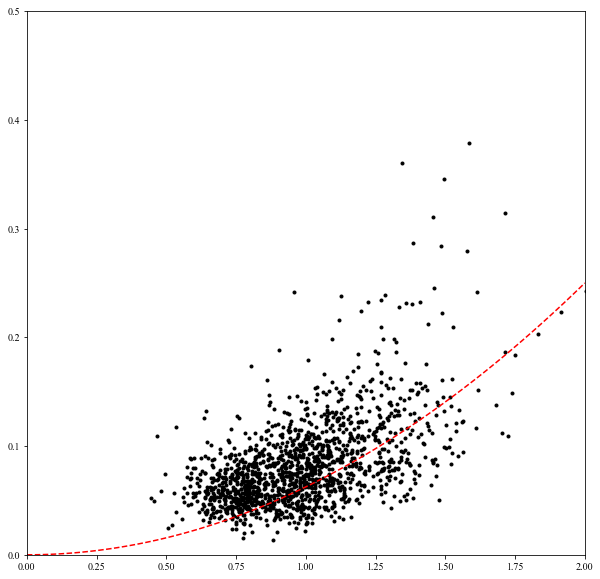

In [1163]:
fig,ax = plt.subplots(figsize=(10,10))#,nrows=2,sharey=True)

ax.plot(A,kc,'k.')

ax.set_xlim([0,2])
ax.set_ylim([0,0.5])

Ath = np.linspace(0,2,100)
ax.plot(Ath,(Ath/4)**2,'r--')

In [ ]:
fig,axs = plt.subplots(figsize=(18,7),nrows=2,sharey=True)
var = 'rot'

Dt = 10
for i in range(ny):
    for j in range(nx):
        if binary[i,j]==1.:
            k0 = m[f'imaxs_{var}'][i,j]
            t0 = m[f'tmaxs_{var}'][i,j]
            t = np.asarray(data['t'])
            indices = np.logical_and(t>=t0-Dt,t<t0+Dt)

            uz = data['u'][2,i,j,indices]
            tp = t[indices]

            
            axs[0].plot(tp-t0,uz,'k',alpha=0.01)
            axs[0].plot([0,0],[-1,1],'r')

            h = np.cumsum(uz)*dt
            axs[1].plot(tp-t0,h,'k',alpha=0.01)
            axs[1].plot([0,0],[-1,1],'r')
figs = graphes.legende('','','')


In [1661]:
import icewave.tools.rw_data as rw

filename = savefolder+'/fracture_positions.pkl'
rw.write_pkl(filename,m)
filename = savefolder+'/fracture_positions.h5'
rw.write_h5(filename,m)

In [1662]:
m.keys()

dict_keys(['imaxs_rot', 'imins_rot', 'tmaxs_rot', 'tmins_rot', 'vmaxs_rot', 'vmins_rot', 'imaxs_div', 'imins_div', 'tmaxs_div', 'tmins_div', 'vmaxs_div', 'vmins_div', 'imaxs_Udx', 'imins_Udx', 'tmaxs_Udx', 'tmins_Udx', 'vmaxs_Udx', 'vmins_Udx', 'imaxs_shock', 'imins_shock', 'tmaxs_shock', 'tmins_shock', 'vmaxs_shock', 'vmins_shock', 'binary', 'vmaxs_rot_comp', 'vmaxs_rot_comp_comp', 'imaxs_kappa', 'imins_kappa', 'tmaxs_kappa', 'tmins_kappa', 'vmaxs_kappa', 'vmins_kappa', 'imaxs_kappa_t', 'imins_kappa_t', 'tmaxs_kappa_t', 'tmins_kappa_t', 'vmaxs_kappa_t', 'vmins_kappa_t', 'imaxs_kappa2_t', 'imins_kappa2_t', 'tmaxs_kappa2_t', 'tmins_kappa2_t', 'vmaxs_kappa2_t', 'vmins_kappa2_t', 'imaxs_kappa_s', 'imins_kappa_s', 'tmaxs_kappa_s', 'tmins_kappa_s', 'vmaxs_kappa_s', 'vmins_kappa_s', 'bigs', 'labels', 'labnums', 'tmaxs_frac_kapt', 'imaxs_Udx_high', 'imins_Udx_high', 'tmaxs_Udx_high', 'tmins_Udx_high', 'vmaxs_Udx_high', 'vmins_Udx_high'])

In [1138]:
#criterion on vz
#criterion on div

x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape

var = 'Uz'
m[f'imaxs_{var}']=np.zeros((ny,nx))
m[f'imins_{var}']=np.zeros((ny,nx))
m[f'tmaxs_{var}']=np.zeros((ny,nx))
m[f'tmins_{var}']=np.zeros((ny,nx))
m[f'vmaxs_{var}']=np.zeros((ny,nx))
m[f'vmins_{var}']=np.zeros((ny,nx))

tmax = 1600
u = data['u']
for i0 in range(ny):
    indmax = np.argmax(u[2,i0,:,:tmax],axis=1)
    indmin = np.argmin(u[2,i0,:,:tmax],axis=1)
    
    m[f'imaxs_{var}'][i0,:]=indmax
    m[f'imins_{var}'][i0,:]=indmin
    m[f'tmaxs_{var}'][i0,:]=t[indmax]
    m[f'tmins_{var}'][i0,:]=t[indmin]

    m[f'vmaxs_{var}'][i0,:]=np.asarray([u[2,i0,j,ind] for j,ind in enumerate(indmax)])
    m[f'vmins_{var}'][i0,:]=np.asarray([u[2,i0,j,ind] for j,ind in enumerate(indmin)])

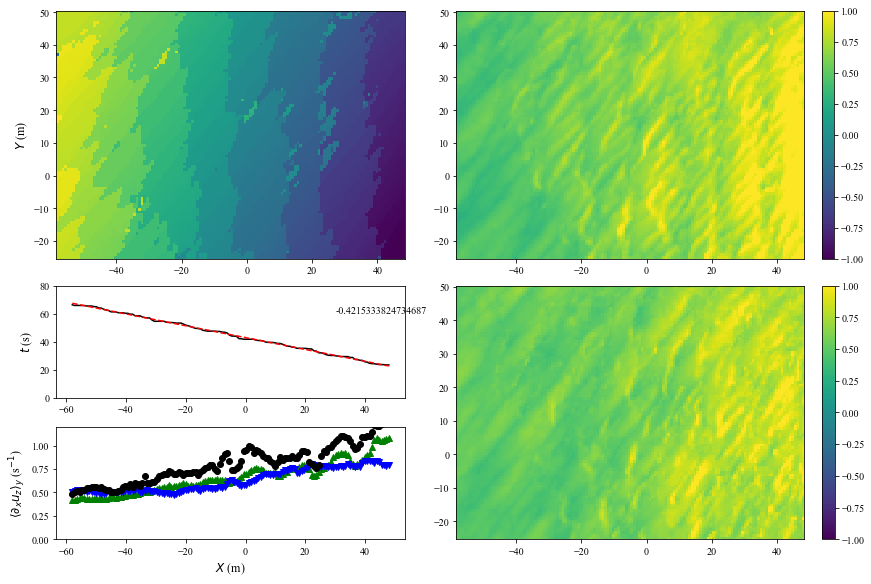

In [1141]:
#fig,axs = plt.subplots(figsize=(12,8),nrows=2,sharex=True)
fig = plt.figure(figsize=(12,8),constrained_layout=True)
gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

var = 'Uz'

ax = fig.add_subplot(gs[:2,0])

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
#plt.colorbar(sc)
graphes.legende('',r'$Y$ (m)','',ax=ax)


ax = fig.add_subplot(gs[:2,1])
#sc = ax.pcolormesh(X,Y,-m['vmins'])#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=-1,vmax=1)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)

plt.colorbar(sc)

ax = fig.add_subplot(gs[2:,1])
sc = ax.pcolormesh(X,Y,-m[f'vmins_{var}'],vmin=-1,vmax=1)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



ax = fig.add_subplot(gs[2,0])
x = X[0,:]
tmed = np.median(m[f'tmaxs_{var}'],axis=0)
ax.plot(x,tmed,'k')

p = np.polyfit(x,tmed,1)
ax.plot(x,np.polyval(p,x),'r--')

ax.text(30,60,f'{p[0]}')
graphes.legende('','$t$ (s)','',ax=ax)
ax.set_ylim([0,80])

#plt.subplots_adjust(hspace=0)


ax = fig.add_subplot(gs[3,0])
vmax = np.median(m[f'vmaxs_{var}'],axis=0)
vmin = np.median(-m[f'vmins_{var}'],axis=0)

v90 = np.sort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.95),:]

ax.plot(x,vmax,'g^')
ax.plot(x,vmin,'bv')
ax.plot(x,v90,'ko')
ax.set_ylim([0,1.2])
figs = graphes.legende(r'$X$ (m)',r'$\langle \partial_x u_z \rangle_y$ (s$^{-1}$)','',ax=ax)

graphes.save_figs(figs,savedir=savefolder,prefix=f'Criterion_{var}_',overwrite=True)

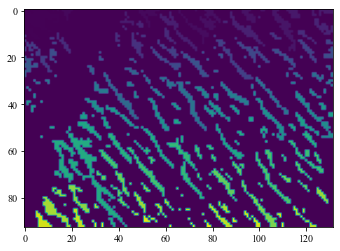

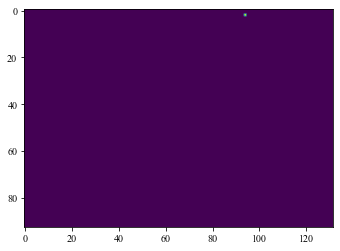

In [ ]:
var = 'rot'
fig,axs = plt.subplots(figsize=(12,7*2),nrows=2,sharex=True)
#fig = plt.figure(figsize=(12,8))#,constrained_layout=True)
#gs = fig.add_gridspec(4, 2)

X = data['X']
Y = data['Y']

t = np.asarray(data['t'])
y = np.asarray(data['Y'][:,0])

#ax = fig.add_subplot(gs[:2,0])
ax = axs[0]

sc = ax.pcolormesh(X,Y,m[f'tmaxs_{var}'],vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)



indmaxmax = np.argsort(m[f'vmaxs_{var}'],axis=0)[int(ny*0.8):,:]#compute the value of the largest 5% of the max for each x

print(indmaxmax.shape)

for i in range(nx):
    inds = indmaxmax[:,i]
    ax.plot(x[i]*np.ones(len(inds)),y[inds],'r.',markersize=2)

figs = graphes.legende('$X$ (m)','$Y$ (m)','Time max of '+f'{var}',ax=ax)

ax = axs[1]

sc = ax.pcolormesh(X,Y,m[f'vmaxs_{var}'],vmin=0,vmax=0.4)#,vmin=20,vmax=70)#,vmin=-0.15,vmax=0.15)
plt.colorbar(sc)

for i in range(nx):
    inds = indmaxmax[:,i]
    ax.plot(x[i]*np.ones(len(inds)),y[inds],'r.',markersize=2)

figs = graphes.legende('$X$ (m)','$Y$ (m)','Val max of '+f'{var}',ax=ax)








In [ ]:

norm_max = np.reshape(m[f'vmaxs_{var}']/np.std(m[f'vmaxs_{var}'],axis=0)[None,:],(nx*ny,))

plt.hist(norm_max,100)
plt.yscale('log')
plt.xlim([0,9])

In [ ]:
x = data['X'][0,:]
t = np.asarray(data['t'])

[Xt,Tx] = np.meshgrid(t,x)
[ny,nx,nt] = div.shape


fig,ax = plt.subplots(figsize=(18,5))
sc = ax.pcolormesh(Xt,Tx,div[i0,...],vmin=0,vmax=0.15)


for i0 in range(ny):

indices = np.argmax(div[i0,...],axis=1)
print(indices)
ax.plot(t[indices],x,'r.')
plt.colorbar(sc)
ax.set_xlim([18,70])

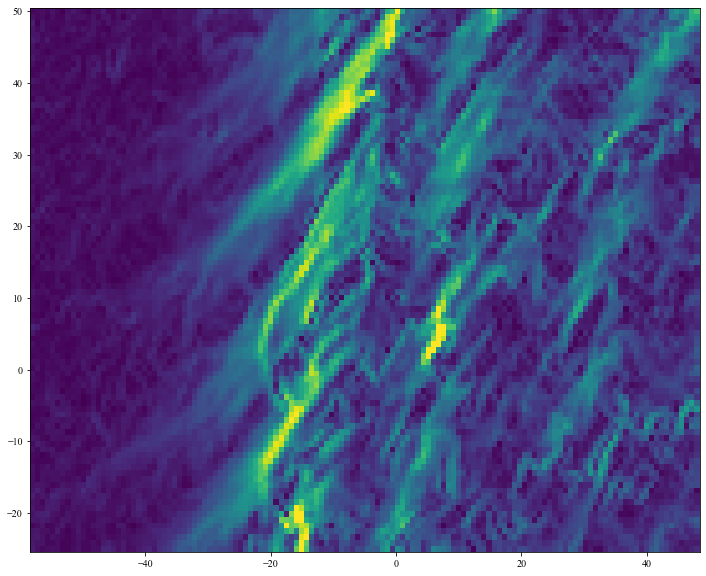

In [827]:
i=950
fig,ax = plt.subplots(figsize=(12,10))#,ncols=m,nrows=n,sharex=True,sharey=True)
ax.pcolormesh(X,Y,graduz[...,i],vmin=0,vmax=vmax)


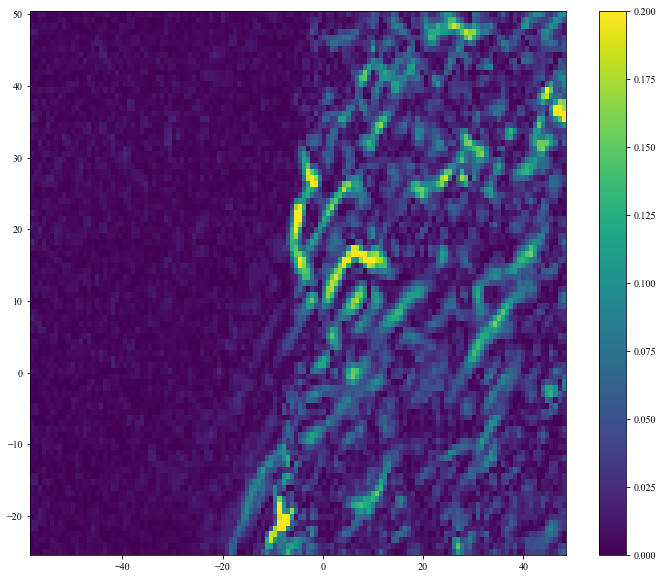

In [99]:
m=3
n=2
fig,ax = plt.subplots(figsize=(12,10))#,ncols=m,nrows=n,sharex=True,sharey=True)

i=800
vmax = 0.2
b = 5

divu = Udx[0,...]+Udy[1,...]

sc = ax.pcolormesh(X,Y,np.abs(divu)[...,i],vmin=0,vmax=vmax)
plt.colorbar(sc)
#graphes.legende('$X$ (m)','$Y$ (m)','title',axs=axs[i,j])



In [100]:
divu.shape

(93, 132, 3475)

In [111]:
print(Xt.shape)

(132, 3475)


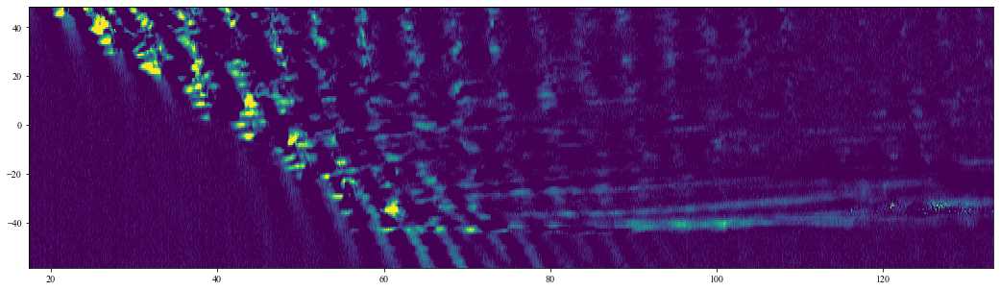

In [182]:
fractures = divu>0.1
np.sum(fractures,axis=(0,1,2))

385875

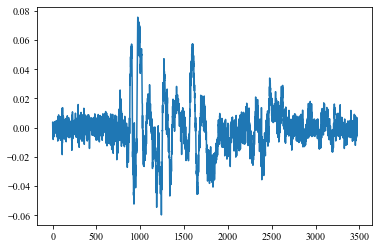

In [152]:
plt.plot(divu[50,60,:])

In [126]:
x = X[0,:]
y = Y[:,0]
X3d,Y3d,T3d = np.meshgrid(x,y,t)

print(X3d.shape)

(93, 132, 3475)


In [143]:
t = data['t']

In [176]:
fractures.shape

(93, 132, 3475)

In [183]:
i = 40
for j in range(90):
    print(j,np.sum(fractures[i,j,:]))

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
8 0
9 0
10 0
11 0
12 0
13 0
14 0
15 0
16 0
17 0
18 0
19 0
20 0
21 0
22 0
23 0
24 1
25 0
26 0
27 1
28 9
29 20
30 41
31 36
32 17
33 28
34 56
35 89
36 106
37 33
38 10
39 6
40 0
41 0
42 0
43 0
44 0
45 2
46 0
47 1
48 2
49 0
50 1
51 0
52 0
53 0
54 22
55 32
56 42
57 45
58 48
59 32
60 0
61 0
62 0
63 0
64 12
65 28
66 45
67 33
68 17
69 3
70 20
71 33
72 30
73 16
74 16
75 33
76 35
77 29
78 0
79 28
80 38
81 26
82 1
83 0
84 0
85 7
86 25
87 32
88 33
89 35


In [207]:
import numpy as np
import scipy.ndimage as ndimage

# Get local maximum values of desired neighborhood
# I'll be looking in a 5x5x5 area
img2 = ndimage.maximum_filter(divu, size=(5, 5, 5))

# Threshold the image to find locations of interest
# I'm assuming 6 standard deviations above the mean for the threshold
img_thresh = img2.mean() + img2.std() * 3

# Since we're looking for maxima find areas greater than img_thresh
labels, num_labels = ndimage.label(img2 > img_thresh)

print(num_labels)
# Get the positions of the maxima
coords = ndimage.measurements.center_of_mass(divu, labels=labels, index=np.arange(1, num_labels + 1))


650


<ipython-input-207-185f54f4cb5f>:17: DeprecationWarning: Please use `center_of_mass` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.
  coords = ndimage.measurements.center_of_mass(divu, labels=labels, index=np.arange(1, num_labels + 1))


In [538]:
dt = np.diff(t)[0]

In [233]:
[ny,nx] = X.shape
print(nx,ny)

132 93


In [742]:
gs

0.0030303030303030303


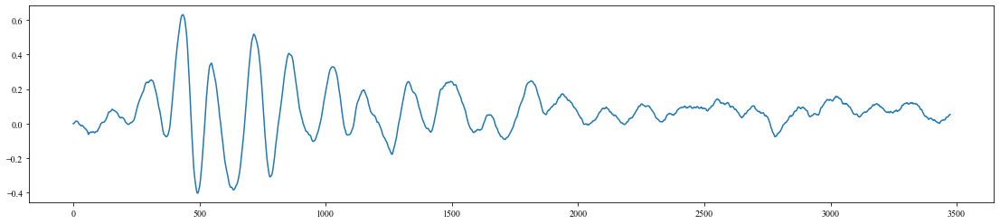

In [743]:
fig,ax = plt.subplots(figsize=(4.78*4,4))

i = 45
j = 100
ax.plot(h[i,j,:])
#ax.plot(h[i,j,:])

In [455]:
Mat = np.asarray([[dxxh,dxyh],[dyxh,dyyh]])
print(Mat.shape)

(2, 2, 93, 132, 3475)


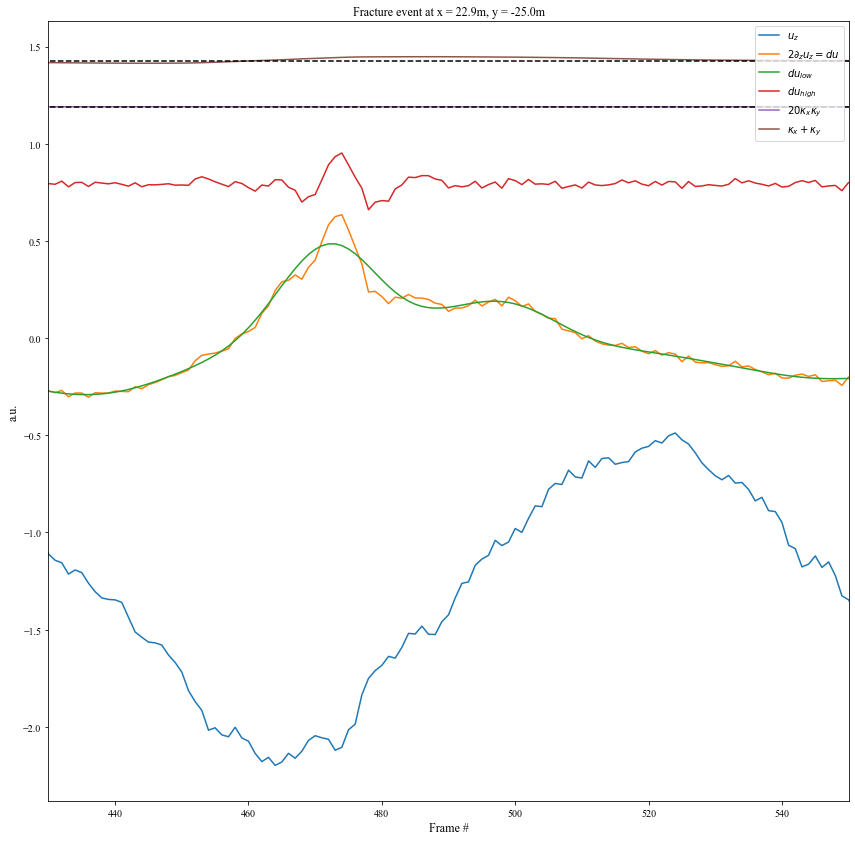

In [746]:
def display_exemple(i,j,tmin,tmax):
    fig,ax = plt.subplots(figsize=(4.78*3,4.78*3))

    ax.plot(data['u'][2,i,j,:]-1.2)
    ax.plot(Udx[2,i,j,:]*2)
    y = Udx[2,i,j,:]
    [b,a] = sig.butter(4,0.1,'low')
    y_low =  sig.filtfilt(b,a,y)
    frac = y - y_low

    nt = len(y)
        
    shift = np.max(y)*2.5
    shift2 = shift*1.5
    ax.plot(y_low*2)
    y_high = y-y_low
    ax.plot(y_high*2+shift)
    ax.plot(gauss[i,j,:]/5+shift2)

    ax.plot(kappa[i,j,:]/5+shift2*1.2)


    plt.legend(['$u_z$','$2\partial_z u_z = du$','$du_{low}$','$du_{high}$',r'$20 \kappa_x \kappa_y$','$\kappa_x + \kappa_y$'],fontsize=10,loc=1)
    
    #ax.plot(data['u'][2,i,j,:])
    ax.set_xlim([tmin,tmax])
    
    x0 = np.round(data['X'][0,j],decimals=1)
    y0 = np.round(data['Y'][0,j],decimals=1)

    ax.plot(shift2*np.ones(nt),'k--')
    ax.plot(shift2*1.2*np.ones(nt),'k--')

    figs = graphes.legende('Frame #','a.u.',f'Fracture event at x = {x0}m, y = {y0}m',ax=ax)
    
    return figs,ax

i = 45
j = 100
figs,ax = display_exemple(i,j,430,550)
#graphes.save_figs(figs,savedir=savefolder,prefix='')

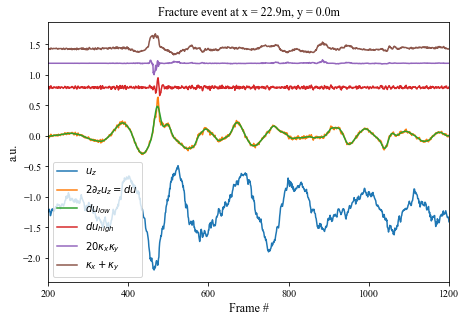

In [469]:


graphes.save_figs(figs,savedir=savefolder,overwrite=True)

In [470]:
dt = 600

res = {}
fc = 0.05
for key in ['Max','Min','indM','indm']:
    res[key]=np.zeros((ny,nx))
    
for i in range(ny):
    for j in range(nx):
    
        #ax.plot(Udx[2,i,j,:])
        y = Udx[2,i,j,:]
        y = kappa[i,j,:]
        [b,a] = sig.butter(4,fc,'low')
        y_low =  sig.filtfilt(b,a,y)
        frac = y - y_low
        indM = np.argmax(frac)
        indm = np.argmin(frac)
    
        res['Max'][i,j] = frac[indM]
        res['Min'][i,j] = frac[indm]
        res['indM'][i,j] = indM
        res['indm'][i,j] = indm
        
#shift = np.max(y)*1.5
#ax.plot(y_low)
#ax.plot(y-y_low+shift)
#ax.plot(data['u'][2,i,j,:])


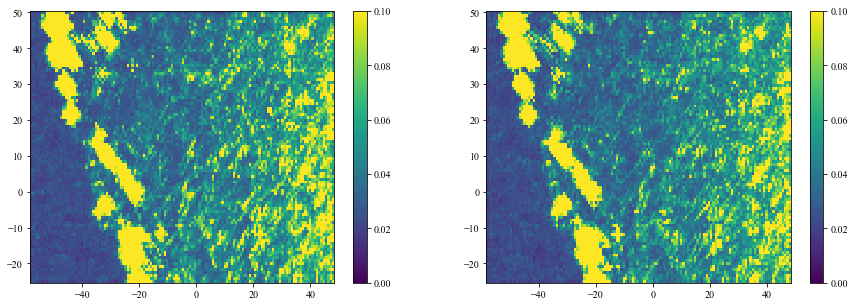

In [472]:
fig,ax = plt.subplots(figsize=(15,5),ncols=2)


sc=  ax[0].pcolormesh(X,Y,res['Max'],vmin=0,vmax=0.1)
plt.colorbar(sc)

sc=  ax[1].pcolormesh(X,Y,np.abs(res['Min']),vmin=0,vmax=0.1)
plt.colorbar(sc)

In [289]:
np.mean(res['Max'])

0.05839521597410959

-0.05762318591267472

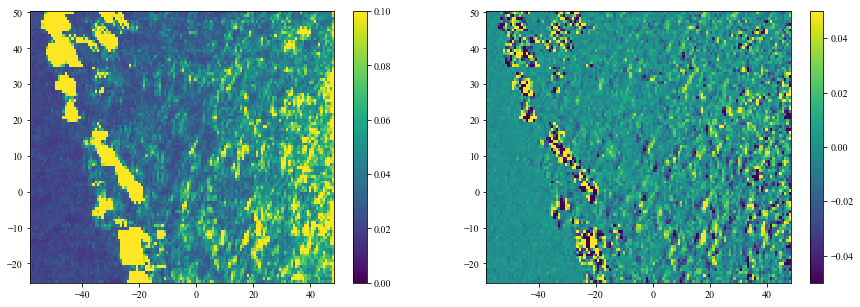

In [287]:
fig,ax = plt.subplots(figsize=(15,5),ncols=2)


sc=  ax[0].pcolormesh(X,Y,res['Max'],vmin=0,vmax=0.01)
plt.colorbar(sc)

sc=  ax[1].pcolormesh(X,Y,res['Max']-np.abs(res['Min']),vmin=-0.05,vmax=0.05)
plt.colorbar(sc)

In [445]:
import skimage

peaks = skimage.feature.peak_local_max(res['Max'], min_distance=5)

In [294]:
peaks[:,0]

array([79, 12, 31, 87, 68, 57, 38, 42, 25, 46, 85, 87, 82, 71, 36, 16, 80,
       63, 72, 74, 49, 58, 19, 11, 13, 26, 44, 41, 16, 15, 54, 44, 26, 72,
       45, 81, 34, 41, 87, 85, 69, 45, 26, 63, 19,  7, 56, 32, 66, 76, 31,
       27, 72, 67, 85, 67, 81, 76, 57, 62, 77, 42,  9, 19, 41, 27,  7])

In [302]:
print(y.shape)

(93,)


array([[0.02597624, 0.02394403, 0.02019582, ..., 0.06201765, 0.06264736,
        0.11212441],
       [0.02281045, 0.0200001 , 0.01877559, ..., 0.04343589, 0.04811085,
        0.09644722],
       [0.02623224, 0.02286189, 0.02080425, ..., 0.06023905, 0.07153532,
        0.16201839],
       ...,
       [0.03165707, 0.02269198, 0.02510308, ..., 0.0434985 , 0.03723562,
        0.05264731],
       [0.03545667, 0.0224209 , 0.02334463, ..., 0.04323421, 0.0502362 ,
        0.09114173],
       [0.02930901, 0.0231673 , 0.02267534, ..., 0.038301  , 0.04273073,
        0.09581344]])

In [316]:
forme = ny/nx

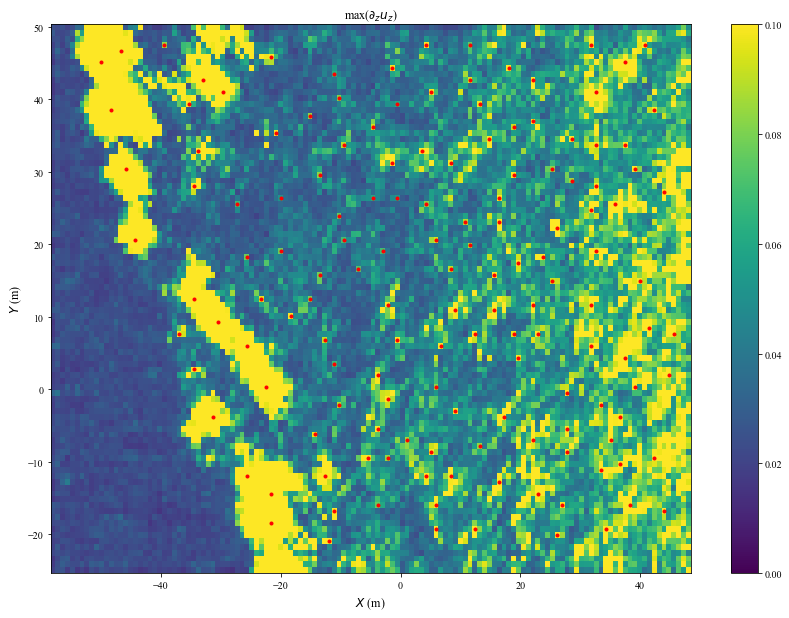

In [534]:
fig,ax = plt.subplots(figsize=(4.78*3,3*4.78*forme))#,ncols=2)

peaks = skimage.feature.skimage.feature.peak_local_max(image, min_distance=1,(res['Max'], min_distance=3)
sc=  ax.pcolormesh(X,Y,res['Max'],vmin=0,vmax=0.1)
plt.colorbar(sc)

n,_ = peaks.shape

y = data['Y'][:,0]


res['positions']=[]
for i in range(n):
    iind = peaks[i,0]
    jind = peaks[i,1]
    if res['Max'][iind,jind]>0.05:
        ax.plot(x[jind],y[iind],'r.')
        tind = int(res['indM'][iind,jind])
        res['positions'].append([iind,jind,tind])
figs = graphes.legende('$X$ (m)','$Y$ (m)','max($\partial_z u_z$)')

graphes.save_figs(figs,savedir=savefolder,prefix='location_fractures_gauss_',overwrite=True)

In [452]:
len(res['positions'])/2

57.0

0.0015151515151515152


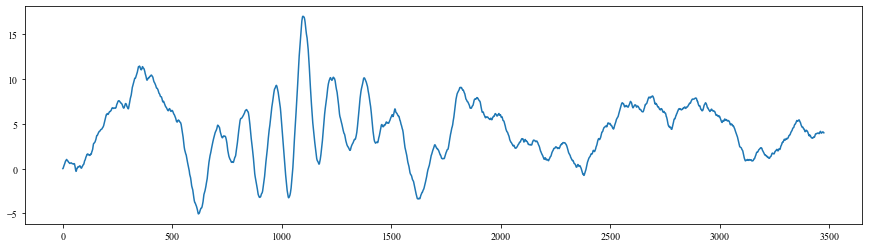

In [371]:
fig,ax = plt.subplots(figsize=(15,4))#,ncols=2)
ax.plot(h[40,40,:])

In [372]:
dxh,dyh = np.gradient(uz,axis=(0,1))

KeyboardInterrupt: 

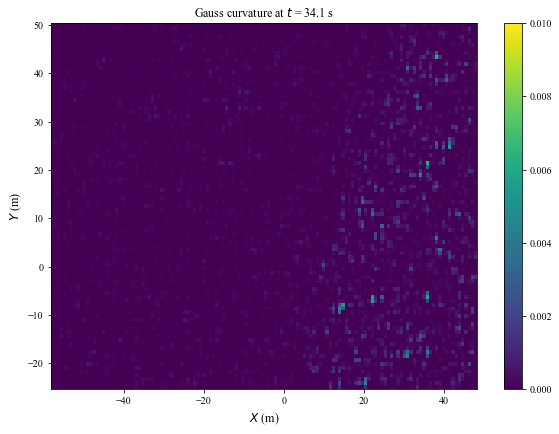

In [747]:
fig,ax = plt.subplots(figsize=(2*4.78,2*4.78*forme))#,ncols=2)
t = data['t']
i0 = 400
for i in range(i0,1200,1):
    t0 = np.round(t[i],decimals=1)
    sc = ax.pcolormesh(X,Y,gauss[:,:,i],vmin=0,vmax=0.01)
    if i==i0:
        plt.colorbar(sc)
    
    figs = graphes.legende('$X$ (m)','$Y$ (m)',f'Gauss curvature at $t$ = {t0} s')
    graphes.save_figs(figs,savedir=savefolder+f'/movie_gauss/',prefix=f'movie_{i}',frmt='png')

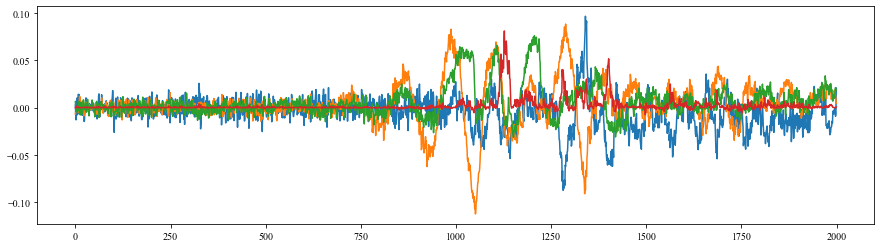

In [405]:
fig,ax = plt.subplots(figsize=(15,4))#,ncols=2)
ax.plot(kappa[20,40,:2000])
ax.plot(Udx[2,20,40,:2000])
ax.plot(divu[20,40,:2000])
ax.plot(gauss[20,40,:2000]*50)

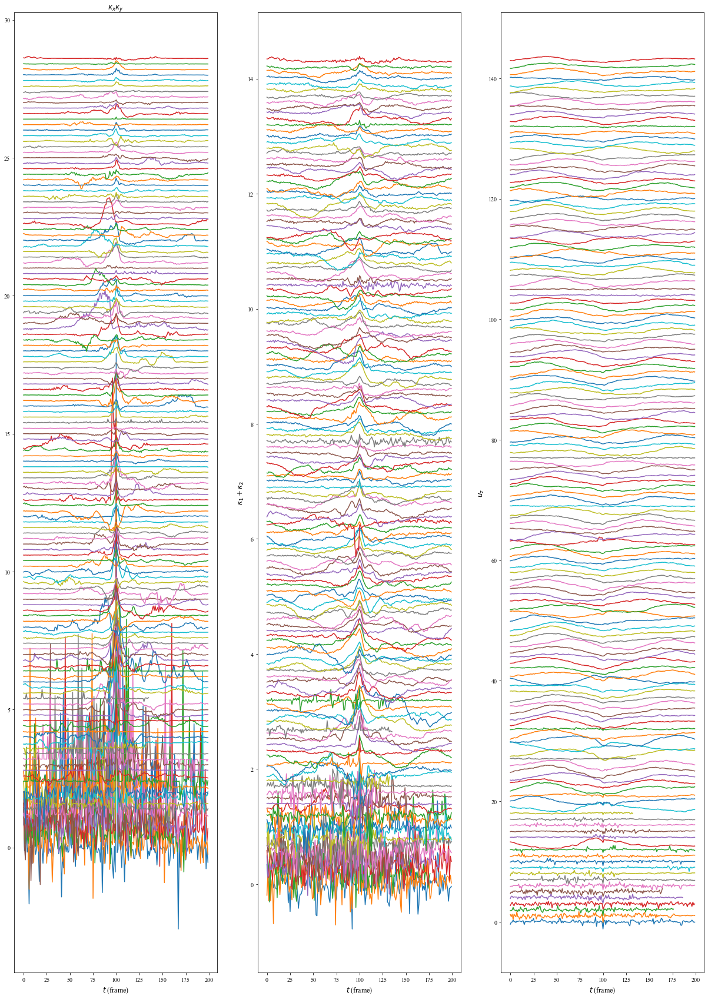

In [488]:
ncol = 3
fig,axs = plt.subplots(figsize=(7*ncol,30),ncols=ncol)

dt=100
b = 20

fc = 0.05
for k,pos in enumerate(res['positions'][:-2]):
    i = pos[0]
    j = pos[1]
    tmax = pos[2]

    y = Udx[2,i,j,:]
    [b,a] = sig.butter(4,fc,'low')
    y_low =  sig.filtfilt(b,a,y)
    frac = y - y_low
    #print(tmax)
#    axs[0].plot(frac[tmax-dt:tmax+dt]+k*0.1)
#    graphes.legende('$t$ (frame)',r'$Cr$','',ax=axs[0])

    u = data['u'][2,i,j,tmax-dt:tmax+dt]
    axs[2].plot(u+k)
    graphes.legende('$t$ (frame)',r'$u_z$','',ax=axs[2])
    
    axs[1].plot(kappa[i,j,tmax-dt:tmax+dt]+k*0.1)
    graphes.legende('$t$ (frame)',r'$\kappa_1 + \kappa_2$','',ax=axs[1])

    axs[0].plot(gauss[i,j,tmax-dt:tmax+dt]*50+k*0.2)
    graphes.legende('$t$ (frame)','','$\kappa_x \kappa_y$',ax=axs[0])

    #print(kappa[i,j,tmax])

#    ax.plot(data['u'][2,i,j,tmax-dt:tmax+dt]+k)

In [505]:
len(res['positions'])

146

In [725]:
data['X'][i,:]

array([-58.        , -57.19083969, -56.38167939, -55.57251908,
       -54.76335878, -53.95419847, -53.14503817, -52.33587786,
       -51.52671756, -50.71755725, -49.90839695, -49.09923664,
       -48.29007634, -47.48091603, -46.67175573, -45.86259542,
       -45.05343511, -44.24427481, -43.4351145 , -42.6259542 ,
       -41.81679389, -41.00763359, -40.19847328, -39.38931298,
       -38.58015267, -37.77099237, -36.96183206, -36.15267176,
       -35.34351145, -34.53435115, -33.72519084, -32.91603053,
       -32.10687023, -31.29770992, -30.48854962, -29.67938931,
       -28.87022901, -28.0610687 , -27.2519084 , -26.44274809,
       -25.63358779, -24.82442748, -24.01526718, -23.20610687,
       -22.39694656, -21.58778626, -20.77862595, -19.96946565,
       -19.16030534, -18.35114504, -17.54198473, -16.73282443,
       -15.92366412, -15.11450382, -14.30534351, -13.49618321,
       -12.6870229 , -11.8778626 , -11.06870229, -10.25954198,
        -9.45038168,  -8.64122137,  -7.83206107,  -7.02

In [572]:
dt

0.03336670003336906

In [625]:
instants = [20,21,25,28,29,30,31,33,35,37,39,40,41,42,43,45,46,47,48,49,53,54,55,56,57,58,59,60,64,66,67,68,70,75,76,78,79,81,82,83,84,85,86,88,89,90,91,92,96,99,102,106,108,110,112,115,117,118,124,133]

In [804]:
def display_exemple(i,j,tmin,tmax,ax=None,ind=None):
    if ax==None:
        fig,ax = plt.subplots(figsize=(4.78*1.5,4.78))

    ax.plot(data['u'][2,i,j,:]-1.2)
#    ax.plot(Udx[2,i,j,:])
    
    
    y = Udx[2,i,j,:]
    [b,a] = sig.butter(4,0.1,'low')
    y_low =  sig.filtfilt(b,a,y)
    frac = y - y_low
    y_high = y-y_low

    shift = np.max(y)*2.5
    shift2 = shift*1.5
    ax.plot(y_high*2+shift)

    fs = 0.1/33
    y=data['u'][2,i,j,:]
    [b,a] = sig.butter(4,fs,'high')
    y_high =  sig.filtfilt(b,a,y)
    h = np.cumsum(y_high)*dt


#    ax.plot(frac*10+shift)
    #ax.plot(y_low)
    #ax.plot(gauss[i,j,:]*50+shift2)
    ax.plot(kappa[i,j,:]*5)#+shift2*1.2)

    
    ax.plot(np.diff(kappa[i,j,:])*100)#+shift2*1.2)

    #dtkap = np.diff(kappa[i,j,:])
    #fs = 0.05
    #y=data['u'][2,i,j,:]
    #[b,a] = sig.butter(4,fs,'low')
    #dkt_low =  sig.filtfilt(b,a,dtkap)
    #ax.plot(dkt_low*100)#+shift2*1.2)


    criterion = kappa[i,j,:]
    peaks = sig.find_peaks(criterion,distance=30,prominence=0.001)[0]
    ax.plot(peaks,criterion[peaks]*5,'rx')

    t0 = tmin+(tmax-tmin)/2


    peaks = sig.find_peaks(h,distance=30,prominence=0.01)[0]
    fact = 5
    ax.plot(h*fact)

    ax.plot([t0,t0],[-2,2],'k--',alpha=0.3)

    ax.plot(peaks,fact*h[peaks],'rx')

    #closest max before & after
    indMb = np.argmin(np.abs(peaks[peaks<=t0]-t0))
    indMa = np.argmin(np.abs(peaks[peaks>t0]-t0))
    tMb = peaks[peaks<=t0][indMb]
    tMa = peaks[peaks>t0][indMa]

    AMb = h[peaks[indMb]]
    AMa = h[peaks[indMa]]
    Dt = tMa-tMb
    print((t0-tMb)/Dt)
    
    peaks = sig.find_peaks(-h,distance=30,prominence=0.01)[0]
    indmb = np.argmin(np.abs(peaks[peaks<=t0]-t0))
    indma = np.argmin(np.abs(peaks[peaks>t0]-t0))
    tmb = peaks[peaks<=t0][indmb]
    tma = peaks[peaks>t0][indma]

    Amb = h[peaks[indmb]]
    Ama = h[peaks[indma]]
    Dtm = tma-tmb
    phim = (t0-tmb)/Dtm
    
    #if phim>=0.5:
    #    phim = phim-0.5
    #else:
    #    phim = phim+0.5
    print(phim)
    
    ax.plot(peaks,fact*h[peaks],'r+')

            
    plt.legend(['$u_z$','$du_{high}$',r'$20 \kappa_x + \kappa_y$',r'$partial_t \kappa$','$h$'],fontsize=10,loc=1)
    
    #ax.plot(data['u'][2,i,j,:])
    ax.set_xlim([tmin,tmax])
    
    x0 = np.round(data['X'][0,j],decimals=1)
    y0 = np.round(data['Y'][i,0],decimals=1)
    figs = graphes.legende('Frame #','a.u.',f'Fracture event {ind} at x = {x0}m, y = {y0}m',ax=ax)

    res = {}

    res['phiM'] = (t0-tMb)/Dt
    res['phim'] = phim #(t0-tmb)/Dt
    res['hc'] = h[int(t0)]
    res['AMac'] = AMb
    res['AMbc'] = AMa
    res['Amac'] = Amb
    res['Ambc'] = Ama

    res['kappac'] = kappa_abs[i,j,int(t0)]    

    res['x']=data['X'][0,j]
    res['y']=data['Y'][i,0]

    return figs,ax,res

In [703]:
pos

[11, 67, 710]

0.11029411764705882
0.6416666666666667


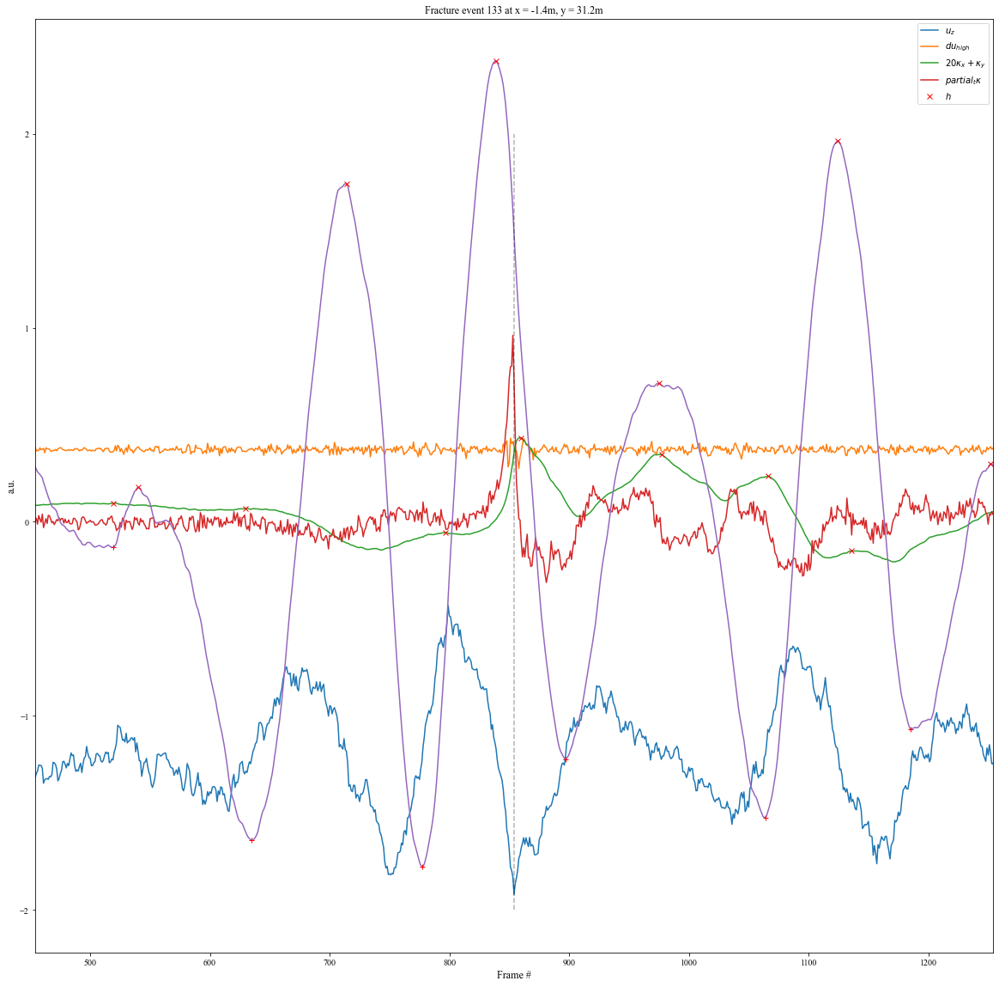

In [805]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[9]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 400
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.1746031746031746
0.6434108527131783


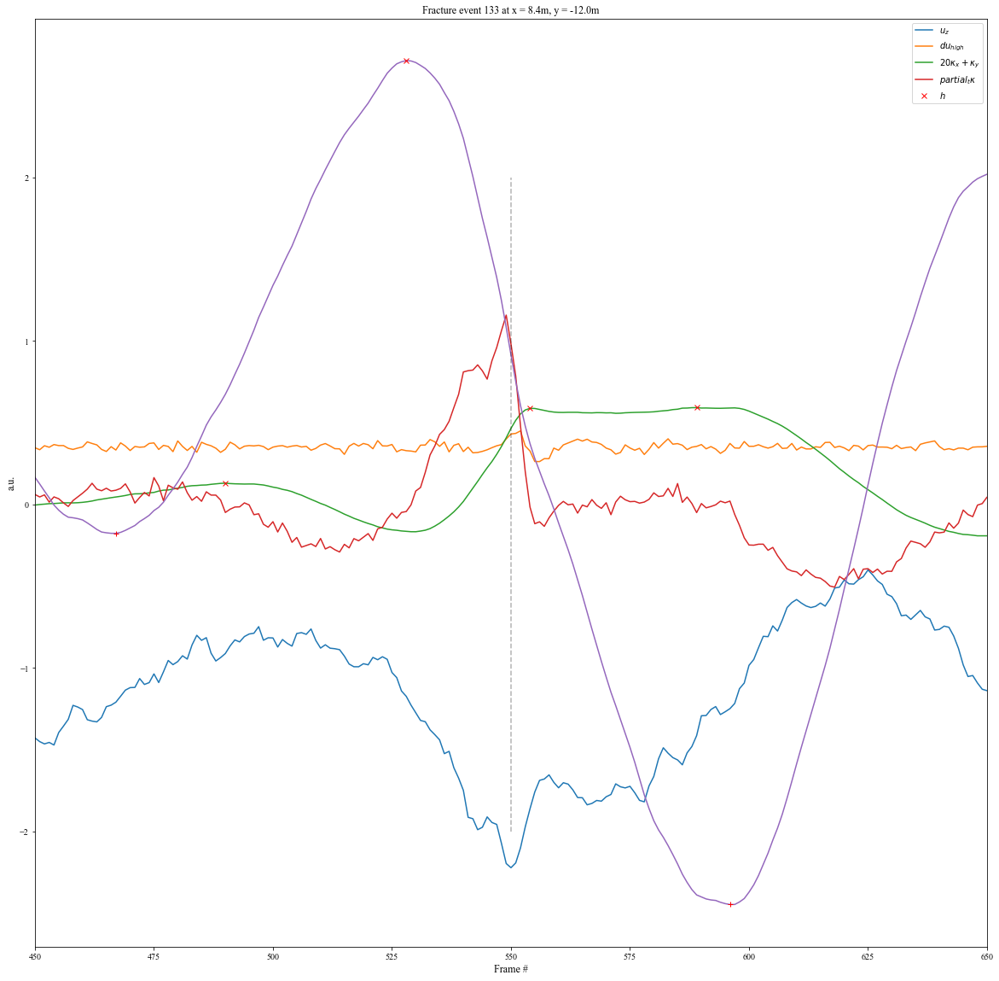

In [807]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[12]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 100
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.14965986394557823
0.6692913385826772


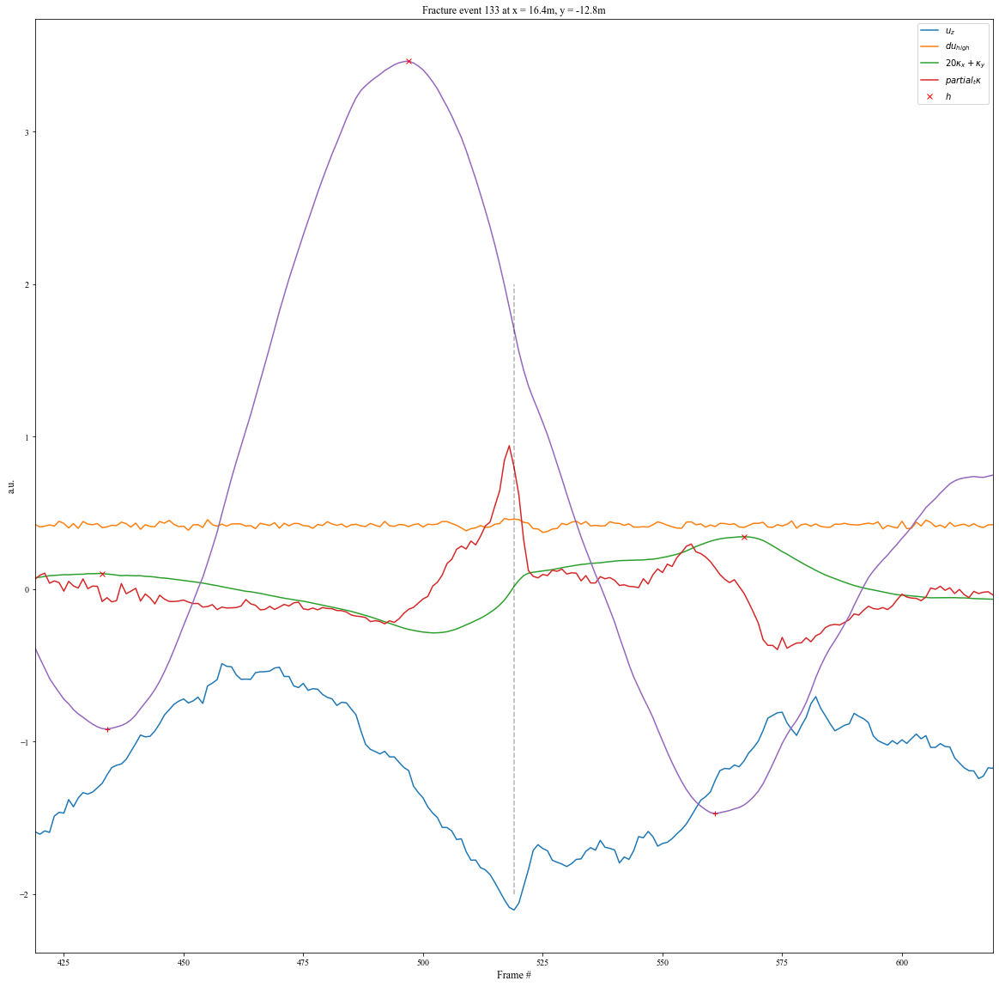

In [808]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[15]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 100
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.39655172413793105
0.8888888888888888


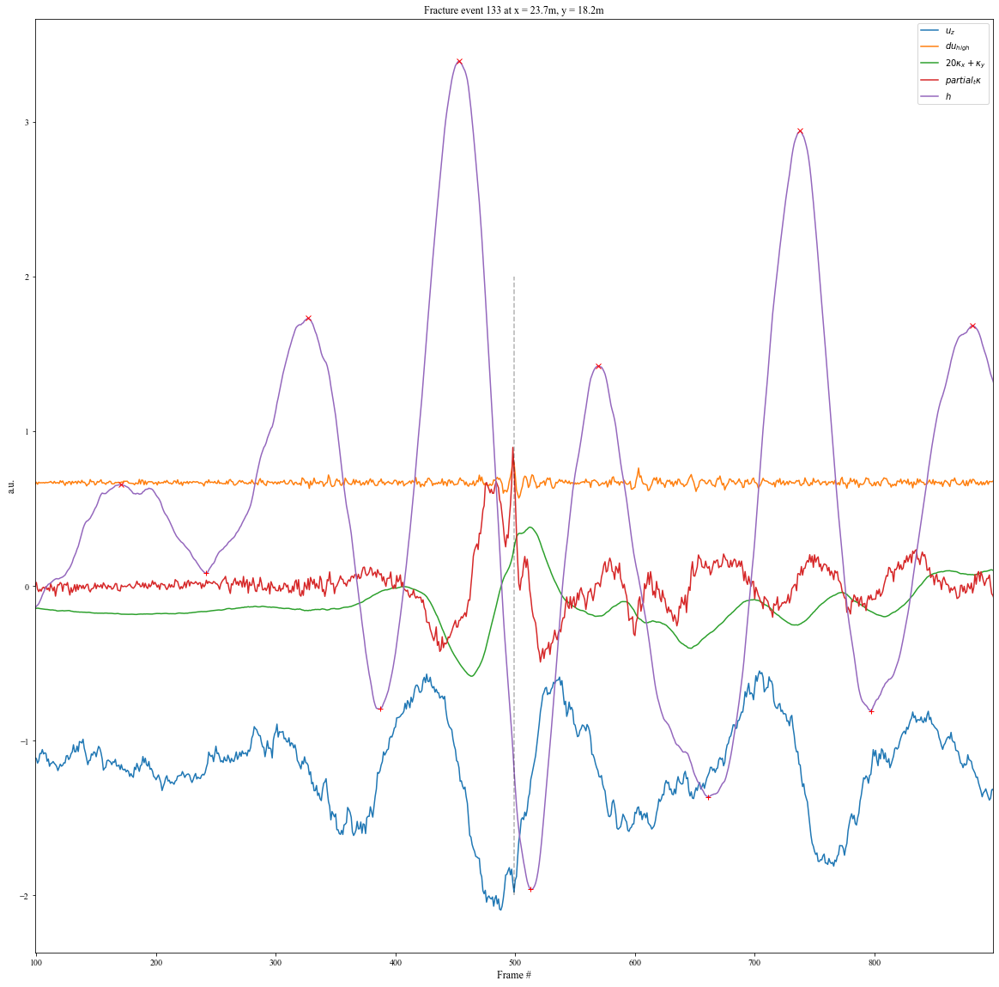

In [787]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[22]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 400
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

0.14906832298136646
0.6119402985074627


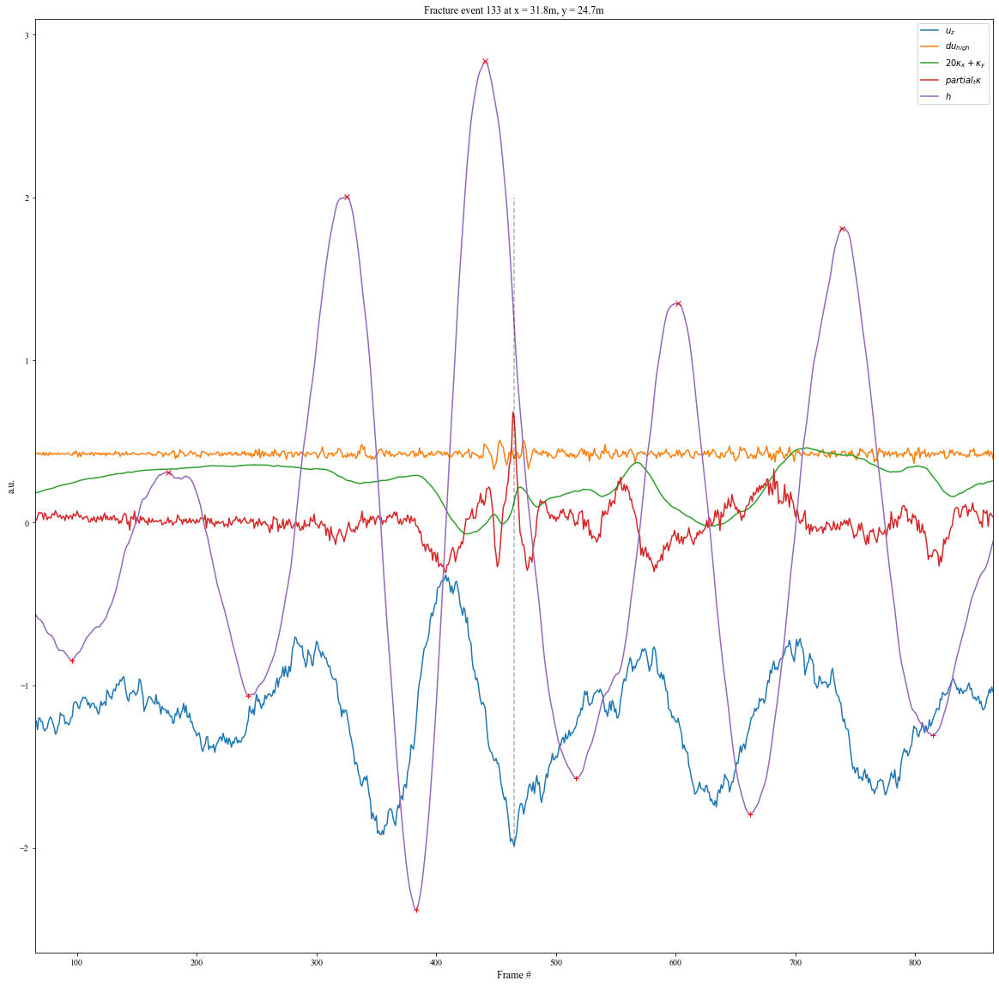

In [789]:
fig,ax = plt.subplots(figsize=(20,20))#,ncols=3,nrows=20)

pos = res['positions'][instants[17]]
i = pos[0]
j = pos[1]
tmax = pos[2]

dtvis = 400
figs,ax,result = display_exemple(i,j,tmax-dtvis,tmax+dtvis,ax=ax,ind=k)

graphes.save_figs(figs,savedir=savefolder,prefix='example_',overwrite=True)

In [557]:
len(res['positions'])

146

0.2857142857142857
0.7611940298507462
0.032
0.514792899408284
0.2064516129032258
0.768
0.10256410256410256
0.6115702479338843
0.5882352941176471
0.05333333333333334
0.0603448275862069
0.5923076923076923
0.16149068322981366
0.6518518518518519
0.15483870967741936
0.6984126984126984
0.15723270440251572
0.6259541984732825
0.11029411764705882
0.6416666666666667
0.12080536912751678
0.6909090909090909
0.7
0.16666666666666666
0.1746031746031746
0.6434108527131783
0.25874125874125875
0.8012820512820513
0.22972972972972974
0.7916666666666666
0.14965986394557823
0.6692913385826772
0.07627118644067797
0.5966386554621849
0.14906832298136646
0.6119402985074627
0.16352201257861634
0.5562913907284768
0.12352941176470589
0.5033557046979866
0.38333333333333336
0.859375
0.4166666666666667
0.937007874015748
0.39655172413793105
0.8888888888888888
0.19375
0.72
0.1864406779661017
0.6515151515151515
0.25833333333333336
0.75
0.18110236220472442
0.7094017094017094
0.2392638036809816
0.853448275862069
0.13924050

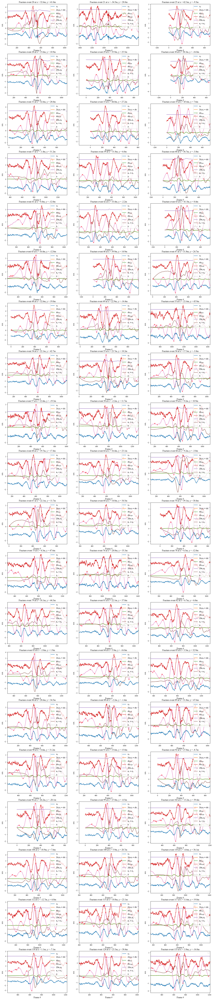

In [752]:
fig,axs = plt.subplots(figsize=(20,100),ncols=3,nrows=20)
axs  = np.reshape(axs,(3*20,))

results=[]
for ind,(ax,inst) in enumerate(zip(axs,instants)):
    k = inst
    #print(inst)
    
    pos = res['positions'][k]
    i = pos[0]
    j = pos[1]
    tmax = pos[2]

    figs,ax,result = display_exemple(i,j,tmax-500,tmax+500,ax=axs[ind],ind=k)
    results.append(result)

In [733]:
results[0].keys()

dict_keys(['phiM', 'phim', 'hc', 'AMac', 'AMbc', 'Amac', 'Ambc', 'x', 'y'])

In [749]:
results[0].keys()

dict_keys(['phiM', 'phim', 'hc', 'AMac', 'AMbc', 'Amac', 'Ambc', 'x', 'y'])

(0.0, 1.0)

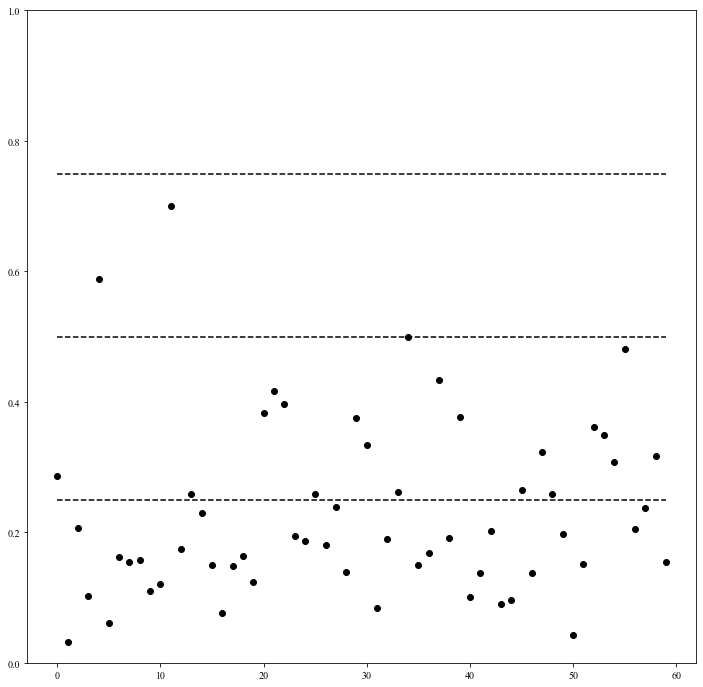

In [753]:
fig,ax = plt.subplots(figsize=(12,12))#,ncols=3,nrows=20)

phases = []
for i,result in enumerate(results):
    phase = (result['phiM'])#+result['phim'])/2
    #dphi = #np.abs((result['phiM']-result['phim']))
    ax.plot(i,phase,'ko')#,yerr=dphi,marker='o')
    phases.append(phase)

phases = np.asarray(phases)
samples = range(60)
ax.plot(samples,0.5*np.ones(60),'k--')
ax.plot(samples,0.25*np.ones(60),'k--')
ax.plot(samples,0.75*np.ones(60),'k--')

ax.set_ylim([0,1])

(0.0, 1.0)

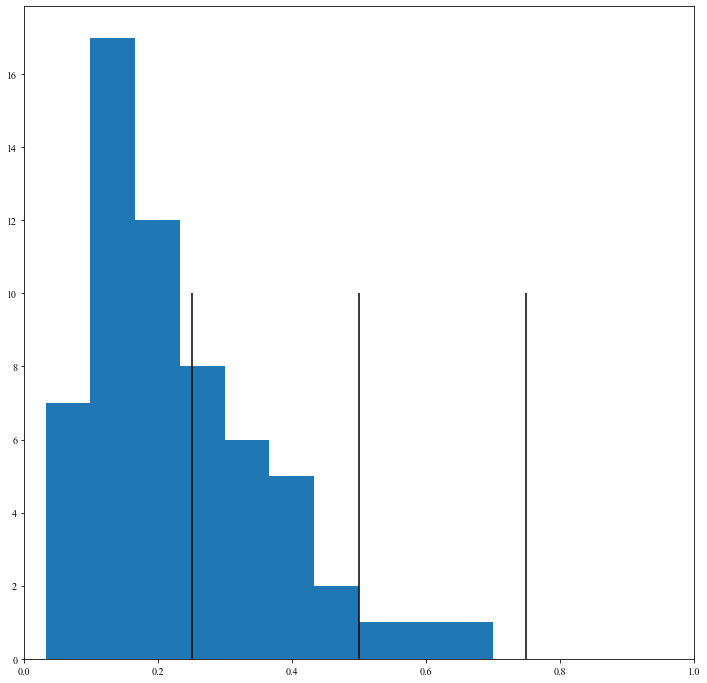

In [754]:
fig,ax = plt.subplots(figsize=(12,12))#,ncols=3,nrows=20)
plt.hist(phases,10)

ax.vlines(0.5,0,10,color='k')
ax.vlines(0.25,0,10,'k')
ax.vlines(0.75,0,10,'k')

ax.set_xlim([0,1])

In [711]:
result.keys()

dict_keys(['phiM', 'phim', 'hc', 'AMac', 'AMbc', 'Amac', 'Ambc', 'x', 'y'])

(0.0, 0.75)

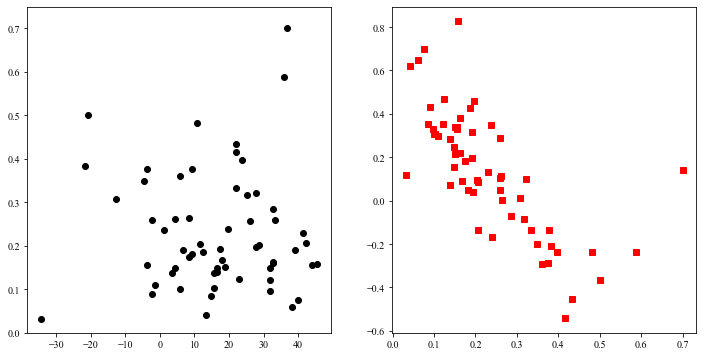

In [756]:
fig,axs = plt.subplots(figsize=(12,6),ncols=2)#,nrows=20)

phases = []
for i,result in enumerate(results):
    phase = (result['phiM'])#+result['phim'])/2
    x = result['x']#+result['phim'])/2
    y = result['y']#+result['phim'])/2

    hc = result['hc']#+result['phim'])/2
    #print(y)
    #dphi = #np.abs((result['phiM']-result['phim']))
    axs[0].plot(x,phase,'ko')#,yerr=dphi,marker='o')
    #axs[0].plot(y,phase+1,'rs')#,yerr=dphi,marker='o')

    axs[1].plot(phase,hc,'rs')
    phases.append(phase)

phases = np.asarray(phases)
samples = range(60)
#ax.plot(samples,0.5*np.ones(60),'k--')
#ax.plot(samples,0.25*np.ones(60),'k--')
#ax.plot(samples,0.75*np.ones(60),'k--')

axs[0].set_ylim([0,0.75])

(0.0, 0.75)

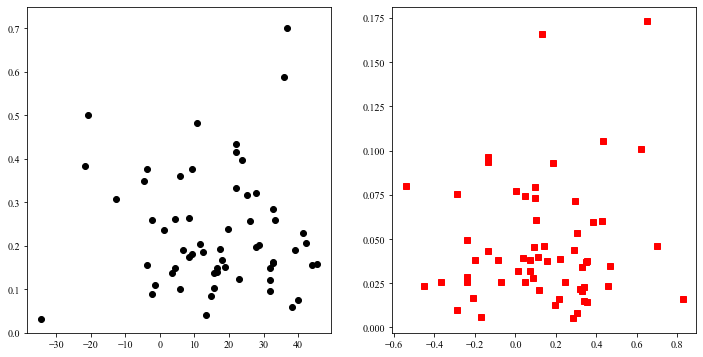

In [759]:
fig,axs = plt.subplots(figsize=(12,6),ncols=2)#,nrows=20)

phases = []
for i,result in enumerate(results):
    phase = (result['phiM'])#+result['phim'])/2
    x = result['x']#+result['phim'])/2
    y = result['y']#+result['phim'])/2

    hc = result['hc']#+result['phim'])/2
    kappac = result['kappac']#+result['phim'])/2
    #print(y)
    #dphi = #np.abs((result['phiM']-result['phim']))
    axs[0].plot(x,phase,'ko')#,yerr=dphi,marker='o')
    #axs[0].plot(y,phase+1,'rs')#,yerr=dphi,marker='o')

    axs[1].plot(hc,kappac,'rs')
    phases.append(phase)

phases = np.asarray(phases)
samples = range(60)
#ax.plot(samples,0.5*np.ones(60),'k--')
#ax.plot(samples,0.25*np.ones(60),'k--')
#ax.plot(samples,0.75*np.ones(60),'k--')

axs[0].set_ylim([0,0.75])

In [698]:
bool = np.abs(phases-0.1)<0.1
indices = np.where(bool)[0]
print(indices)
print(len(indices))


[ 1  3  5  6  7  8  9 10 12 15 16 17 18 19 23 24 26 28 31 32 35 36 38 40
 41 43 44 46 49 50 51 59]
32


In [699]:
results = len(np.asarray(results)[bool])

In [700]:
print(len(indices))

32


(0.0, 1.0)

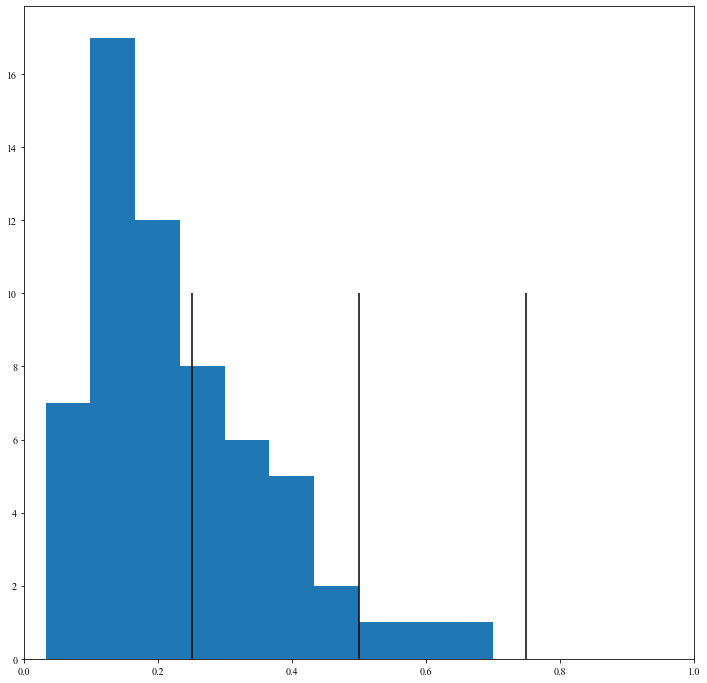

0.032
0.514792899408284
0.10256410256410256
0.6115702479338843
0.0603448275862069
0.5923076923076923
0.16149068322981366
0.6518518518518519
0.15483870967741936
0.6984126984126984
0.15723270440251572
0.6259541984732825
0.11029411764705882
0.6416666666666667
0.12080536912751678
0.6909090909090909
0.1746031746031746
0.6434108527131783
0.14965986394557823
0.6692913385826772
0.07627118644067797
0.5966386554621849
0.14906832298136646
0.6119402985074627
0.16352201257861634
0.5562913907284768
0.12352941176470589
0.5033557046979866
0.19375
0.72
0.1864406779661017
0.6515151515151515
0.18110236220472442
0.7094017094017094
0.13924050632911392
0.7090909090909091
0.08450704225352113
0.6341463414634146
0.19047619047619047
0.7209302325581395
0.14925373134328357
0.6183206106870229
0.1678832116788321
0.7083333333333334
0.19135802469135801
0.7251908396946565
0.10077519379844961
0.6090225563909775
0.1377245508982036
0.640625
0.09016393442622951
0.616
0.0963855421686747
0.5864661654135338
0.138157894736842

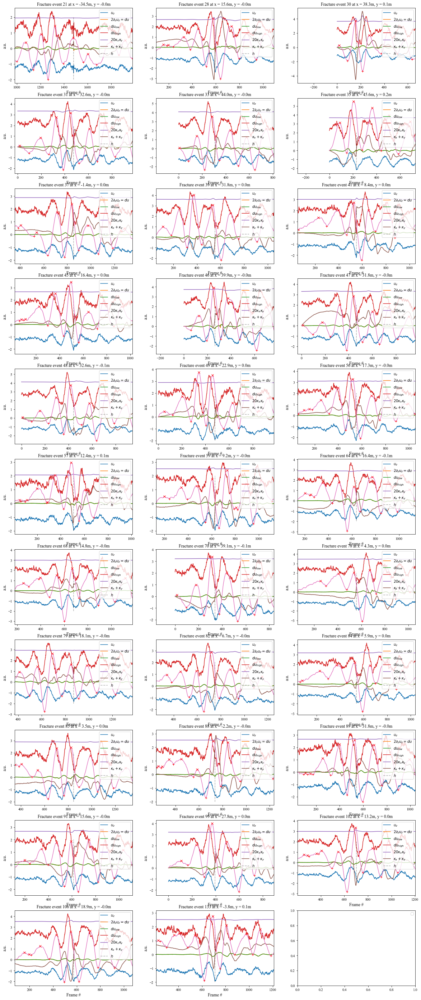

In [702]:
fig,axs = plt.subplots(figsize=(20,50),ncols=3,nrows=11)
axs  = np.reshape(axs,(3*11,))

results=[]
for ind,(ax,indice) in enumerate(zip(axs,indices)):
    #print(indices)
    k = instants[indice]
    #print(inst)
    
    pos = res['positions'][k]
    i = pos[0]
    j = pos[1]
    tmax = pos[2]

    figs,ax,result = display_exemple(i,j,tmax-500,tmax+500,ax=axs[ind],ind=k)
    results.append(result)

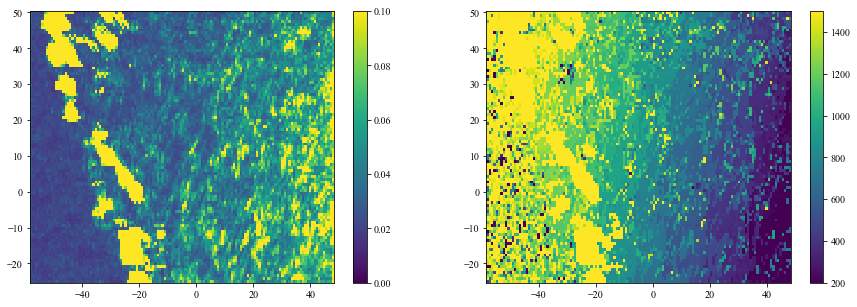

In [284]:
fig,ax = plt.subplots(figsize=(15,5),ncols=2)


sc=  ax[1].pcolormesh(X,Y,res['indM'],vmin=200,vmax=1500)
plt.colorbar(sc)
sc=  ax[0].pcolormesh(X,Y,np.abs(res['Max']),vmin=0,vmax=0.1)
plt.colorbar(sc)

In [209]:
coords = np.asarray(coords).astype(int)
print(coords)

[[   0   43 1326]
 [   0   44 1370]
 [   0   43 1483]
 ...
 [  91  118 1177]
 [  91  121 1165]
 [  91  130  228]]


NameError: name 'toto' is not defined

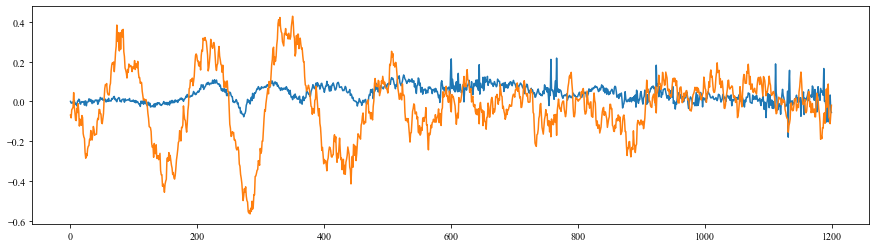

In [211]:
fig,ax = plt.subplots(figsize=(15,4))

dt = 600
for c in coords:
    i = c[0]
    j = c[1]
    tmax = int(c[2])
    ax.plot(divu[i,j,tmax-dt:tmax+dt])
    ax.plot(data['u'][2,i,j,tmax-dt:tmax+dt])
    toto

In [169]:
X[i,j,]

ValueError: 3 indexing arguments for 2 dimensions

(93, 132, 3475)
(3475,)
(3475,)
106


(200.0, 1500.0)

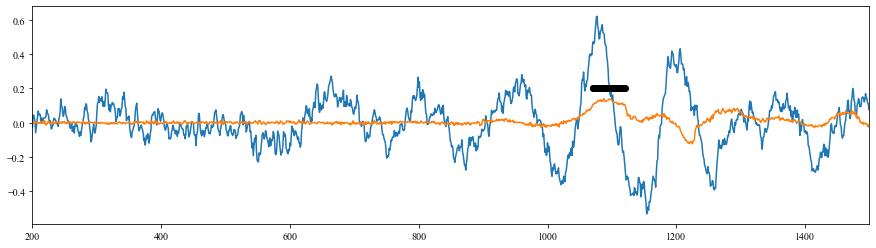

In [184]:
fig,ax = plt.subplots(figsize=(15,4))

i = 40
j = 36
print(divu.shape)
print(t.shape)
z = divu[i][j]
print(z.shape)

tind = np.arange(len(t))
b=4
ax.plot(data['u'][2,i,j,:])
ax.plot(divu[i,j,:])
#ax.plot(Udx[0,i,j,:]*b)
#ax.plot(Udy[1,i,j,:]*b)

nf = np.sum(fractures[i,j,:])
print(nf)
ax.plot(tind[fractures[i,j,:]],0.2*np.ones(nf),'ko')
ax.set_xlim([200,1500])

{1: {'fignum': 'Y_m_vs_X_m', 'data': {}}}

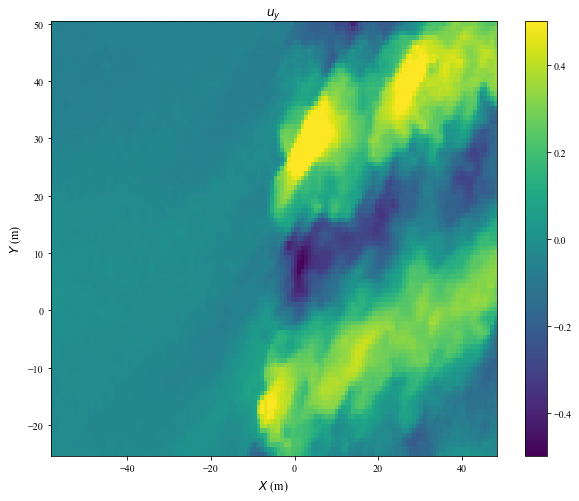

In [46]:
fig,ax = plt.subplots(figsize=(10,8))

X = data['X']
Y = data['Y']
i=800
sc = ax.pcolormesh(X,Y,data['u'][1,:,:,i],vmin=-0.5,vmax=0.5)
plt.colorbar(sc)

graphes.legende('$X$ (m)','$Y$ (m)','$u_y$')